In [1]:
import pandas as pd
import numpy as np
import pandas_datareader.data as web
import seaborn as sns
import datetime as dt
import matplotlib.pyplot as plt
import matplotlib as mpl


In [2]:
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, LSTM, TimeDistributed, RepeatVector

from keras.regularizers import L1L2
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
from sklearn.preprocessing import MinMaxScaler

In [3]:
#匯入資料
import pandas as pd
riskfactor = pd.read_excel (r'C:\Users\88691\Desktop\Data\0050\RiskFactorData.xlsx')
closeprice = pd.read_excel (r'C:\Users\88691\Desktop\Data\0050\PriceData.xlsx')

InvTrgt=['1101',
'1216',
'1301',
'1303',
'1326',
'1590',
'2002',
'2207',
'2227',
'2303',
'2308',
'2317',
'2327',
'2330',
'2352',
'2357',
'2379',
'2382',
'2395',
'2408',
'2409',
'2412',
'2454',
'2603',
'2609',
'2610',
'2615',
'2801',
'2880',
'2881',
'2882',
'2883',
'2884',
'2885',
'2886',
'2887',
'2891',
'2892',
'2912',
'3008',
'3034',
'3037',
'3045',
'3711',
'4904',
'5871',
'5876',
'5880',
'6415',
'6505',
'8046',
'8454',
'9910',
]

In [4]:
#最近一期財務指標
companies = riskfactor[(riskfactor['年月'] == '2021-09-30')]
companies

,公司,年月,ROA－綜合損益,ROE－綜合損益,淨值/資產,負債比率,營收成長率,股利支付率,折舊性FA成長率
53,1101 台泥,2021-09-30,2.83,5.09,55.04,44.96,-6.50,NaN,3.80
54,1216 統一,2021-09-30,4.14,11.62,34.73,65.27,4.96,NaN,-3.97
55,1301 台塑,2021-09-30,13.32,18.69,72.98,27.02,51.85,NaN,12.34
56,1303 南亞,2021-09-30,12.07,19.41,63.24,36.76,56.53,NaN,7.21
57,1326 台化,2021-09-30,11.17,15.01,74.46,25.54,50.15,NaN,0.64
58,1590 亞德客-KY,2021-09-30,10.15,18.56,55.07,44.93,43.17,NaN,10.93
59,2002 中鋼,2021-09-30,7.92,15.02,54.52,45.48,49.16,NaN,-3.85
60,2207 和泰車,2021-09-30,5.16,18.32,27.51,72.49,11.11,NaN,12.59
61,2227 裕日車,2021-09-30,7.08,9.57,69.62,30.38,-10.58,NaN,-1.22
62,2303 聯電,2021-09-30,10.01,16.36,60.08,39.92,17.02,NaN,-5.18


In [5]:
#將選後的個股財報資訊存放於個別dataframe
fin = {} 
for name in InvTrgt:
  #name[:4] 文字前四位為股票代碼
  fin[name[:4]] = riskfactor[riskfactor['公司'].str[:4] == name]

In [6]:
#先分析財報資訊，決定投資個股業並下載股價資訊
tickers  = []
for name  in InvTrgt:
  stock = name[:4] +".TW"
  tickers.append(stock)
tickers

['1101.TW',
 '1216.TW',
 '1301.TW',
 '1303.TW',
 '1326.TW',
 '1590.TW',
 '2002.TW',
 '2207.TW',
 '2227.TW',
 '2303.TW',
 '2308.TW',
 '2317.TW',
 '2327.TW',
 '2330.TW',
 '2352.TW',
 '2357.TW',
 '2379.TW',
 '2382.TW',
 '2395.TW',
 '2408.TW',
 '2409.TW',
 '2412.TW',
 '2454.TW',
 '2603.TW',
 '2609.TW',
 '2610.TW',
 '2615.TW',
 '2801.TW',
 '2880.TW',
 '2881.TW',
 '2882.TW',
 '2883.TW',
 '2884.TW',
 '2885.TW',
 '2886.TW',
 '2887.TW',
 '2891.TW',
 '2892.TW',
 '2912.TW',
 '3008.TW',
 '3034.TW',
 '3037.TW',
 '3045.TW',
 '3711.TW',
 '4904.TW',
 '5871.TW',
 '5876.TW',
 '5880.TW',
 '6415.TW',
 '6505.TW',
 '8046.TW',
 '8454.TW',
 '9910.TW']

In [7]:
#yf.pdr_override()

import yfinance as yf
import datetime as dt
import numpy as np
import pandas as pd
#將不同的個股收盤價裝入dataframe中
Closeprice = pd.DataFrame()
#迴圈下載個股收盤價
for ticker in tickers:
  tmp = yf.download(ticker, start='2011-01-01', end='2021-12-31')
  Closeprice[ticker] = tmp['Close']
  returns = Closeprice
  #returns = np.log(Closeprice / Closeprice.shift(1))

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

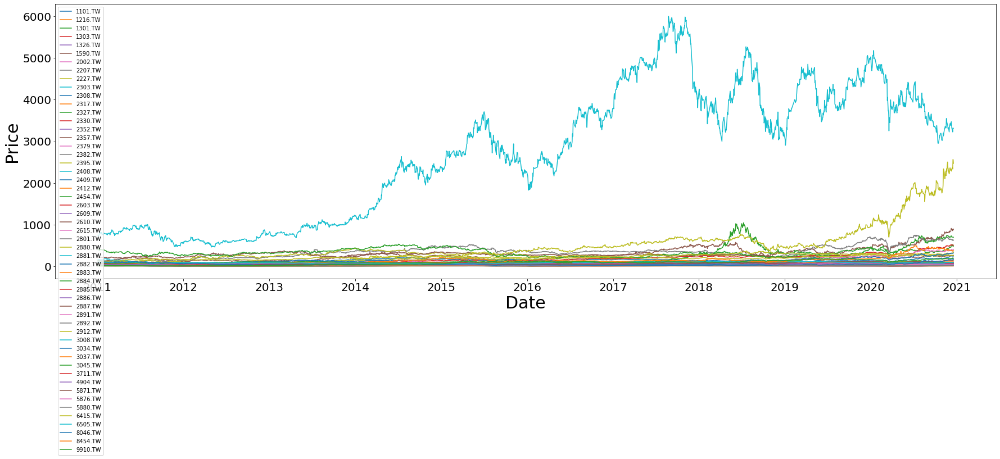

In [8]:
# train price data
plt.figure(figsize=(30, 9))
plt.xlabel('Date',fontsize=30)
plt.ylabel('Price',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for ticker in tickers:
    plt.plot(Closeprice[ticker][:-252], label = ticker)
plt.legend()
plt.show()

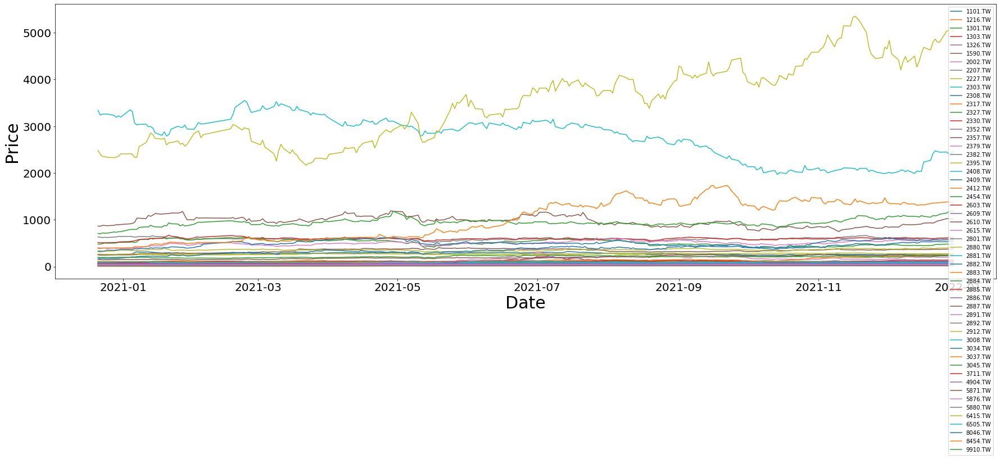

In [9]:
# test price data
plt.figure(figsize=(30, 9))
plt.xlabel('Date',fontsize=30)
plt.ylabel('Price',fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
for ticker in tickers:
    plt.plot(Closeprice[ticker][-252:], label = ticker)
plt.legend()
plt.show()

In [10]:
merge = {}

for name in companies['公司']:
  
  stock = name[:4] +".TW"
  stock_code = name[:4]

  #Step1:將財務報表'年月'設定為index
  try:
    fin[stock_code].set_index('財報申報日',inplace = True)
  except:
    pass
  #Step2:合併，pd.concat(objs, axis=1, join='outer', join_axes=None, ignore_index=False) ，axis=1 為 index合併
  merge[stock_code]  = pd.concat([returns[stock] ,fin[stock_code]], axis=1)

  #Step3:將期末數值往後回補，直到下一個數值出現
  merge[stock_code]=merge[stock_code].fillna(method="bfill")

  #Step4:將空值補零
  merge[stock_code] = merge[stock_code].fillna(0) 
 
  #Step5:調整欄位順序
  merge[stock_code] = merge[stock_code][[stock,'ROA－綜合損益','ROE－綜合損益','淨值/資產','負債比率','營收成長率','股利支付率','折舊性FA成長率']]

  merge[stock_code].rename(columns={stock: 'Returns'}, inplace=True)


In [11]:
# X_train: ROA－綜合損益 ROE－綜合損益 淨值/資產 負債比率 營收成長率 股利支付率 折舊性FA成長率
# Y_train: Returns
# pastDay = 過去四年, futureDay＝未來一年, SlidingWindow = i = 移動窗格為一年
def buildTrain(train, pastDay, futureDay):
  X_train, Y_train = [], []
  for i in range(train.shape[0]-futureDay-pastDay):
    X_train.append(np.array(train.iloc[i:i+pastDay]))
    Y_train.append(np.array(train.iloc[i+pastDay:i+pastDay+futureDay]["Returns"]))
    i += 63
  return np.array(X_train), np.array(Y_train)


In [12]:
#將資料打散
def shuffle(X,Y):
  np.random.seed(10)
  randomList = np.arange(X.shape[0])
  np.random.shuffle(randomList)
  return X[randomList], Y[randomList]
# Training Data 取一部份當 Validation Data
def SpiltData(X,Y,rate):
  X_train = X[:int(X.shape[0]*rate)]
  Y_train = Y[:int(Y.shape[0]*rate)]
  X_val = X[int(X.shape[0]*rate):]
  Y_val = Y[int(Y.shape[0]*rate):]
  return X_train, Y_train, X_val, Y_val

In [13]:
def TestData(X_train,Y_train): 
    #TestData最後一年為測試資料
    X_train = X_train[:-252, :, :] 
    Y_train = Y_train[:-252, :]  
    X_test = X_train[-252:, :, :]
    Y_test = Y_train[-252:, :]
    return X_train,Y_train,X_test,Y_test

In [14]:
import tensorflow.compat.v2 as tf
from keras.callbacks import EarlyStopping, ModelCheckpoint
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [19]:
def buildManyToOneModel(shape, reg, lr=0.03):
  model = Sequential()
  model.add(LSTM(10, input_length=shape[1], input_dim=shape[2], kernel_regularizer=reg))
  # output shape: (1, 1)
  model.add(Dense(5))
  model.add(Dense(1))
  
  opt = tf.keras.optimizers.Adam(learning_rate=lr)
  #opt = Nadam(learning_rate=lr)
  model.compile(loss="mse", optimizer=opt, metrics=["mse"])
  model.summary()
  return model

In [20]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error


def evaluation(prediction, label):
    rmse = mean_squared_error(label, prediction)
    mae = mean_absolute_error(label, prediction)
    r2 = r2_score(label, prediction)
    mape = mean_absolute_percentage_error(label, prediction)
    return r2, rmse, mae, mape

In [21]:
#plot 
  
def plotPrice_train(predict,true):
    mpl.style.use('seaborn')
    plt.figure(figsize=(20, 9))
    #sns.set(font_scale=1.5)
    plt.xlabel('Date',fontsize=30)
    plt.ylabel('Price',fontsize=30)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
     
    dates = Closeprice[-(len(predict)+252):-252].index  # 1447+252 =2454
    plt.plot(dates,scaler_tmp.inverse_transform(predict), label = 'prediction')
    plt.plot(dates,scaler_tmp.inverse_transform(true), label = 'true target')
    
    plt.legend(prop={'size': 20})
    plt.show()
    
def plotPrice_test(predict,true):
    mpl.style.use('seaborn')
    plt.figure(figsize=(20, 9))
    plt.xlabel('Date',fontsize=30)
    plt.ylabel('Price',fontsize=30)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    
    dates = Closeprice[-252:].index #1447
    plt.plot(dates,scaler_tmp.inverse_transform(predict), label = 'prediction')
    plt.plot(dates,scaler_tmp.inverse_transform(true), label = 'true target')

    plt.legend(prop={'size': 20})
    
 
    plt.show()
 

In [22]:
def reshaper(arr):
    arr = np.swapaxes(arr,1,0)[0]
    arr = np.reshape(arr,(-1, 1))
    return arr

Model: "sequential_53"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_53 (LSTM)              (None, 10)                760       
                                                                 
 dense_106 (Dense)           (None, 5)                 55        
                                                                 
 dense_107 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 6s 345ms/step - loss: 0.1072 - mse: 0.0442 - val_loss: 0.0584 - val_mse: 0.0029
Epoch 2/50
12/12 [==============================] - 4s 296ms/step - loss: 0.0648 - mse: 0.0145 - val_loss: 0.0810 - val_mse: 0.0374
Epoch 3/50
12/12 [==============================] - 6s 

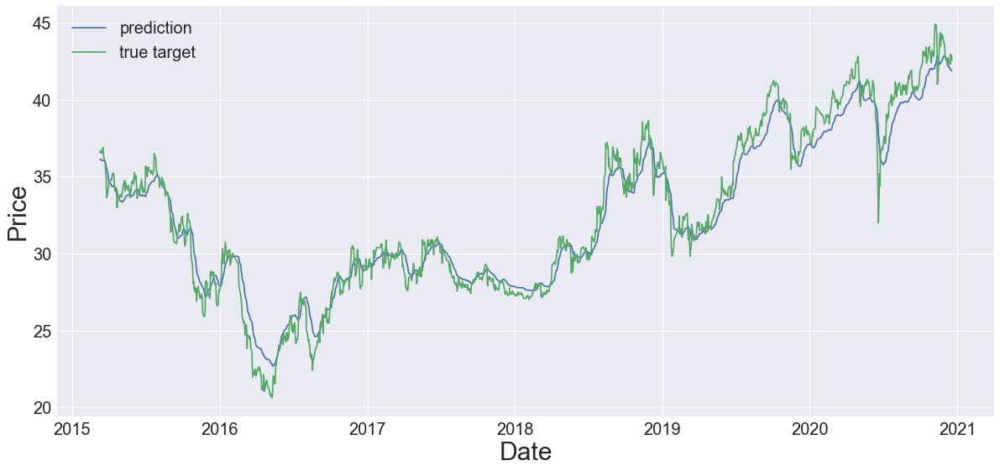

1101 Test Data


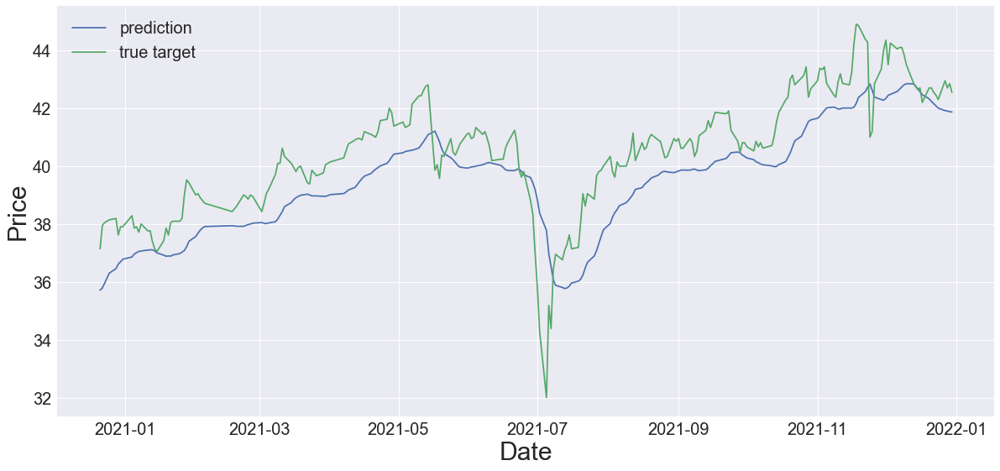

Model: "sequential_54"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_54 (LSTM)              (None, 10)                760       
                                                                 
 dense_108 (Dense)           (None, 5)                 55        
                                                                 
 dense_109 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 64s 3s/step - loss: 0.5144 - mse: 0.4506 - val_loss: 0.2740 - val_mse: 0.2176
Epoch 2/50
12/12 [==============================] - 17s 1s/step - loss: 0.1180 - mse: 0.0662 - val_loss: 0.0574 - val_mse: 0.0118
Epoch 3/50
12/12 [==============================] - 16s 1s/

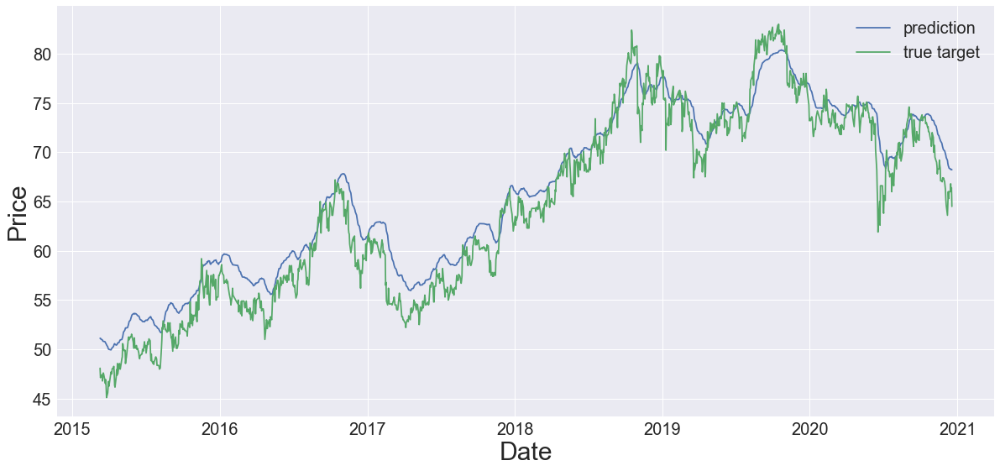

1216 Test Data


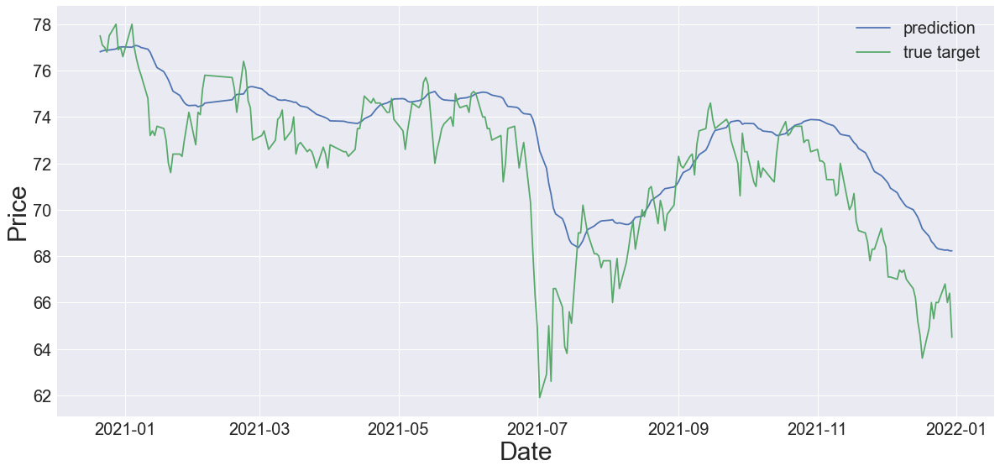

Model: "sequential_55"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_55 (LSTM)              (None, 10)                760       
                                                                 
 dense_110 (Dense)           (None, 5)                 55        
                                                                 
 dense_111 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 62s 2s/step - loss: 0.2370 - mse: 0.1748 - val_loss: 0.0732 - val_mse: 0.0180
Epoch 2/50
12/12 [==============================] - 17s 1s/step - loss: 0.0846 - mse: 0.0342 - val_loss: 0.0786 - val_mse: 0.0343
Epoch 3/50
12/12 [==============================] - 18s 1s/

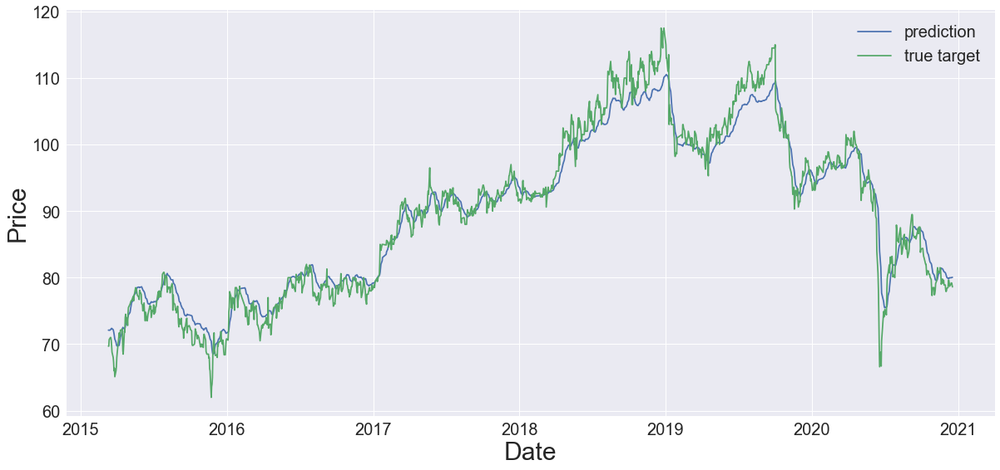

1301 Test Data


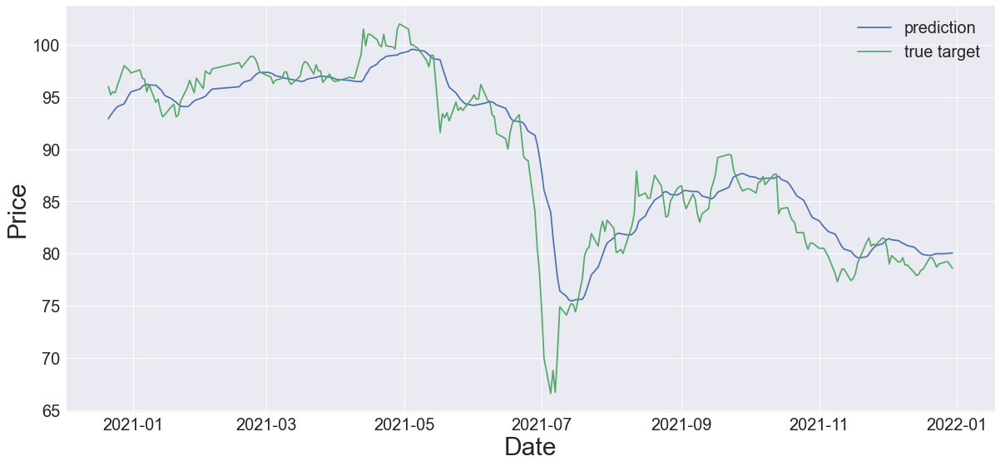

Model: "sequential_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_56 (LSTM)              (None, 10)                760       
                                                                 
 dense_112 (Dense)           (None, 5)                 55        
                                                                 
 dense_113 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 64s 2s/step - loss: 0.1852 - mse: 0.1207 - val_loss: 0.0824 - val_mse: 0.0251
Epoch 2/50
12/12 [==============================] - 19s 2s/step - loss: 0.0773 - mse: 0.0249 - val_loss: 0.0652 - val_mse: 0.0195
Epoch 3/50
12/12 [==============================] - 17s 1s/

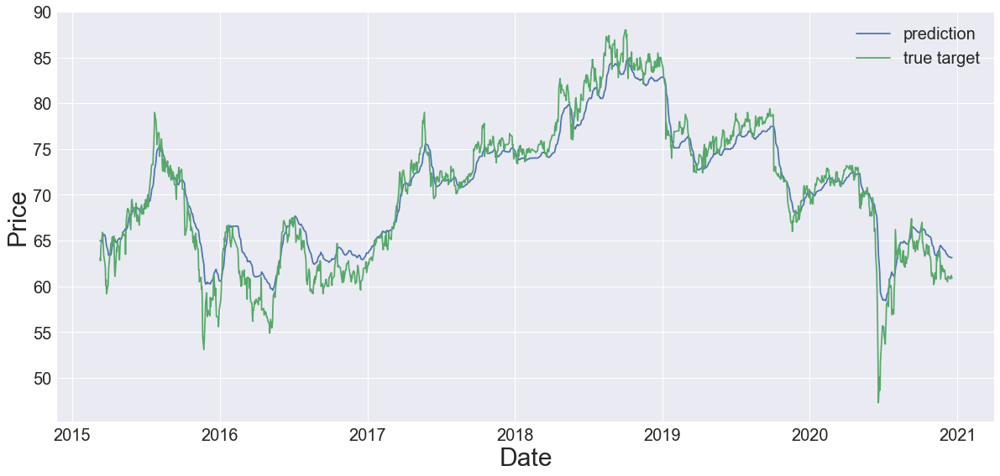

1303 Test Data


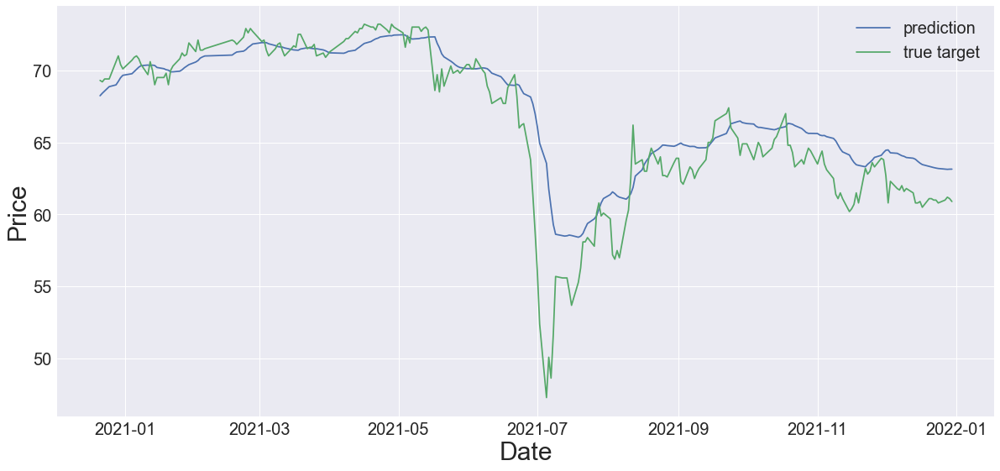

Model: "sequential_57"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_57 (LSTM)              (None, 10)                760       
                                                                 
 dense_114 (Dense)           (None, 5)                 55        
                                                                 
 dense_115 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 64s 2s/step - loss: 0.1530 - mse: 0.0874 - val_loss: 0.1154 - val_mse: 0.0572
Epoch 2/50
12/12 [==============================] - 17s 1s/step - loss: 0.0766 - mse: 0.0233 - val_loss: 0.0600 - val_mse: 0.0132
Epoch 3/50
12/12 [==============================] - 15s 1s/

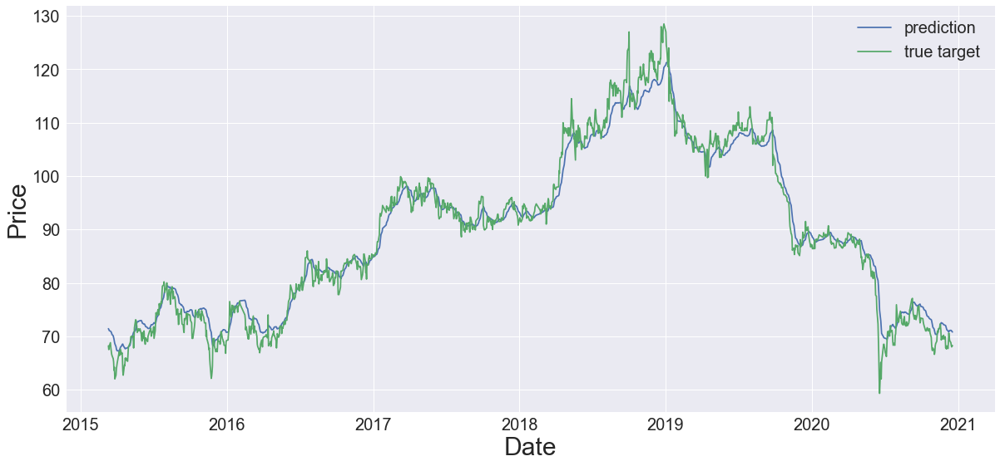

1326 Test Data


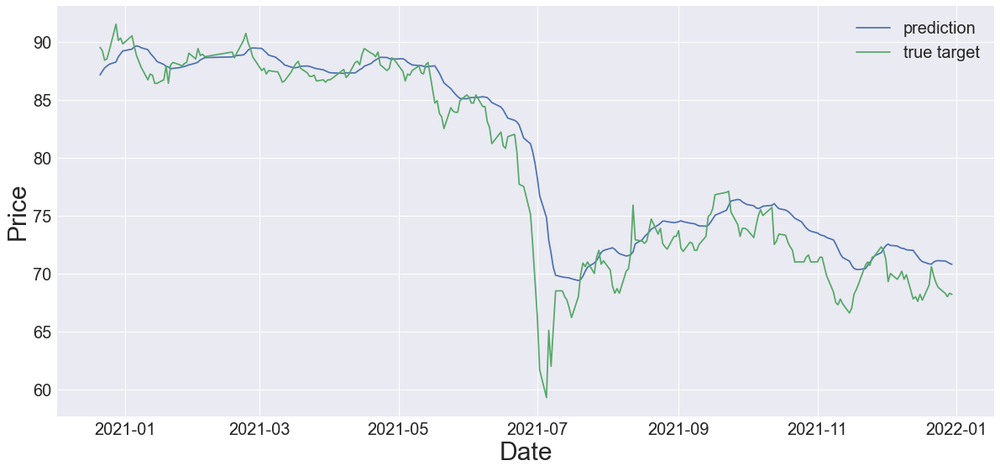

Model: "sequential_58"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_58 (LSTM)              (None, 10)                760       
                                                                 
 dense_116 (Dense)           (None, 5)                 55        
                                                                 
 dense_117 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 54s 2s/step - loss: 0.1082 - mse: 0.0450 - val_loss: 0.0784 - val_mse: 0.0229
Epoch 2/50
12/12 [==============================] - 17s 1s/step - loss: 0.0632 - mse: 0.0129 - val_loss: 0.0536 - val_mse: 0.0102
Epoch 3/50
12/12 [==============================] - 18s 1s/

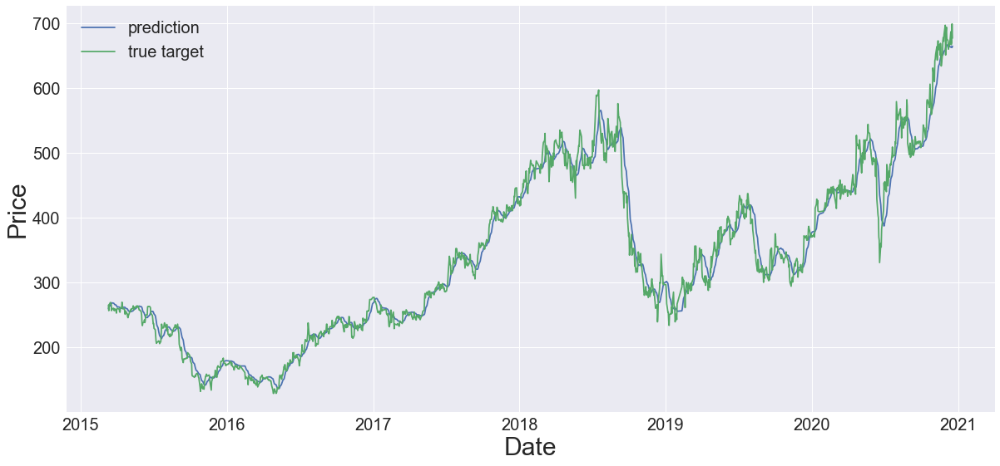

1590 Test Data


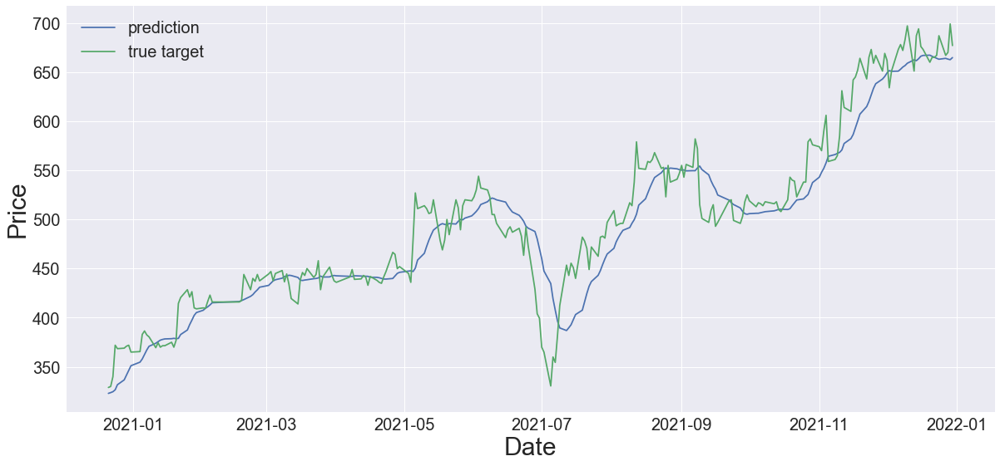

Model: "sequential_59"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_59 (LSTM)              (None, 10)                760       
                                                                 
 dense_118 (Dense)           (None, 5)                 55        
                                                                 
 dense_119 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 59s 2s/step - loss: 0.0919 - mse: 0.0298 - val_loss: 0.0781 - val_mse: 0.0237
Epoch 2/50
12/12 [==============================] - 18s 1s/step - loss: 0.0582 - mse: 0.0089 - val_loss: 0.0465 - val_mse: 0.0037
Epoch 3/50
12/12 [==============================] - 19s 2s/

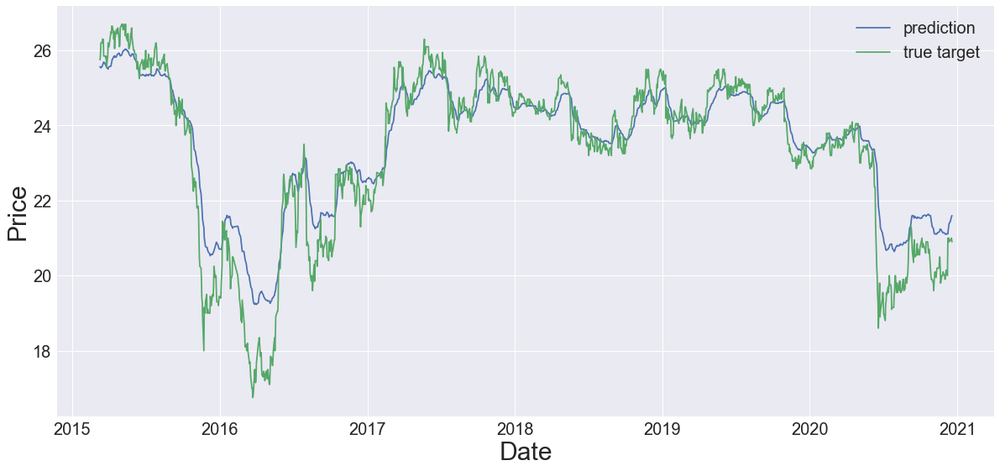

2002 Test Data


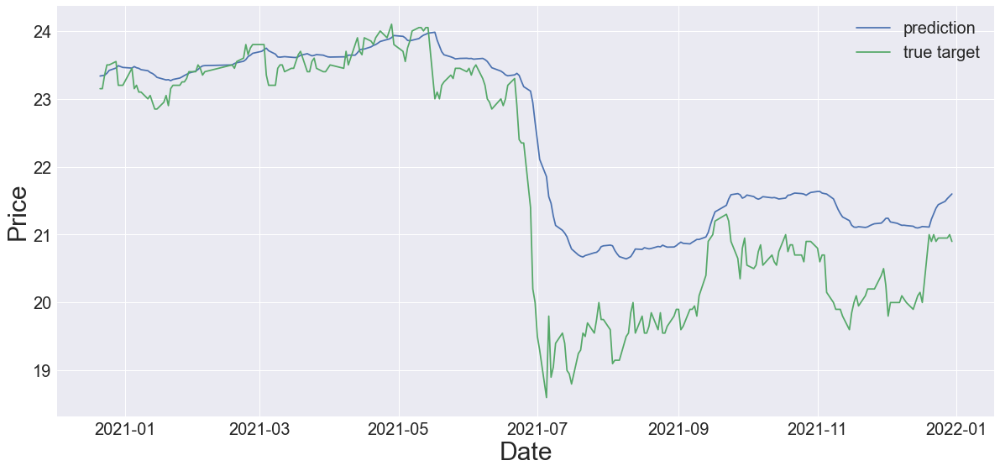

Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_60 (LSTM)              (None, 10)                760       
                                                                 
 dense_120 (Dense)           (None, 5)                 55        
                                                                 
 dense_121 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 59s 2s/step - loss: 0.1556 - mse: 0.0873 - val_loss: 0.0818 - val_mse: 0.0209
Epoch 2/50
12/12 [==============================] - 14s 1s/step - loss: 0.0785 - mse: 0.0224 - val_loss: 0.1167 - val_mse: 0.0669
Epoch 3/50
12/12 [==============================] - 17s 1s/

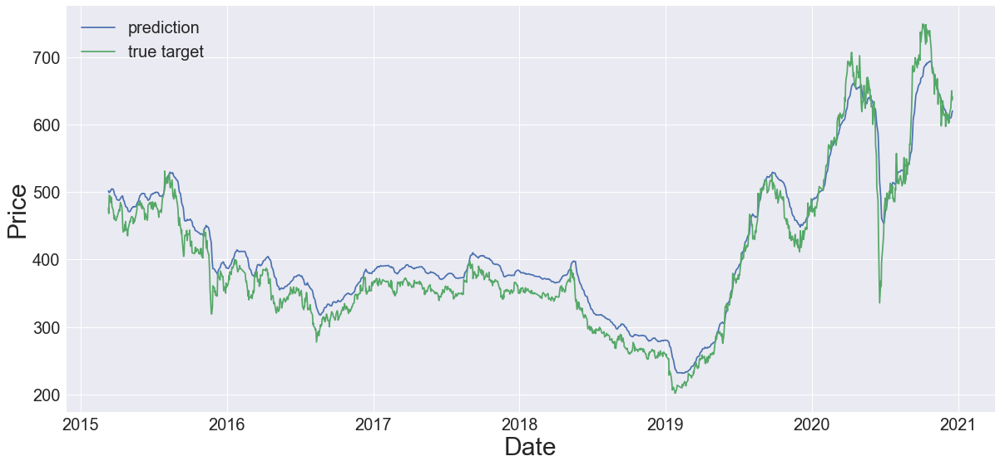

2207 Test Data


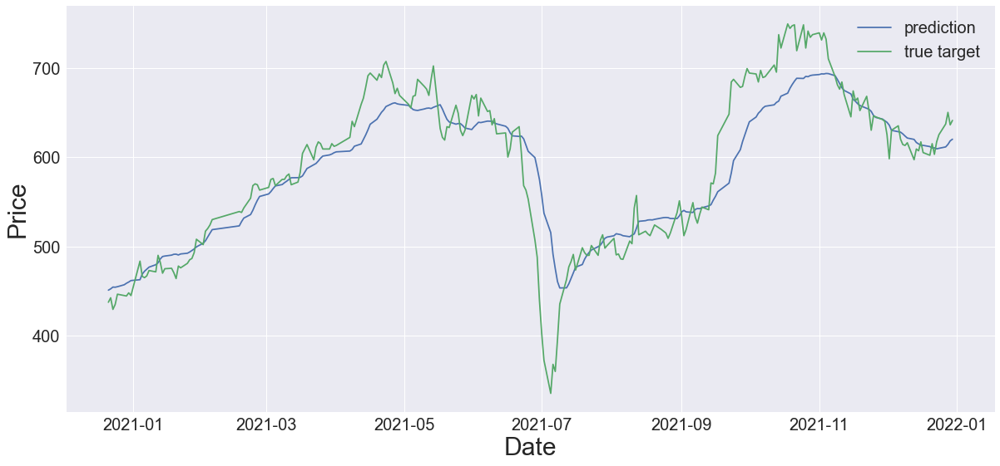

Model: "sequential_61"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_61 (LSTM)              (None, 10)                760       
                                                                 
 dense_122 (Dense)           (None, 5)                 55        
                                                                 
 dense_123 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 56s 2s/step - loss: 0.1892 - mse: 0.1276 - val_loss: 0.0591 - val_mse: 0.0045
Epoch 2/50
12/12 [==============================] - 16s 1s/step - loss: 0.0674 - mse: 0.0175 - val_loss: 0.0473 - val_mse: 0.0036
Epoch 3/50
12/12 [==============================] - 15s 1s/

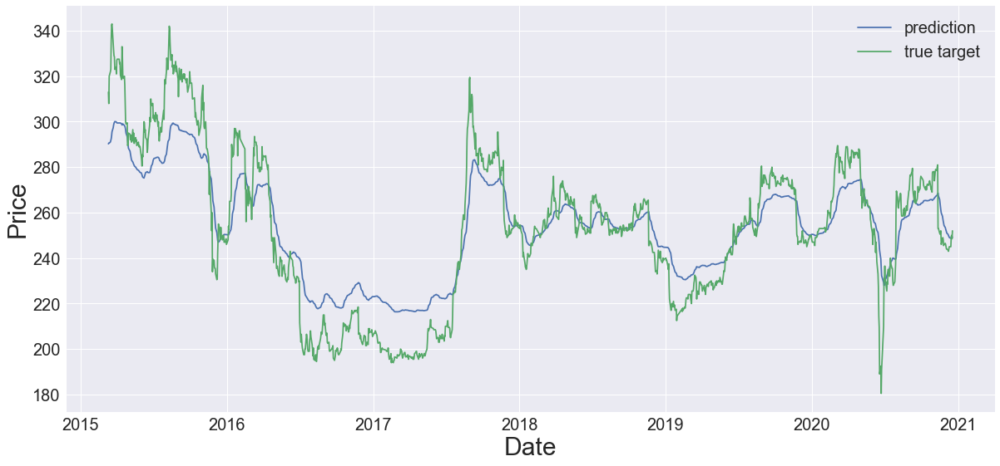

2227 Test Data


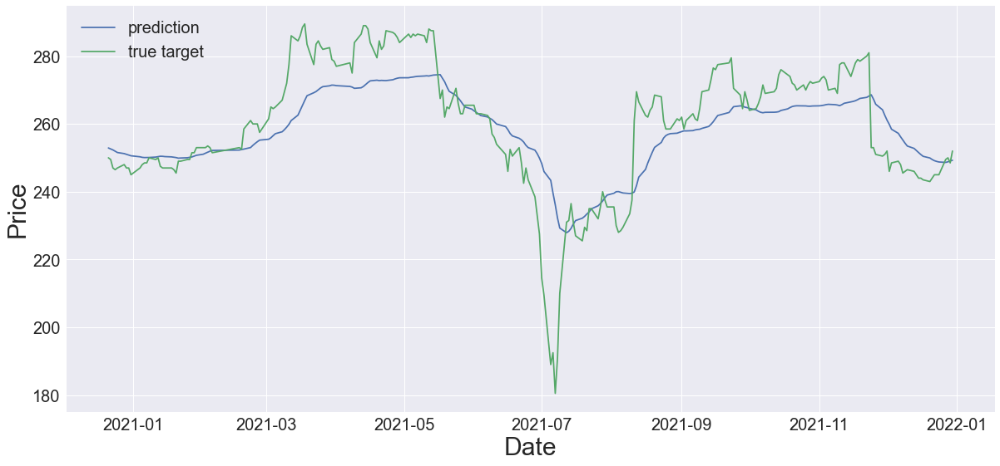

Model: "sequential_62"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_62 (LSTM)              (None, 10)                760       
                                                                 
 dense_124 (Dense)           (None, 5)                 55        
                                                                 
 dense_125 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 60s 2s/step - loss: 0.0716 - mse: 0.0038 - val_loss: 0.0725 - val_mse: 0.0129
Epoch 2/50
12/12 [==============================] - 14s 1s/step - loss: 0.0565 - mse: 0.0024 - val_loss: 0.0560 - val_mse: 0.0091
Epoch 3/50
12/12 [==============================] - 14s 1s/

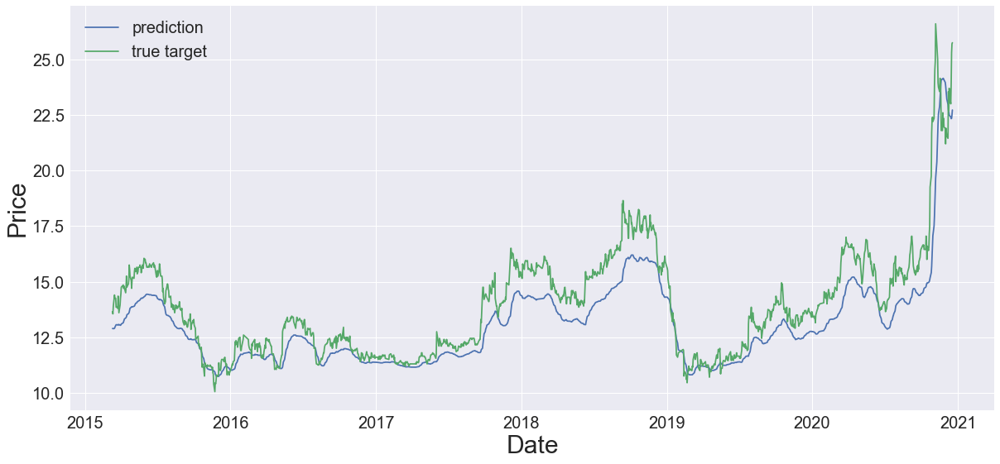

2303 Test Data


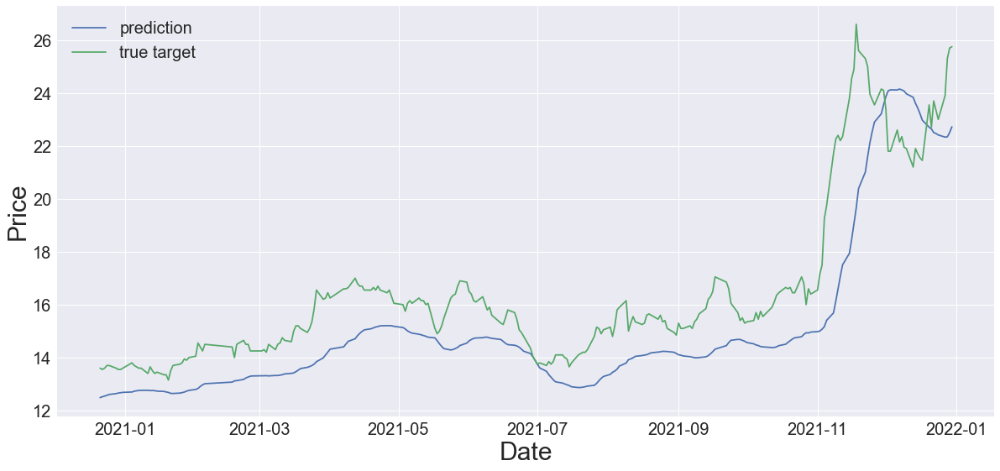

Model: "sequential_63"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_63 (LSTM)              (None, 10)                760       
                                                                 
 dense_126 (Dense)           (None, 5)                 55        
                                                                 
 dense_127 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 56s 2s/step - loss: 0.0837 - mse: 0.0211 - val_loss: 0.0649 - val_mse: 0.0097
Epoch 2/50
12/12 [==============================] - 11s 900ms/step - loss: 0.0560 - mse: 0.0060 - val_loss: 0.0533 - val_mse: 0.0100
Epoch 3/50
12/12 [==============================] - 12s 

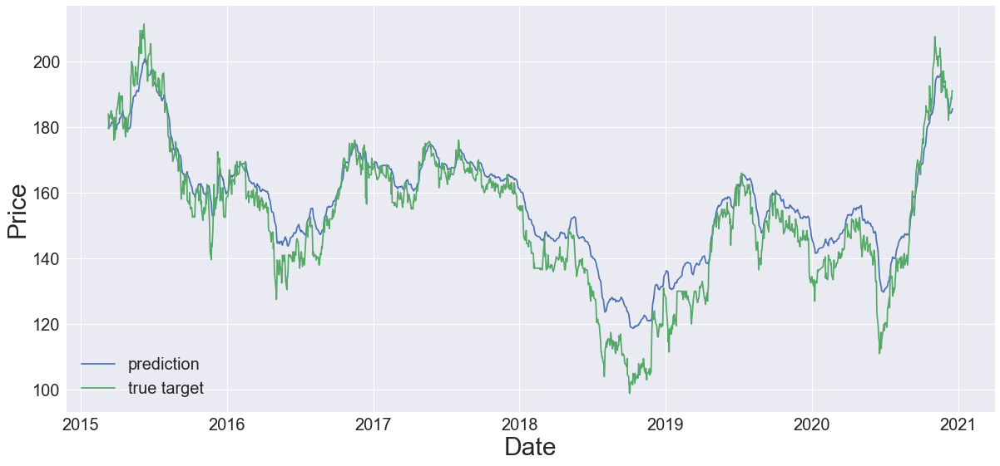

2308 Test Data


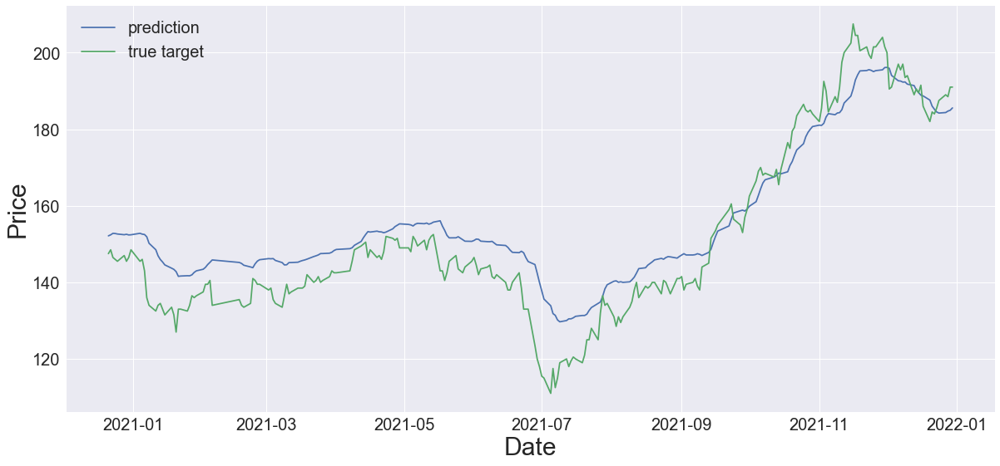

Model: "sequential_64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_64 (LSTM)              (None, 10)                760       
                                                                 
 dense_128 (Dense)           (None, 5)                 55        
                                                                 
 dense_129 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 40s 2s/step - loss: 0.1247 - mse: 0.0610 - val_loss: 0.0803 - val_mse: 0.0236
Epoch 2/50
12/12 [==============================] - 11s 944ms/step - loss: 0.0691 - mse: 0.0173 - val_loss: 0.0519 - val_mse: 0.0067
Epoch 3/50
12/12 [==============================] - 11s 

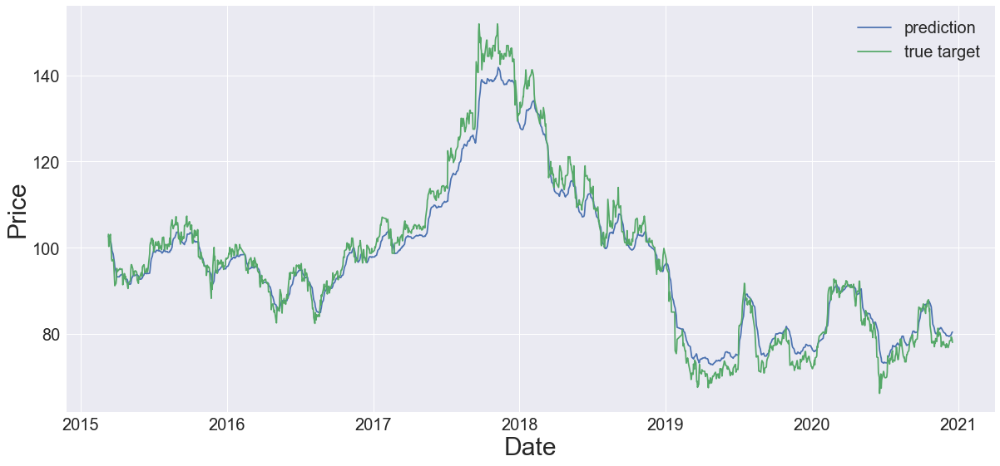

2317 Test Data


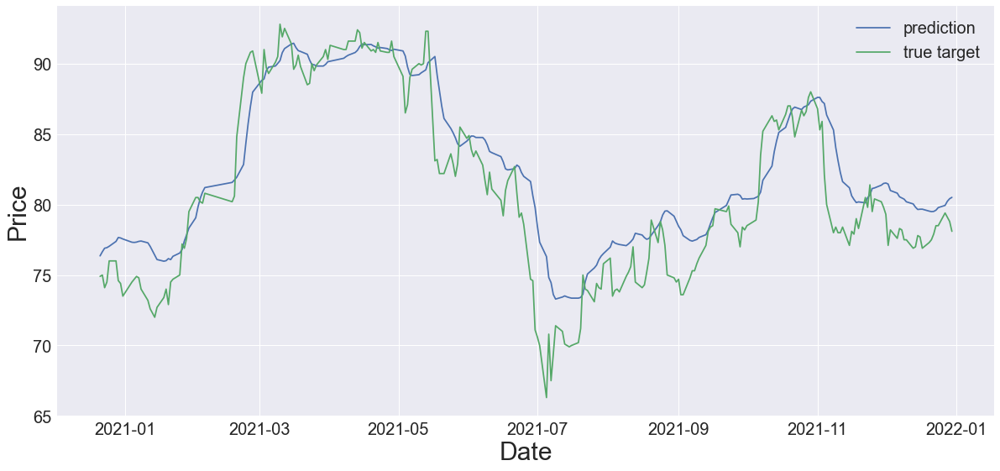

Model: "sequential_65"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_65 (LSTM)              (None, 10)                760       
                                                                 
 dense_130 (Dense)           (None, 5)                 55        
                                                                 
 dense_131 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 44s 1s/step - loss: 0.1177 - mse: 0.0516 - val_loss: 0.0612 - val_mse: 0.0026
Epoch 2/50
12/12 [==============================] - 9s 724ms/step - loss: 0.0745 - mse: 0.0210 - val_loss: 0.0520 - val_mse: 0.0053
Epoch 3/50
12/12 [==============================] - 9s 69

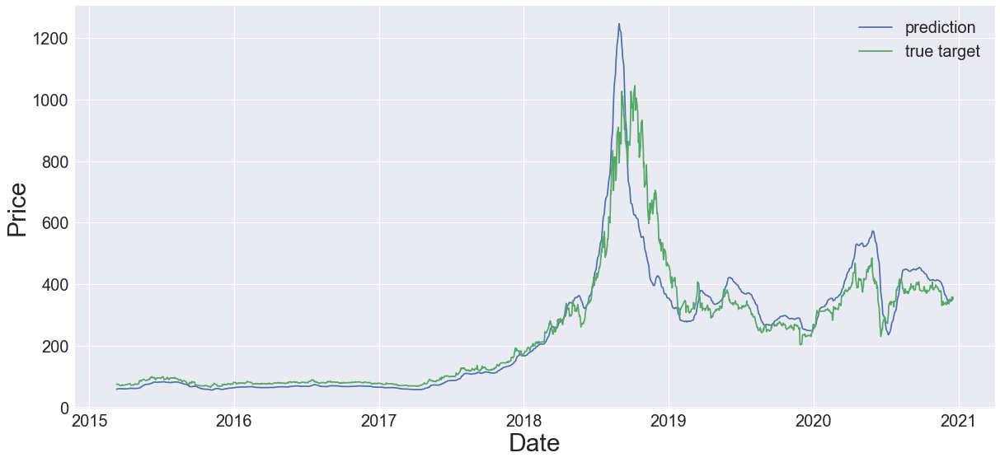

2327 Test Data


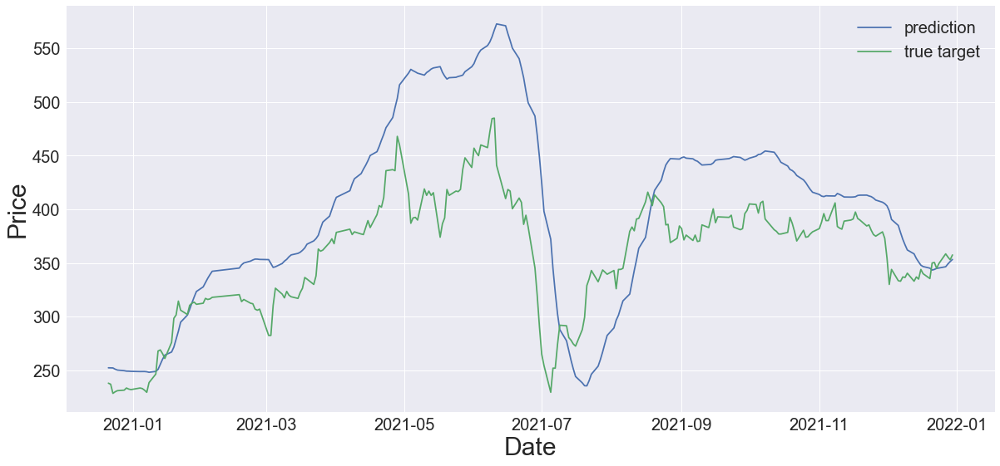

Model: "sequential_66"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_66 (LSTM)              (None, 10)                760       
                                                                 
 dense_132 (Dense)           (None, 5)                 55        
                                                                 
 dense_133 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 23s 986ms/step - loss: 0.0848 - mse: 0.0220 - val_loss: 0.0611 - val_mse: 0.0057
Epoch 2/50
12/12 [==============================] - 9s 765ms/step - loss: 0.0577 - mse: 0.0071 - val_loss: 0.0739 - val_mse: 0.0298
Epoch 3/50
12/12 [==============================] - 8s

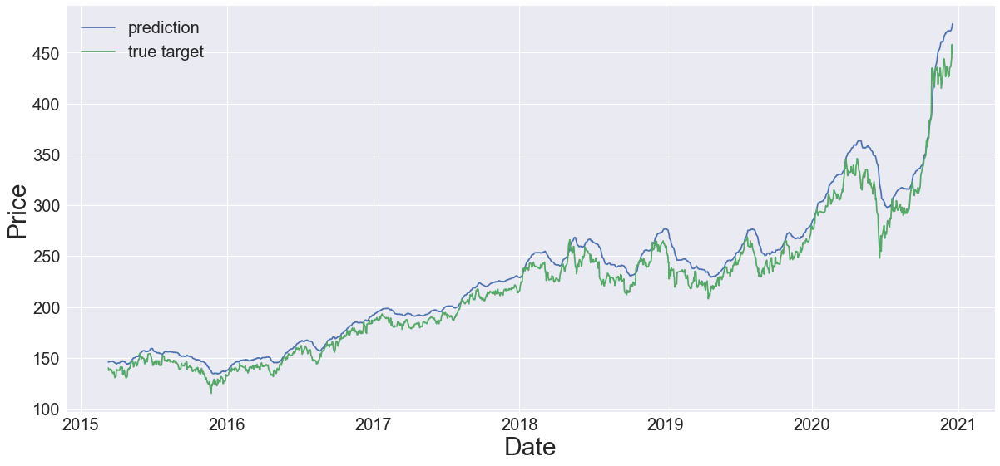

2330 Test Data


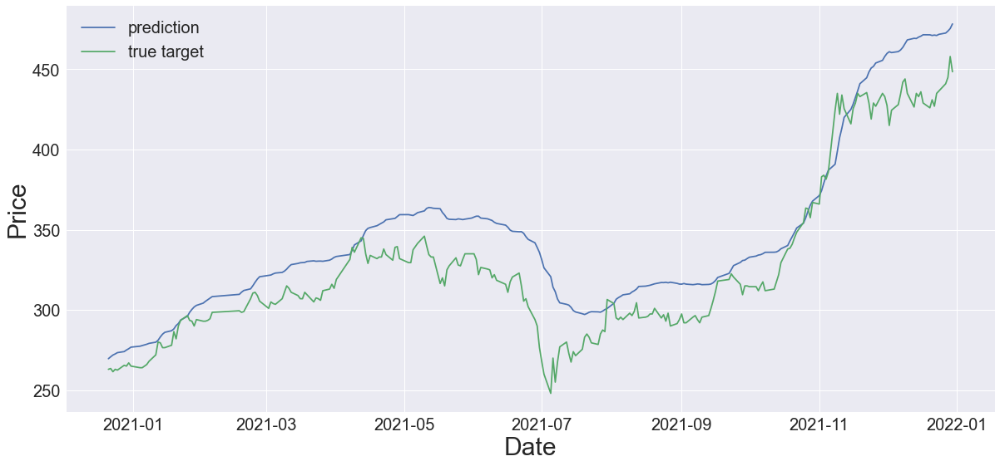

Model: "sequential_67"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_67 (LSTM)              (None, 10)                760       
                                                                 
 dense_134 (Dense)           (None, 5)                 55        
                                                                 
 dense_135 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 24s 1s/step - loss: 0.0761 - mse: 0.0156 - val_loss: 0.0593 - val_mse: 0.0063
Epoch 2/50
12/12 [==============================] - 9s 778ms/step - loss: 0.0527 - mse: 0.0048 - val_loss: 0.0459 - val_mse: 0.0046
Epoch 3/50
12/12 [==============================] - 9s 75

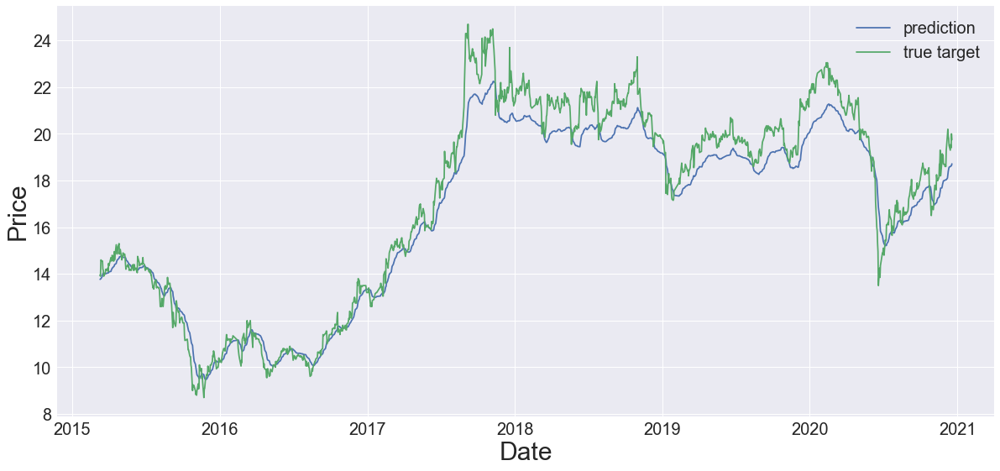

2352 Test Data


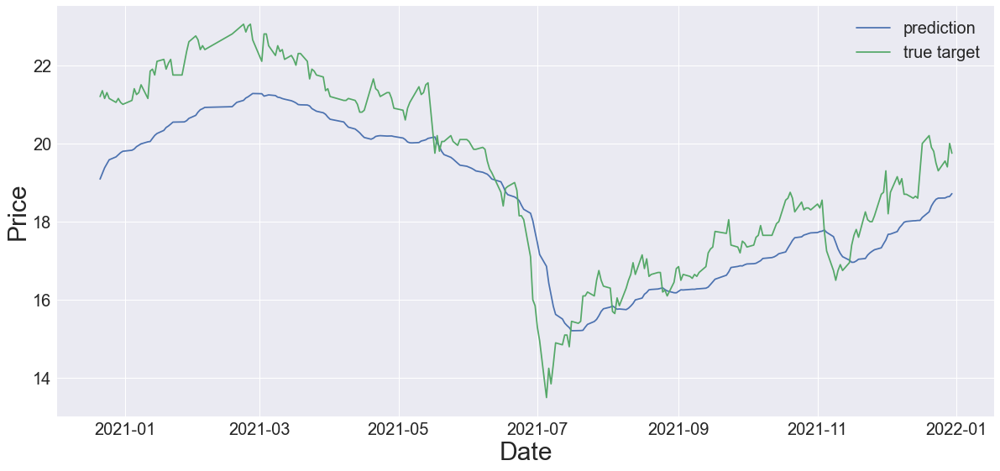

Model: "sequential_68"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_68 (LSTM)              (None, 10)                760       
                                                                 
 dense_136 (Dense)           (None, 5)                 55        
                                                                 
 dense_137 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 26s 1s/step - loss: 0.1557 - mse: 0.0924 - val_loss: 0.0717 - val_mse: 0.0160
Epoch 2/50
12/12 [==============================] - 9s 743ms/step - loss: 0.0676 - mse: 0.0171 - val_loss: 0.0600 - val_mse: 0.0160
Epoch 3/50
12/12 [==============================] - 9s 79

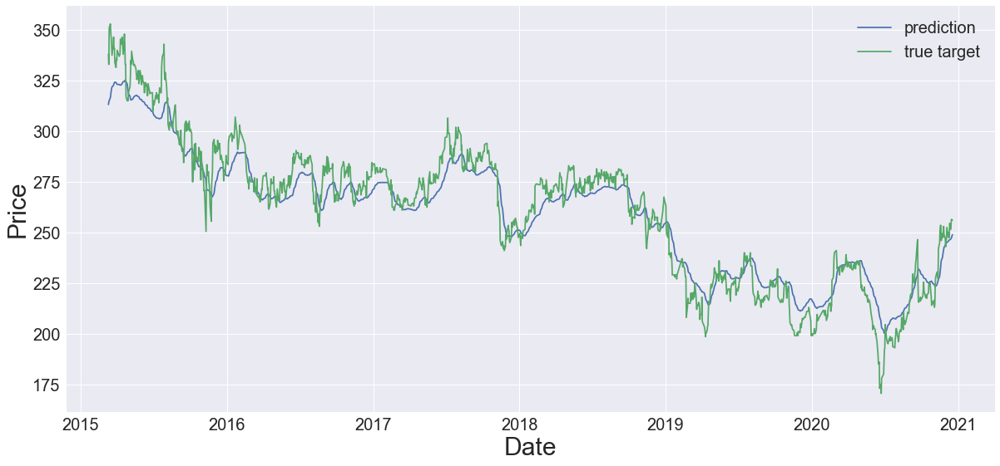

2357 Test Data


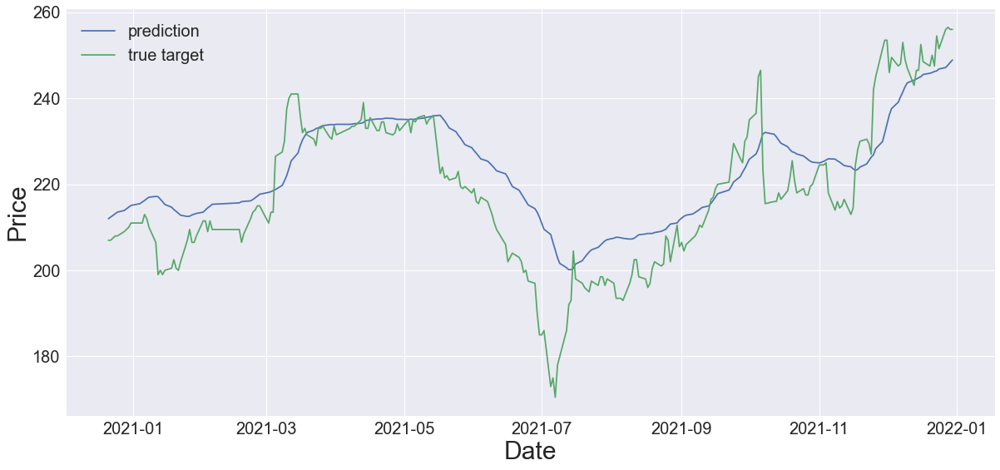

Model: "sequential_69"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_69 (LSTM)              (None, 10)                760       
                                                                 
 dense_138 (Dense)           (None, 5)                 55        
                                                                 
 dense_139 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 25s 974ms/step - loss: 0.1021 - mse: 0.0337 - val_loss: 0.0811 - val_mse: 0.0207
Epoch 2/50
12/12 [==============================] - 9s 749ms/step - loss: 0.0681 - mse: 0.0130 - val_loss: 0.0801 - val_mse: 0.0321
Epoch 3/50
12/12 [==============================] - 9s

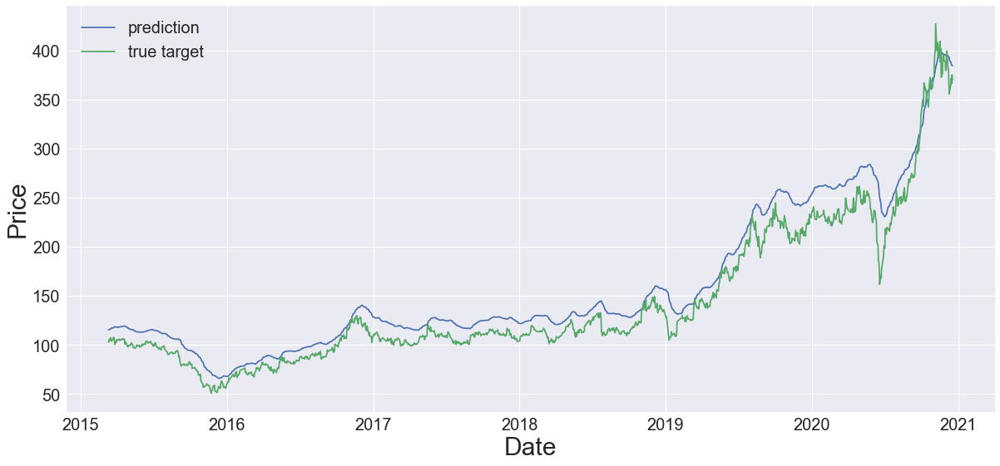

2379 Test Data


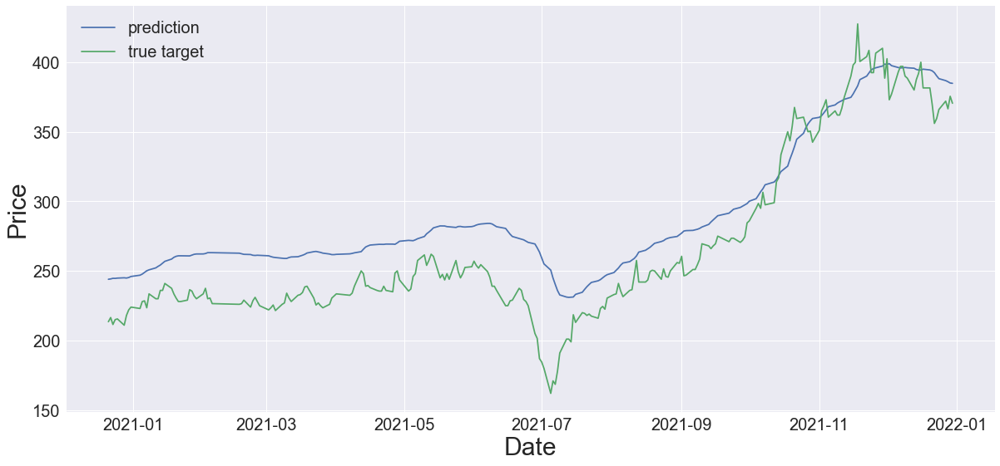

Model: "sequential_70"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_70 (LSTM)              (None, 10)                760       
                                                                 
 dense_140 (Dense)           (None, 5)                 55        
                                                                 
 dense_141 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 20s 1s/step - loss: 0.0763 - mse: 0.0147 - val_loss: 0.0645 - val_mse: 0.0108
Epoch 2/50
12/12 [==============================] - 9s 796ms/step - loss: 0.0584 - mse: 0.0098 - val_loss: 0.0569 - val_mse: 0.0151
Epoch 3/50
12/12 [==============================] - 9s 72

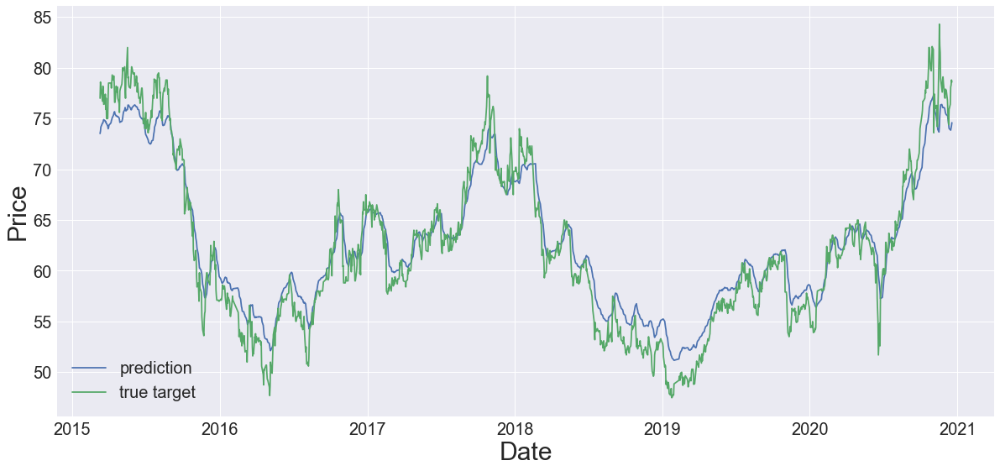

2382 Test Data


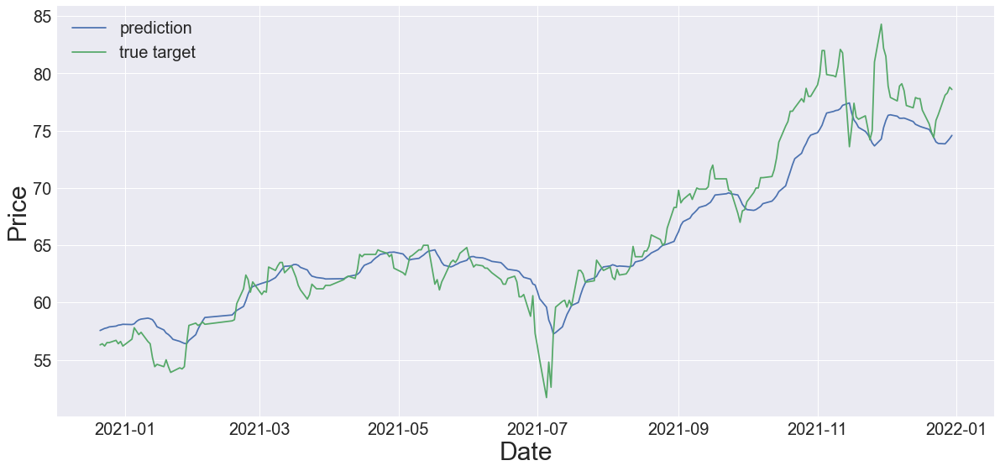

Model: "sequential_71"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_71 (LSTM)              (None, 10)                760       
                                                                 
 dense_142 (Dense)           (None, 5)                 55        
                                                                 
 dense_143 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 23s 976ms/step - loss: 0.1803 - mse: 0.1189 - val_loss: 0.0635 - val_mse: 0.0093
Epoch 2/50
12/12 [==============================] - 8s 688ms/step - loss: 0.0658 - mse: 0.0163 - val_loss: 0.0537 - val_mse: 0.0106
Epoch 3/50
12/12 [==============================] - 9s

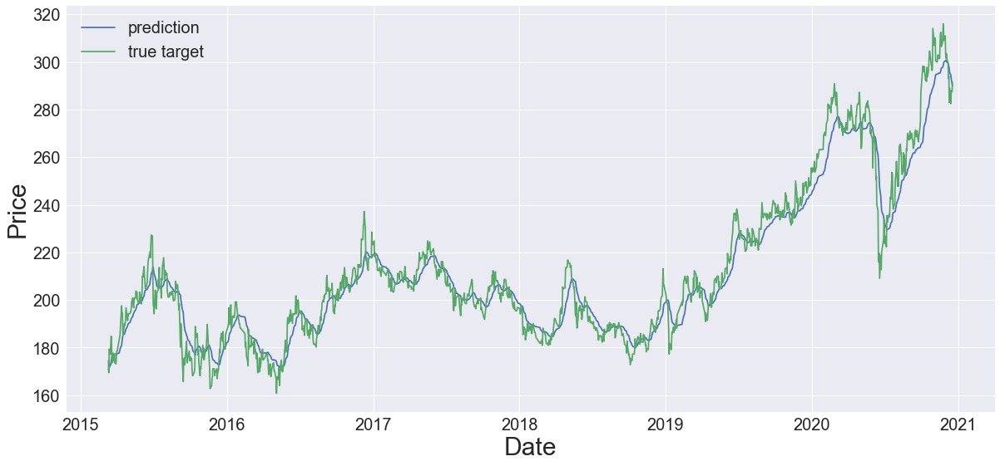

2395 Test Data


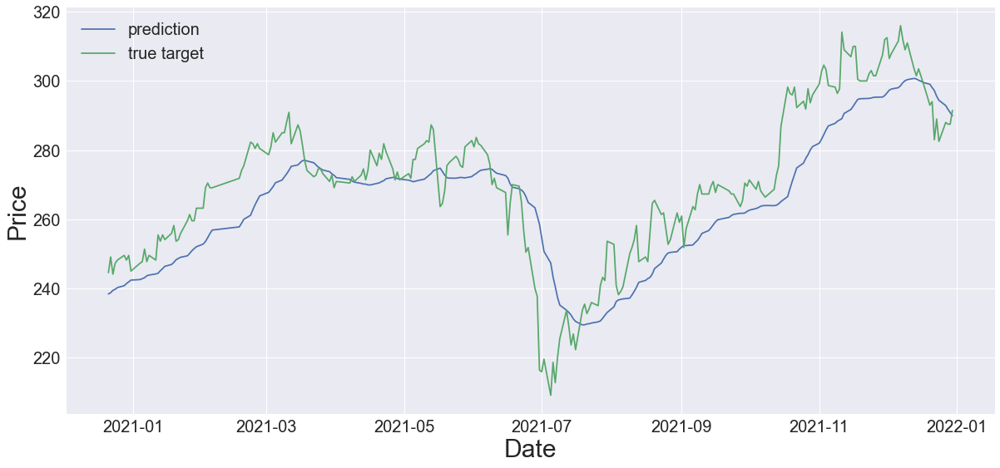

Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_72 (LSTM)              (None, 10)                760       
                                                                 
 dense_144 (Dense)           (None, 5)                 55        
                                                                 
 dense_145 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 21s 958ms/step - loss: 0.0797 - mse: 0.0180 - val_loss: 0.0634 - val_mse: 0.0093
Epoch 2/50
12/12 [==============================] - 9s 714ms/step - loss: 0.0551 - mse: 0.0061 - val_loss: 0.0480 - val_mse: 0.0056
Epoch 3/50
12/12 [==============================] - 9s

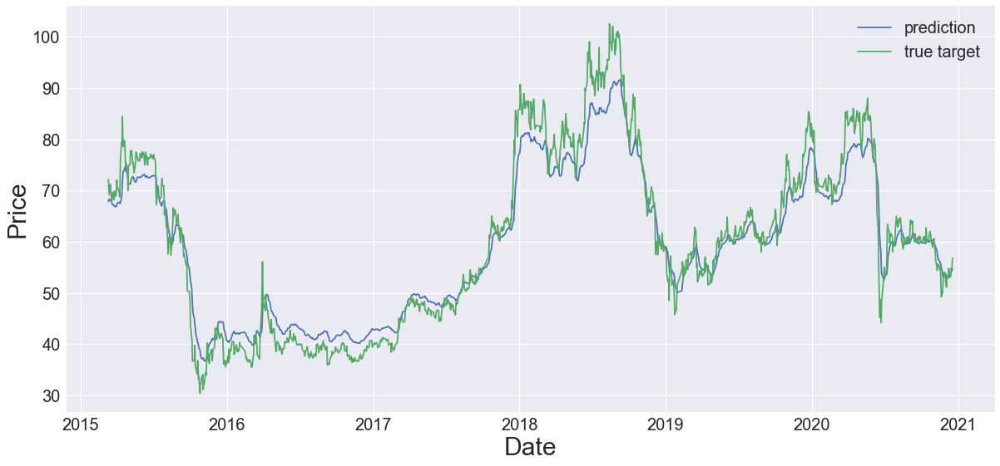

2408 Test Data


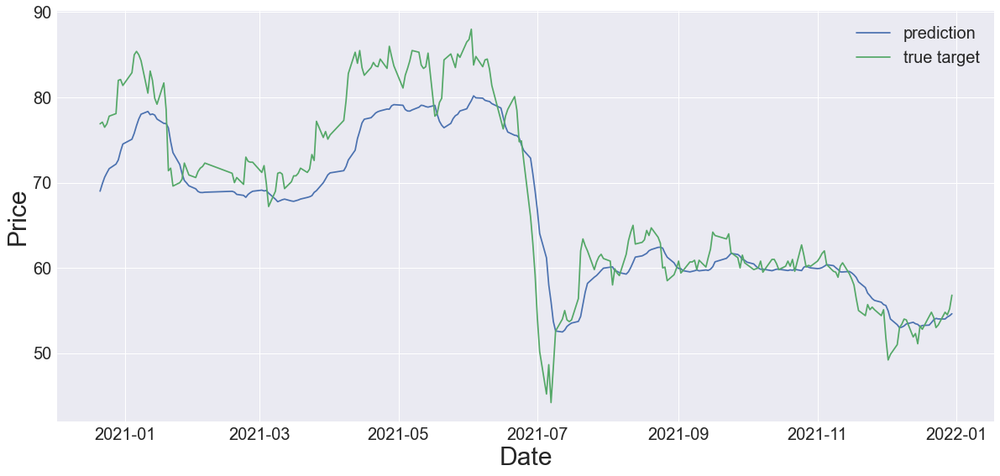

Model: "sequential_73"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_73 (LSTM)              (None, 10)                760       
                                                                 
 dense_146 (Dense)           (None, 5)                 55        
                                                                 
 dense_147 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 27s 1s/step - loss: 0.0722 - mse: 0.0058 - val_loss: 0.0624 - val_mse: 0.0041
Epoch 2/50
12/12 [==============================] - 9s 761ms/step - loss: 0.0556 - mse: 0.0028 - val_loss: 0.0491 - val_mse: 0.0034
Epoch 3/50
12/12 [==============================] - 9s 78

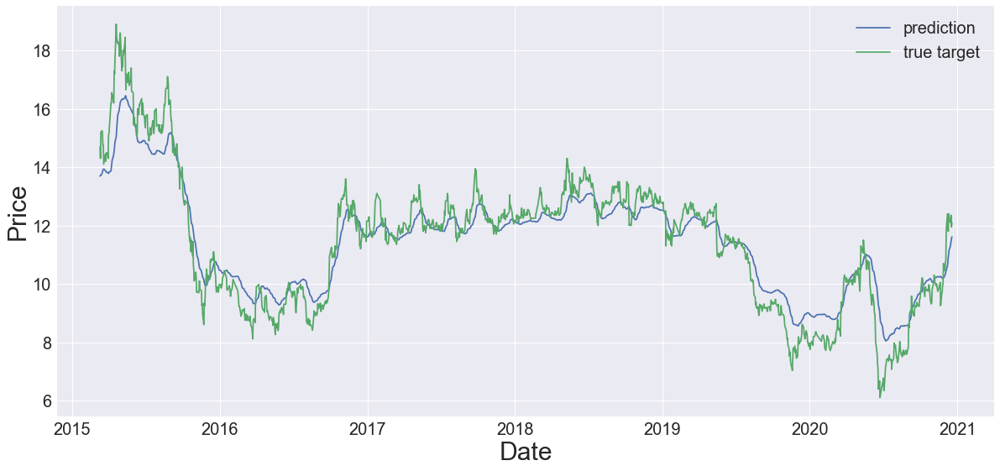

2409 Test Data


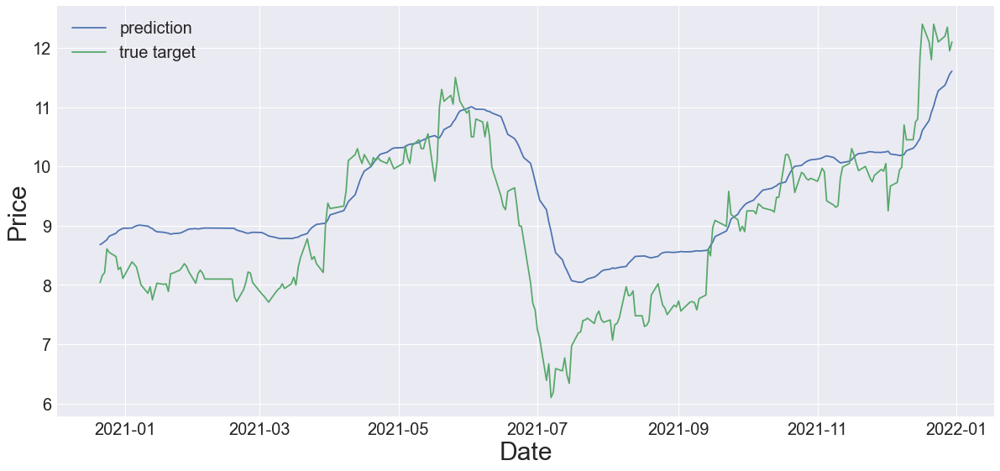

Model: "sequential_74"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_74 (LSTM)              (None, 10)                760       
                                                                 
 dense_148 (Dense)           (None, 5)                 55        
                                                                 
 dense_149 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 25s 1s/step - loss: 0.6878 - mse: 0.6268 - val_loss: 0.4169 - val_mse: 0.3631
Epoch 2/50
12/12 [==============================] - 9s 724ms/step - loss: 0.2014 - mse: 0.1521 - val_loss: 0.0554 - val_mse: 0.0120
Epoch 3/50
12/12 [==============================] - 9s 74

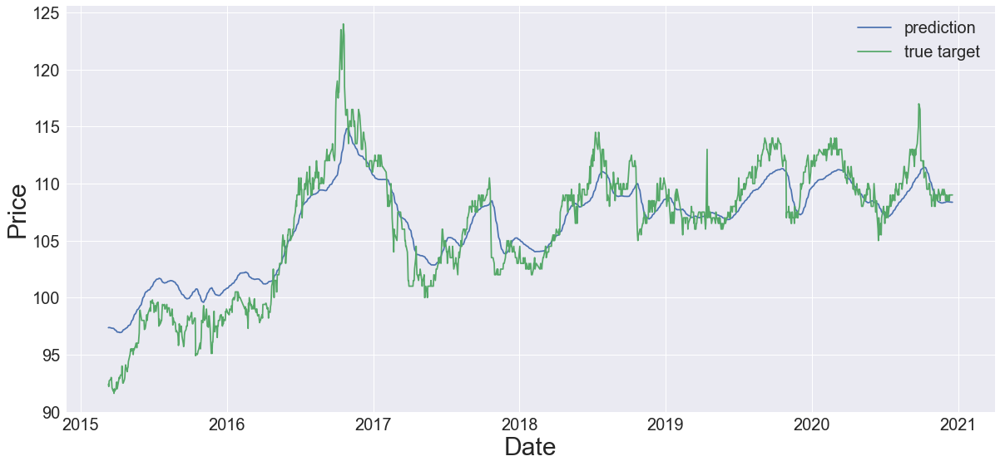

2412 Test Data


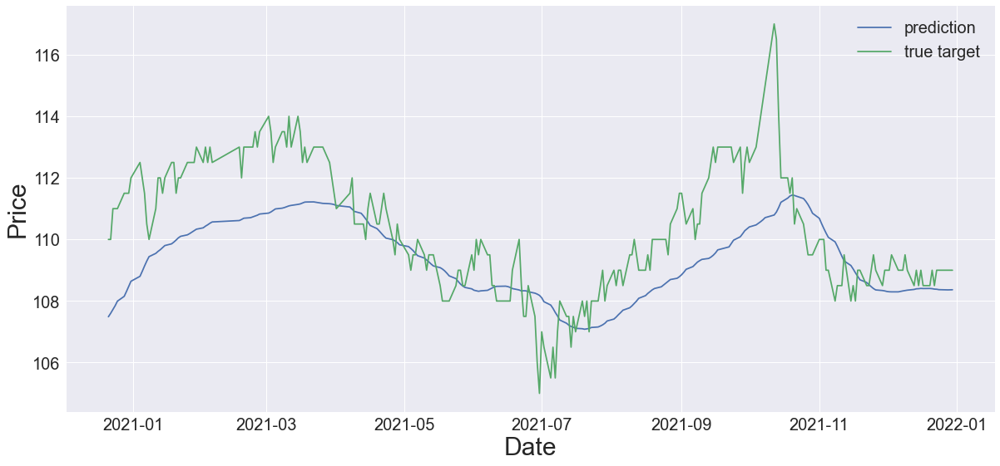

Model: "sequential_75"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_75 (LSTM)              (None, 10)                760       
                                                                 
 dense_150 (Dense)           (None, 5)                 55        
                                                                 
 dense_151 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 21s 909ms/step - loss: 0.0724 - mse: 0.0070 - val_loss: 0.0724 - val_mse: 0.0149
Epoch 2/50
12/12 [==============================] - 8s 673ms/step - loss: 0.0560 - mse: 0.0036 - val_loss: 0.0543 - val_mse: 0.0087
Epoch 3/50
12/12 [==============================] - 9s

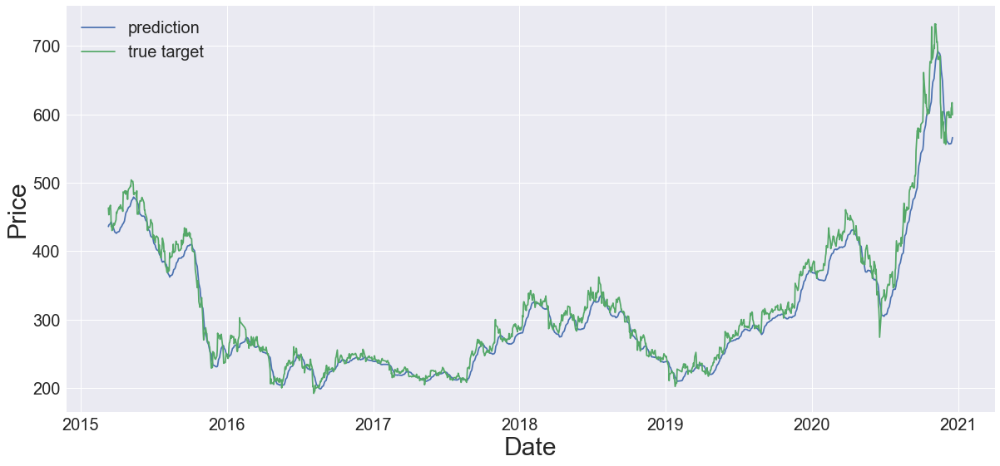

2454 Test Data


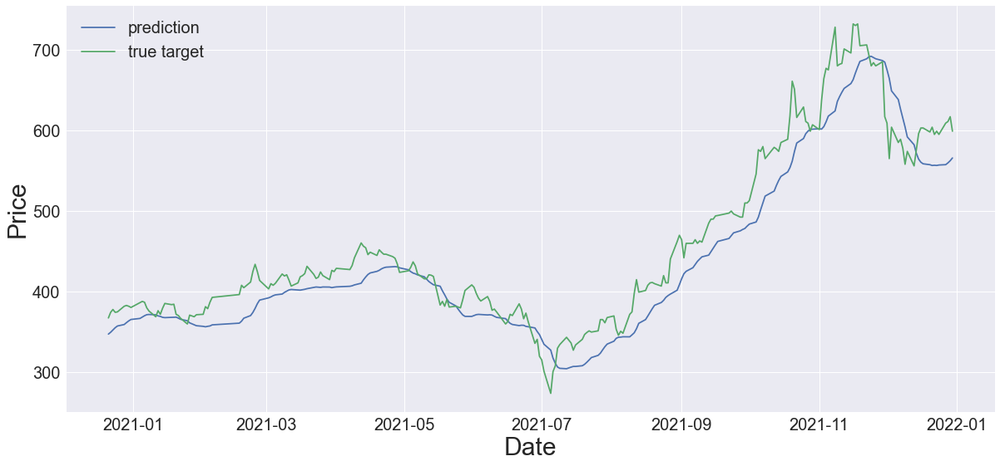

Model: "sequential_76"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_76 (LSTM)              (None, 10)                760       
                                                                 
 dense_152 (Dense)           (None, 5)                 55        
                                                                 
 dense_153 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 24s 1s/step - loss: 0.0609 - mse: 2.3872e-04 - val_loss: 0.0527 - val_mse: 2.4299e-04
Epoch 2/50
12/12 [==============================] - 9s 763ms/step - loss: 0.0473 - mse: 1.5364e-04 - val_loss: 0.0404 - val_mse: 1.9783e-04
Epoch 3/50
12/12 [=======================

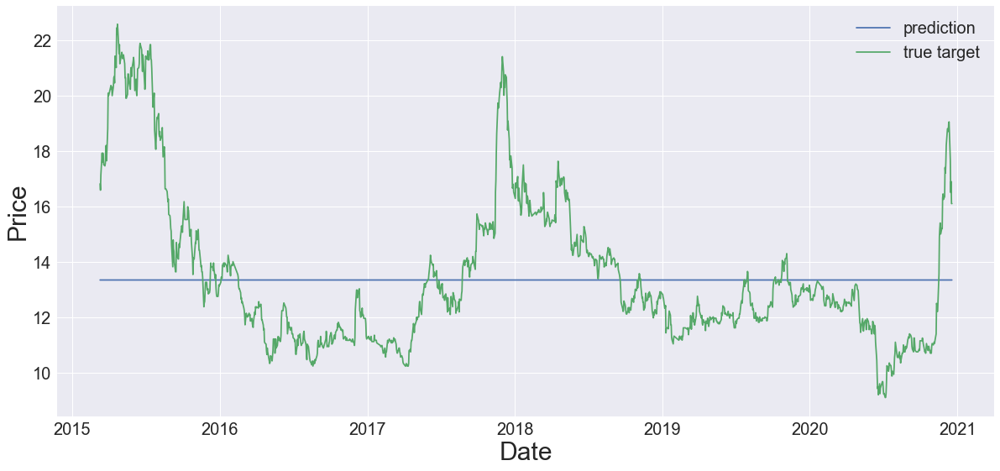

2603 Test Data


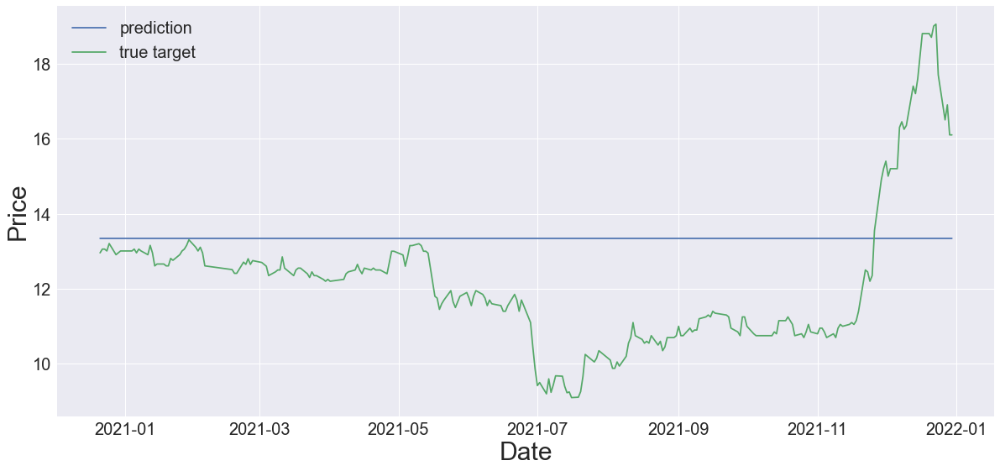

Model: "sequential_77"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_77 (LSTM)              (None, 10)                760       
                                                                 
 dense_154 (Dense)           (None, 5)                 55        
                                                                 
 dense_155 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 27s 1s/step - loss: 0.0666 - mse: 7.4902e-04 - val_loss: 0.0579 - val_mse: 2.8386e-04
Epoch 2/50
12/12 [==============================] - 9s 754ms/step - loss: 0.0525 - mse: 3.0694e-04 - val_loss: 0.0452 - val_mse: 1.9933e-04
Epoch 3/50
12/12 [=======================

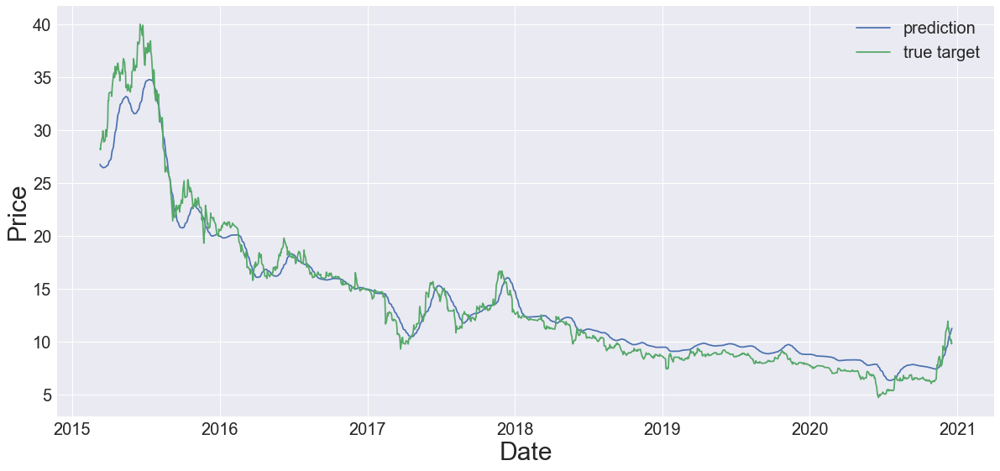

2609 Test Data


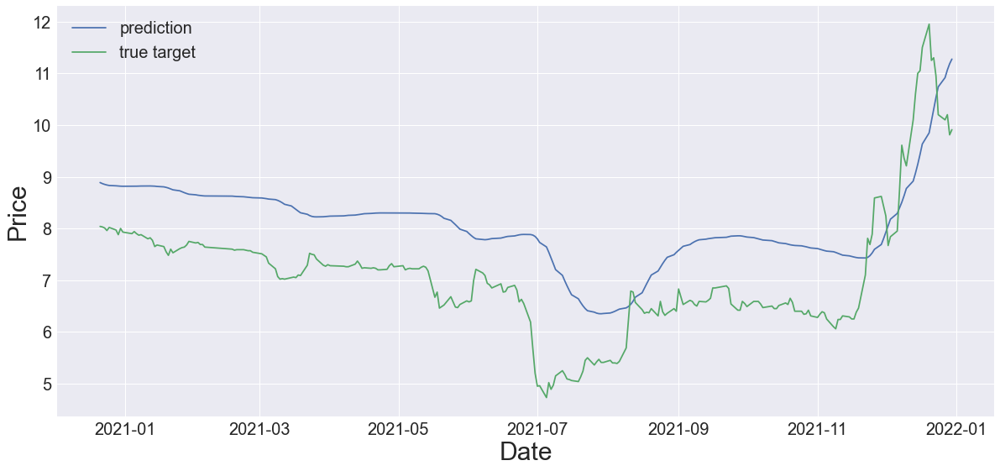

Model: "sequential_78"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_78 (LSTM)              (None, 10)                760       
                                                                 
 dense_156 (Dense)           (None, 5)                 55        
                                                                 
 dense_157 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 27s 1s/step - loss: 0.0798 - mse: 0.0116 - val_loss: 0.0708 - val_mse: 0.0107
Epoch 2/50
12/12 [==============================] - 9s 755ms/step - loss: 0.0581 - mse: 0.0032 - val_loss: 0.0488 - val_mse: 9.9458e-04
Epoch 3/50
12/12 [==============================] - 9

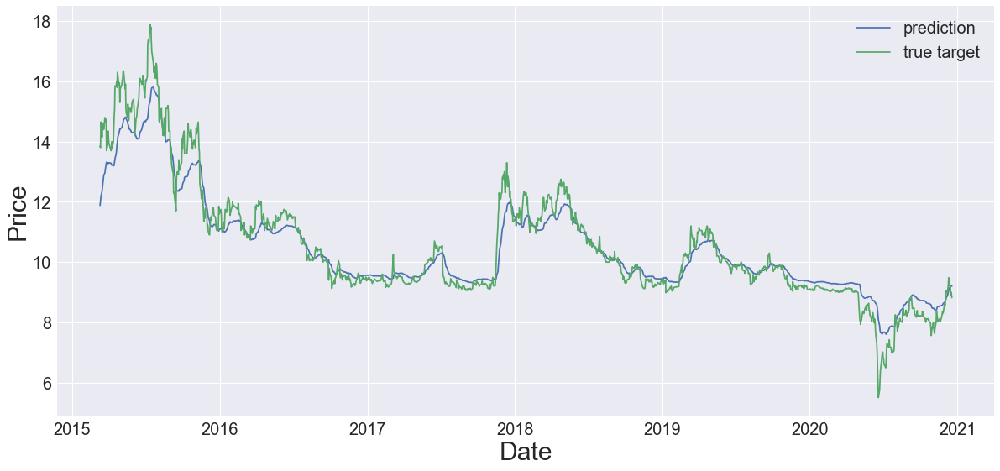

2610 Test Data


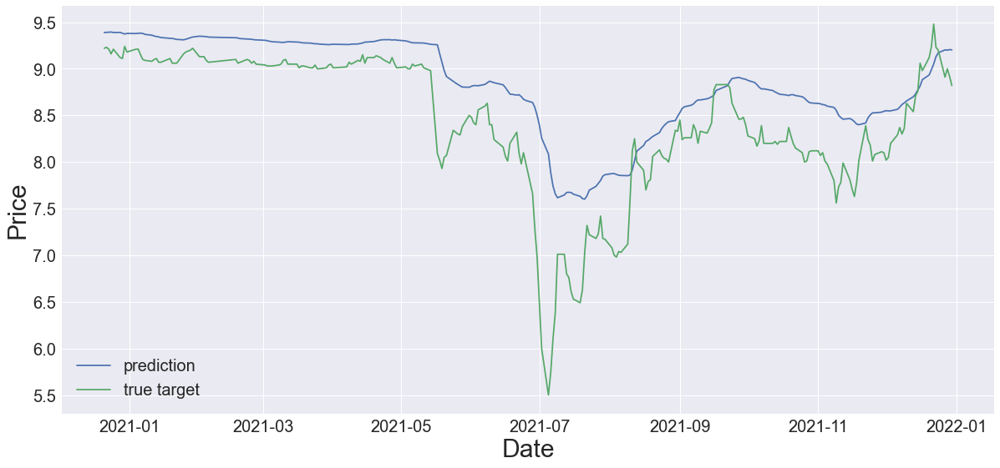

Model: "sequential_79"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_79 (LSTM)              (None, 10)                760       
                                                                 
 dense_158 (Dense)           (None, 5)                 55        
                                                                 
 dense_159 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 27s 1s/step - loss: 0.0649 - mse: 1.6756e-04 - val_loss: 0.0565 - val_mse: 1.2473e-04
Epoch 2/50
12/12 [==============================] - 9s 761ms/step - loss: 0.0510 - mse: 1.1280e-04 - val_loss: 0.0438 - val_mse: 1.3175e-04
Epoch 3/50
12/12 [=======================

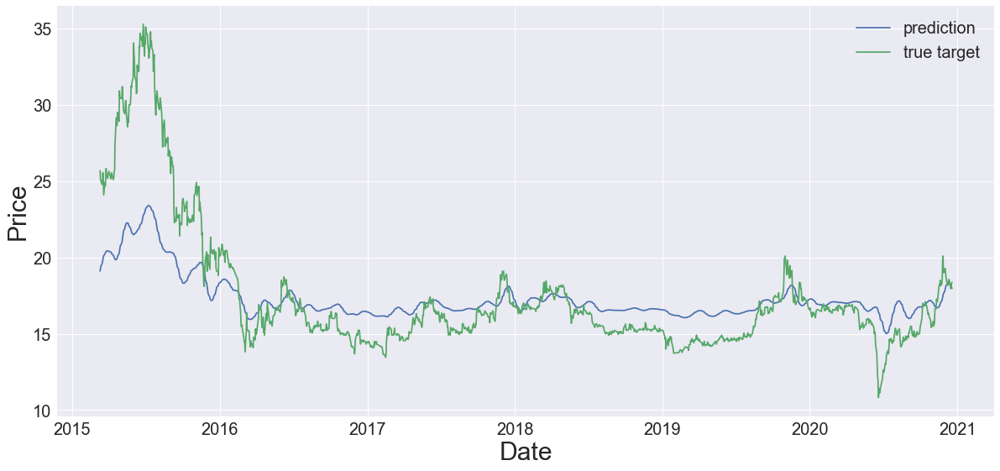

2615 Test Data


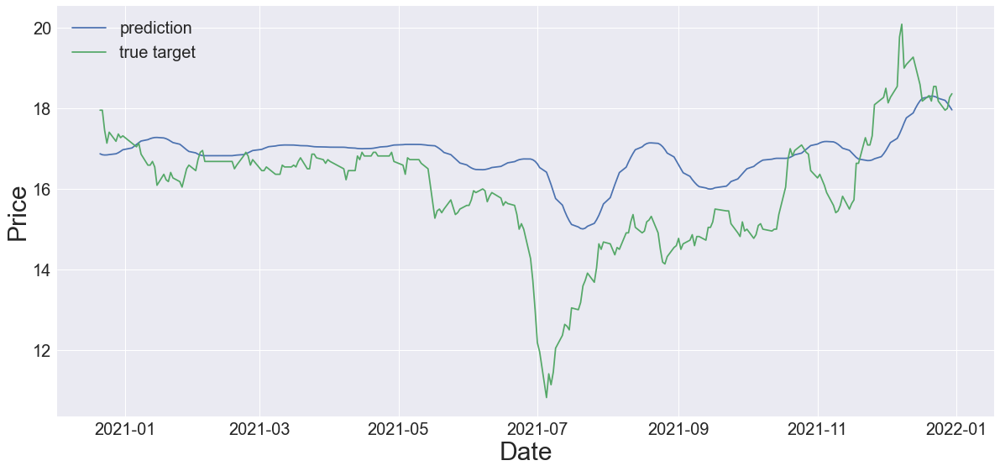

Model: "sequential_80"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_80 (LSTM)              (None, 10)                760       
                                                                 
 dense_160 (Dense)           (None, 5)                 55        
                                                                 
 dense_161 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 18s 957ms/step - loss: 0.1132 - mse: 0.0495 - val_loss: 0.0833 - val_mse: 0.0270
Epoch 2/50
12/12 [==============================] - 9s 709ms/step - loss: 0.0622 - mse: 0.0108 - val_loss: 0.0656 - val_mse: 0.0205
Epoch 3/50
12/12 [==============================] - 9s

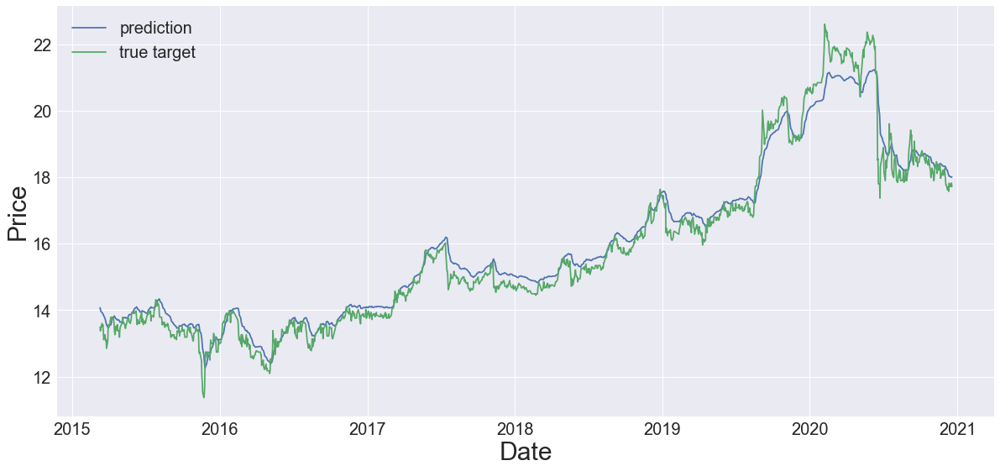

2801 Test Data


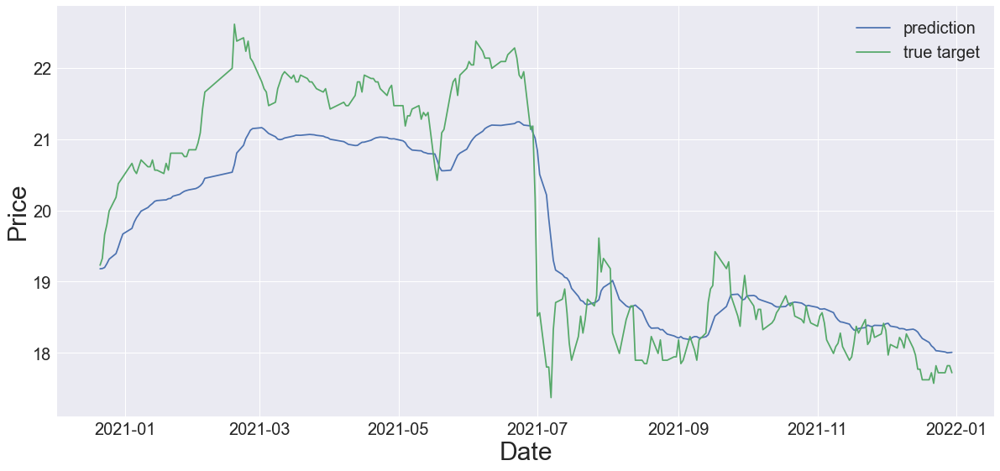

Model: "sequential_81"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_81 (LSTM)              (None, 10)                760       
                                                                 
 dense_162 (Dense)           (None, 5)                 55        
                                                                 
 dense_163 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 26s 1s/step - loss: 0.0938 - mse: 0.0328 - val_loss: 0.0648 - val_mse: 0.0111
Epoch 2/50
12/12 [==============================] - 9s 780ms/step - loss: 0.0587 - mse: 0.0099 - val_loss: 0.0595 - val_mse: 0.0170
Epoch 3/50
12/12 [==============================] - 9s 71

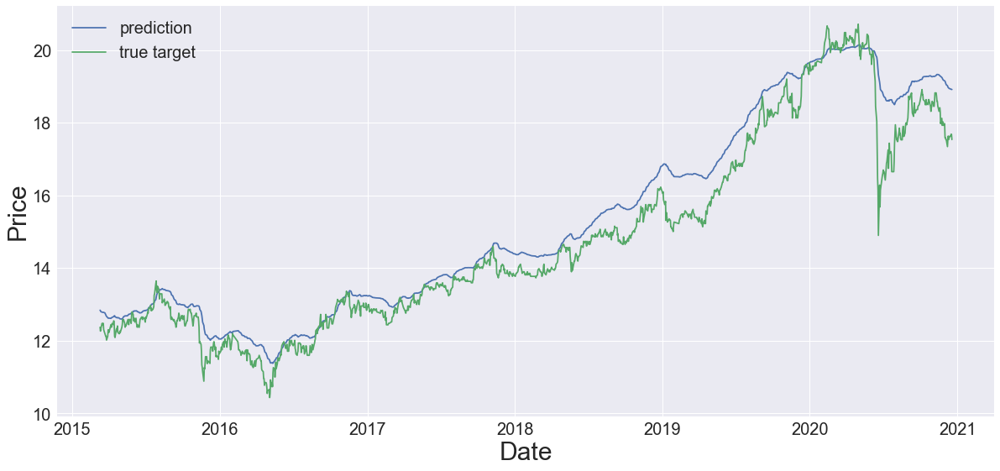

2880 Test Data


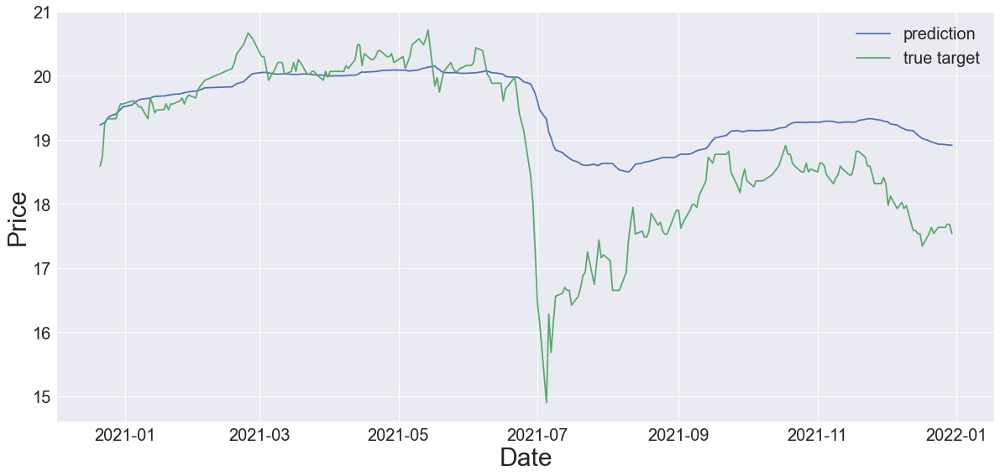

Model: "sequential_82"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_82 (LSTM)              (None, 10)                760       
                                                                 
 dense_164 (Dense)           (None, 5)                 55        
                                                                 
 dense_165 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 25s 1s/step - loss: 0.1841 - mse: 0.1203 - val_loss: 0.0829 - val_mse: 0.0269
Epoch 2/50
12/12 [==============================] - 9s 789ms/step - loss: 0.0789 - mse: 0.0278 - val_loss: 0.0608 - val_mse: 0.0160
Epoch 3/50
12/12 [==============================] - 9s 75

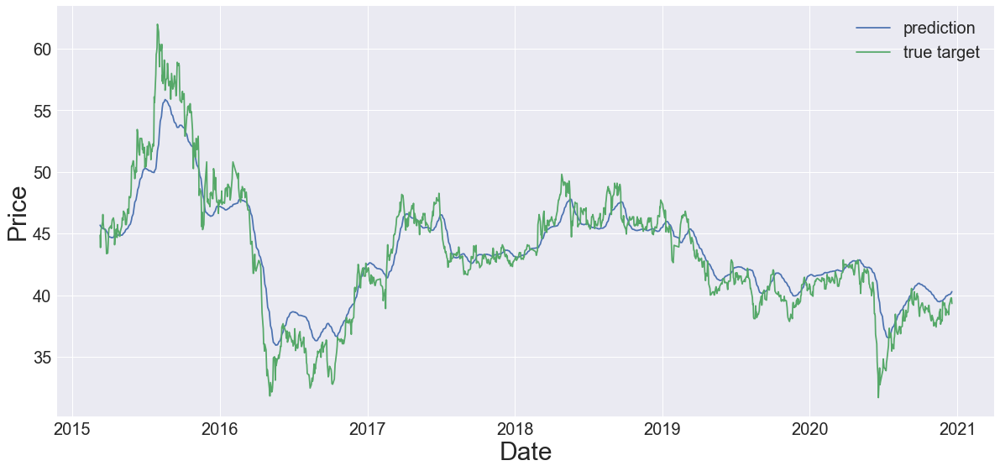

2881 Test Data


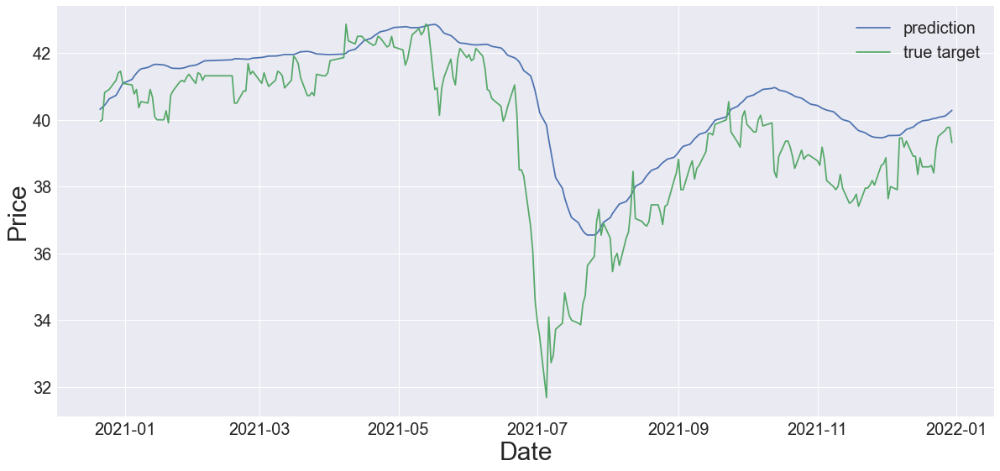

Model: "sequential_83"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_83 (LSTM)              (None, 10)                760       
                                                                 
 dense_166 (Dense)           (None, 5)                 55        
                                                                 
 dense_167 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 22s 861ms/step - loss: 0.1284 - mse: 0.0641 - val_loss: 0.1001 - val_mse: 0.0433
Epoch 2/50
12/12 [==============================] - 7s 603ms/step - loss: 0.0656 - mse: 0.0137 - val_loss: 0.0483 - val_mse: 0.0030
Epoch 3/50
12/12 [==============================] - 8s

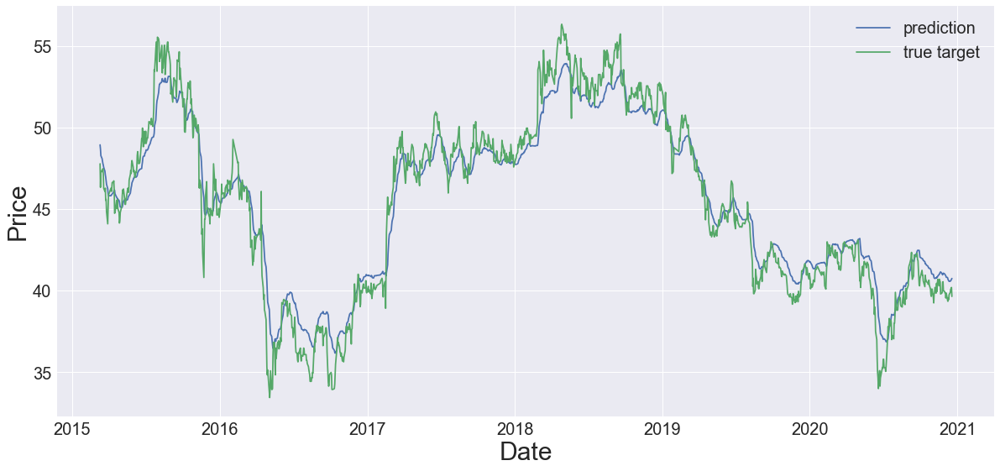

2882 Test Data


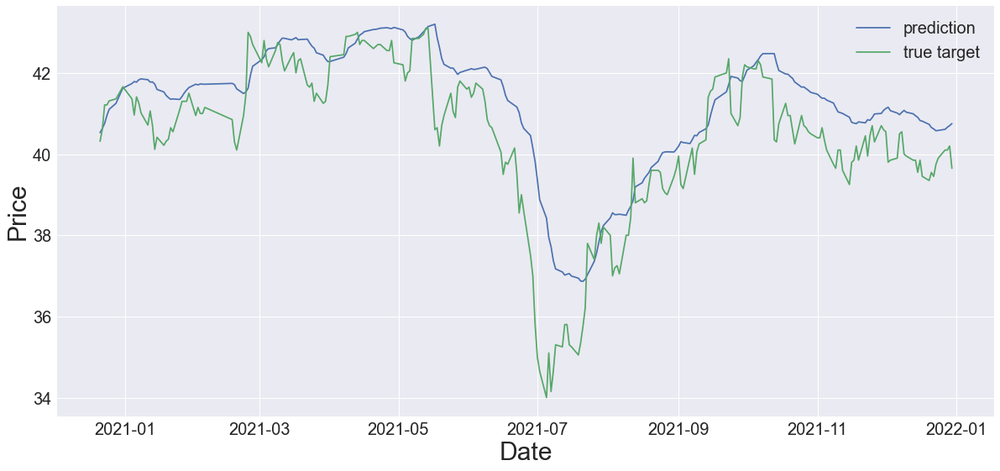

Model: "sequential_84"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_84 (LSTM)              (None, 10)                760       
                                                                 
 dense_168 (Dense)           (None, 5)                 55        
                                                                 
 dense_169 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 26s 1s/step - loss: 0.0740 - mse: 0.0078 - val_loss: 0.0618 - val_mse: 0.0034
Epoch 2/50
12/12 [==============================] - 9s 715ms/step - loss: 0.0578 - mse: 0.0046 - val_loss: 0.0514 - val_mse: 0.0051
Epoch 3/50
12/12 [==============================] - 9s 76

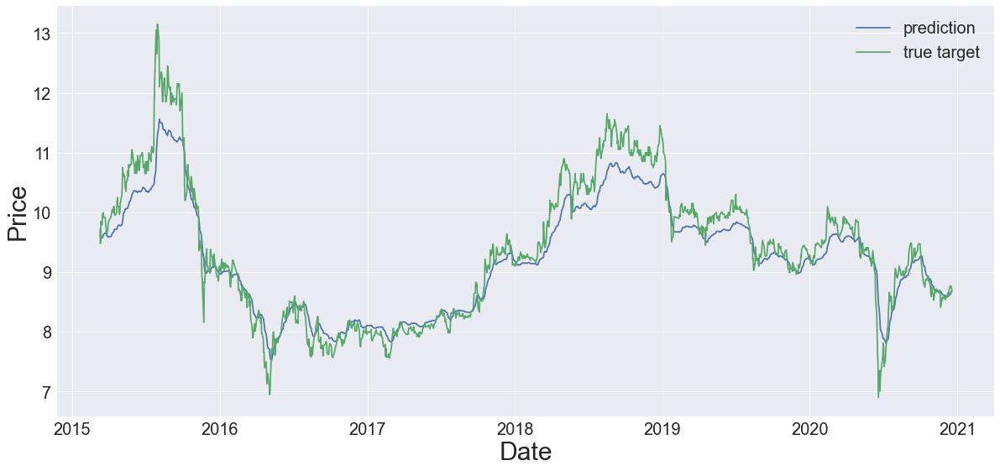

2883 Test Data


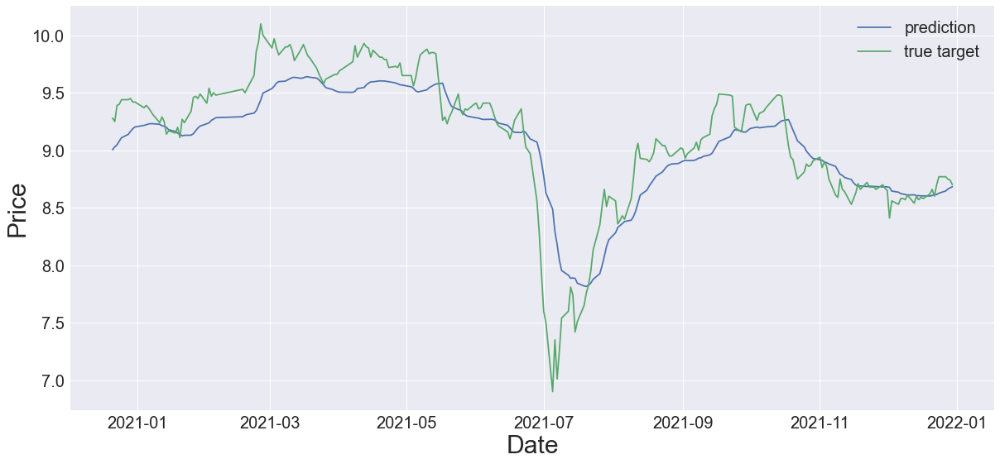

Model: "sequential_85"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_85 (LSTM)              (None, 10)                760       
                                                                 
 dense_170 (Dense)           (None, 5)                 55        
                                                                 
 dense_171 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 27s 1s/step - loss: 0.1372 - mse: 0.0714 - val_loss: 0.0792 - val_mse: 0.0207
Epoch 2/50
12/12 [==============================] - 9s 783ms/step - loss: 0.0702 - mse: 0.0168 - val_loss: 0.0961 - val_mse: 0.0491
Epoch 3/50
12/12 [==============================] - 9s 72

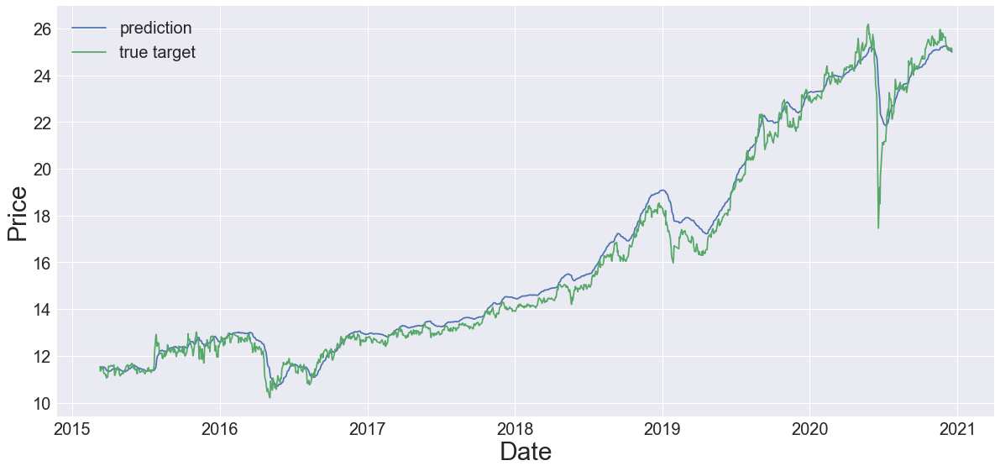

2884 Test Data


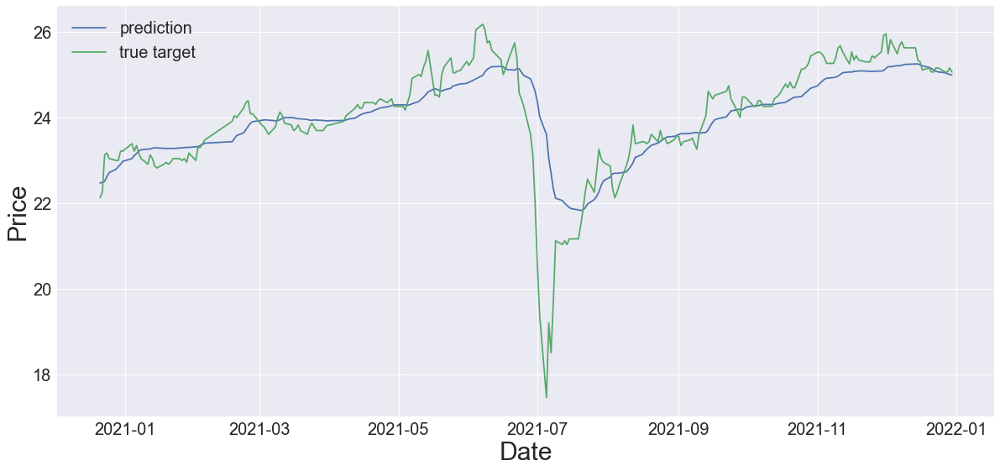

Model: "sequential_86"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_86 (LSTM)              (None, 10)                760       
                                                                 
 dense_172 (Dense)           (None, 5)                 55        
                                                                 
 dense_173 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 21s 794ms/step - loss: 0.1170 - mse: 0.0523 - val_loss: 0.0629 - val_mse: 0.0058
Epoch 2/50
12/12 [==============================] - 7s 619ms/step - loss: 0.0697 - mse: 0.0177 - val_loss: 0.0702 - val_mse: 0.0249
Epoch 3/50
12/12 [==============================] - 9s

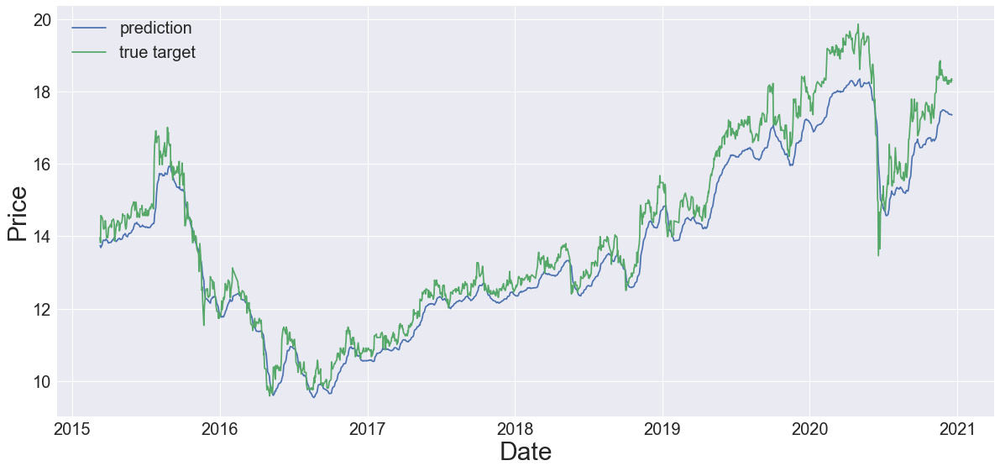

2885 Test Data


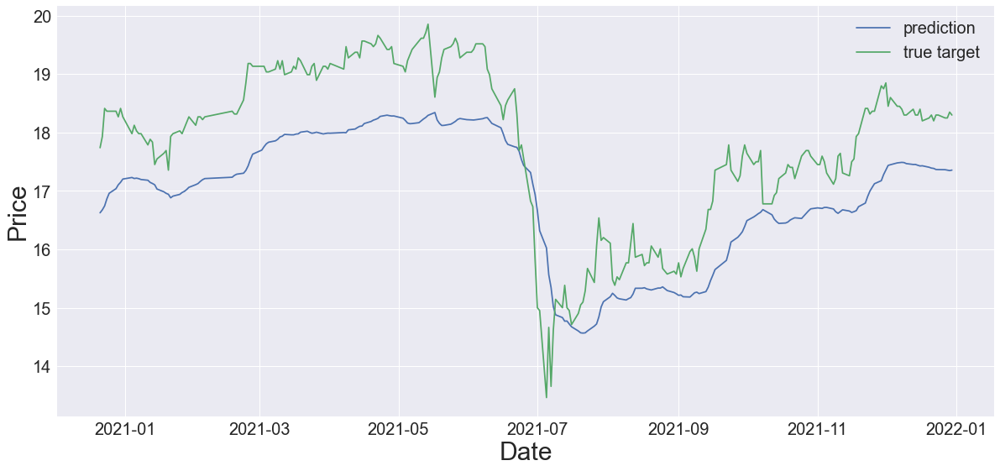

Model: "sequential_87"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_87 (LSTM)              (None, 10)                760       
                                                                 
 dense_174 (Dense)           (None, 5)                 55        
                                                                 
 dense_175 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 725ms/step - loss: 0.2014 - mse: 0.1352 - val_loss: 0.0836 - val_mse: 0.0247
Epoch 2/50
12/12 [==============================] - 7s 595ms/step - loss: 0.0748 - mse: 0.0207 - val_loss: 0.0576 - val_mse: 0.0100
Epoch 3/50
12/12 [==============================] - 7s

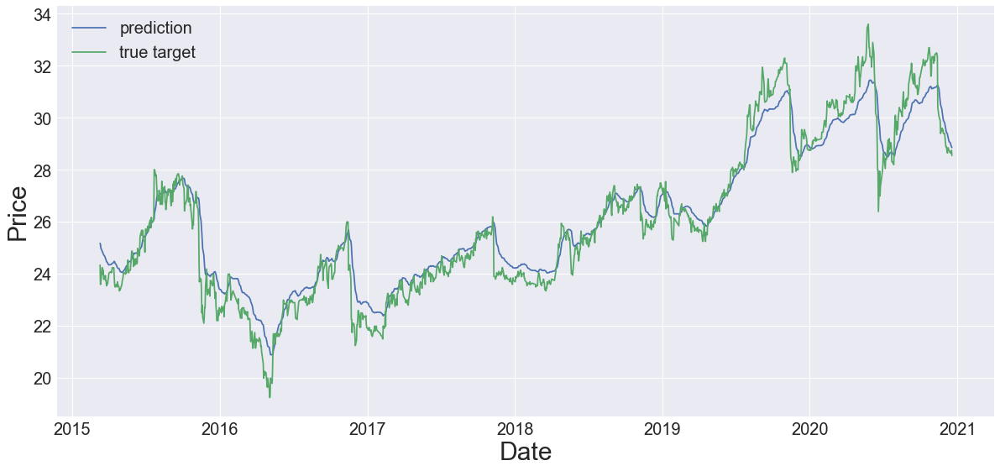

2886 Test Data


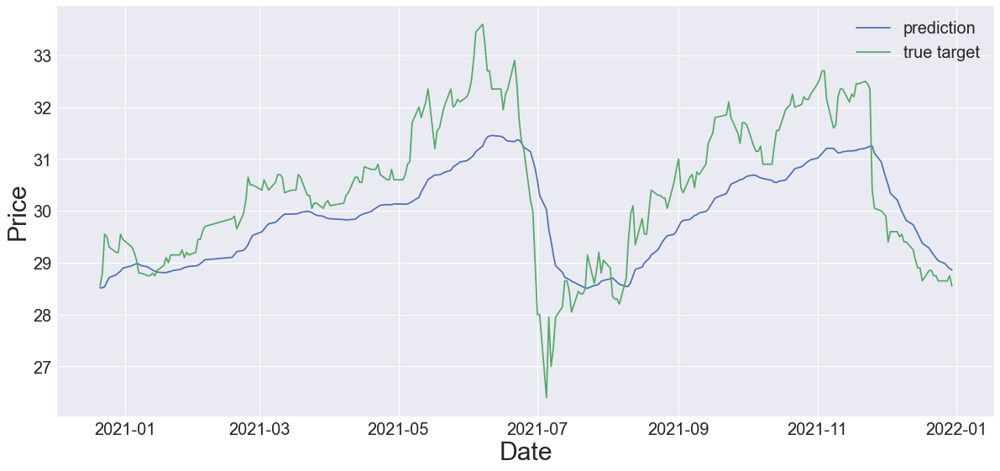

Model: "sequential_88"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_88 (LSTM)              (None, 10)                760       
                                                                 
 dense_176 (Dense)           (None, 5)                 55        
                                                                 
 dense_177 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 702ms/step - loss: 0.0821 - mse: 0.0186 - val_loss: 0.0606 - val_mse: 0.0046
Epoch 2/50
12/12 [==============================] - 7s 623ms/step - loss: 0.0554 - mse: 0.0044 - val_loss: 0.0494 - val_mse: 0.0051
Epoch 3/50
12/12 [==============================] - 7s

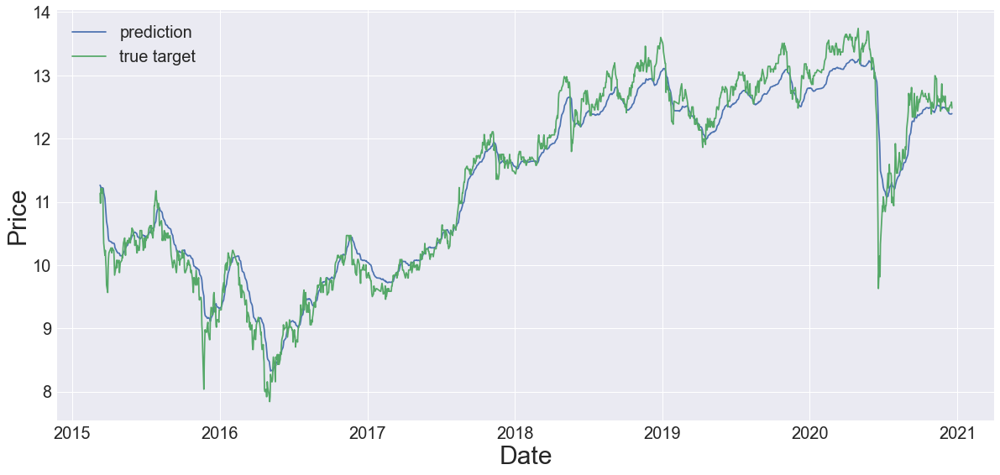

2887 Test Data


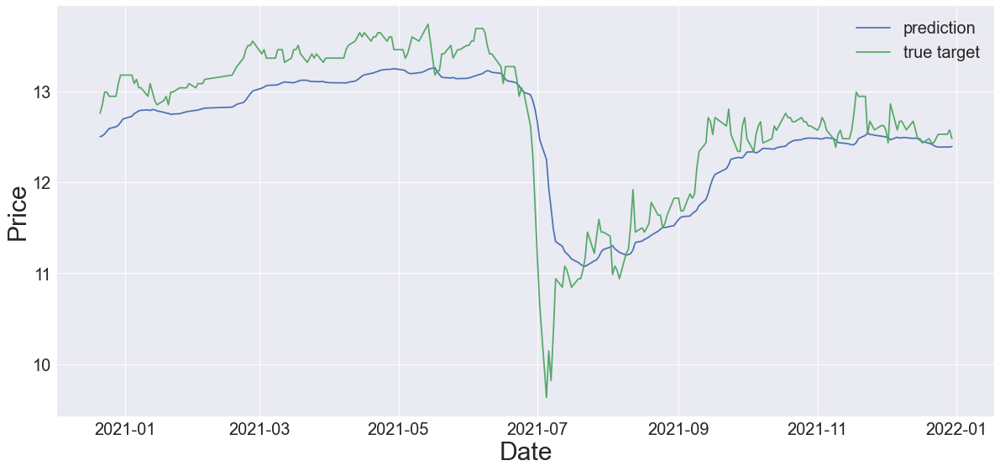

Model: "sequential_89"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_89 (LSTM)              (None, 10)                760       
                                                                 
 dense_178 (Dense)           (None, 5)                 55        
                                                                 
 dense_179 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 714ms/step - loss: 0.1736 - mse: 0.1101 - val_loss: 0.0666 - val_mse: 0.0104
Epoch 2/50
12/12 [==============================] - 7s 623ms/step - loss: 0.0700 - mse: 0.0186 - val_loss: 0.0556 - val_mse: 0.0107
Epoch 3/50
12/12 [==============================] - 8s

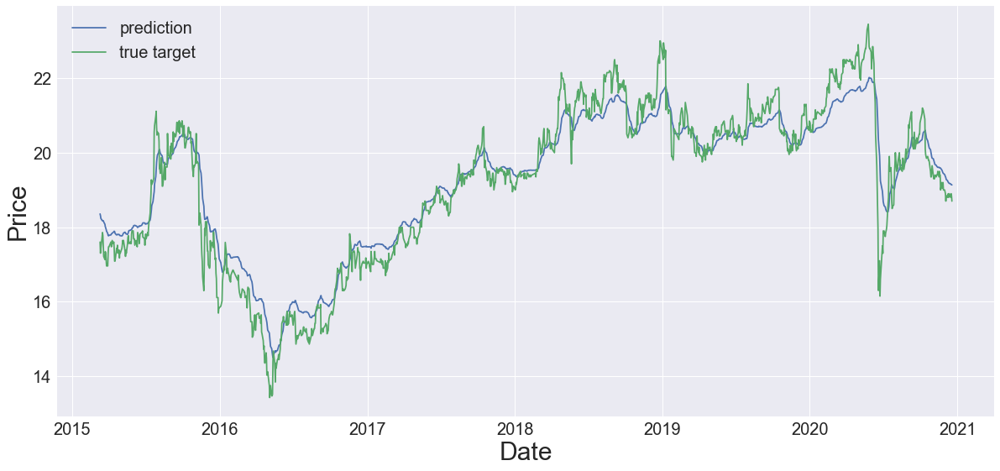

2891 Test Data


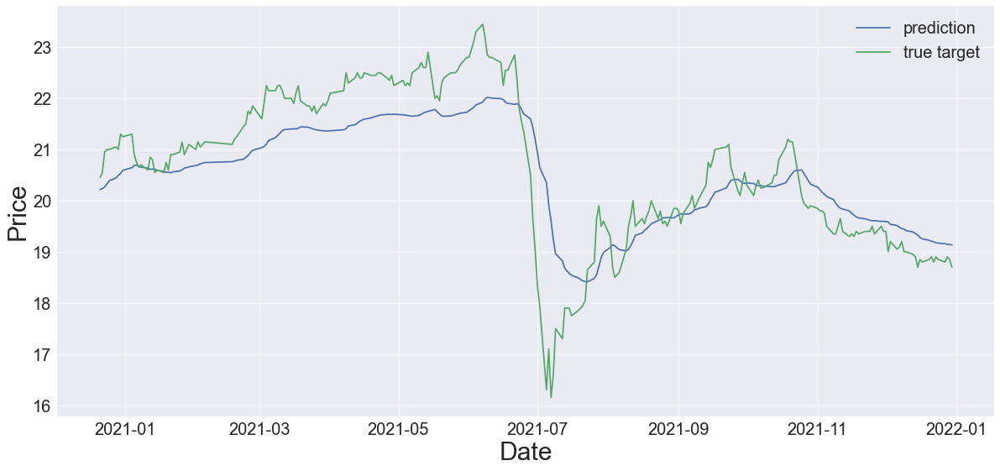

Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_90 (LSTM)              (None, 10)                760       
                                                                 
 dense_180 (Dense)           (None, 5)                 55        
                                                                 
 dense_181 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 704ms/step - loss: 0.1480 - mse: 0.0808 - val_loss: 0.0762 - val_mse: 0.0163
Epoch 2/50
12/12 [==============================] - 7s 580ms/step - loss: 0.0733 - mse: 0.0184 - val_loss: 0.0830 - val_mse: 0.0345
Epoch 3/50
12/12 [==============================] - 6s

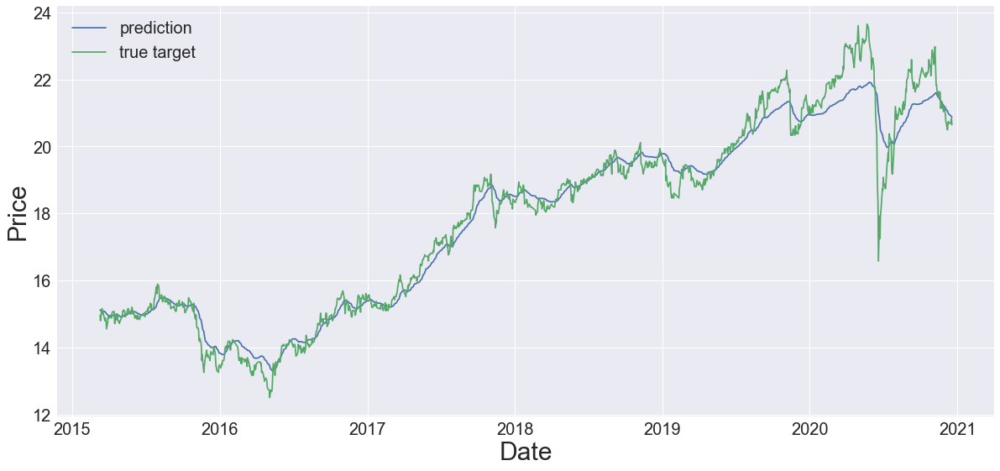

2892 Test Data


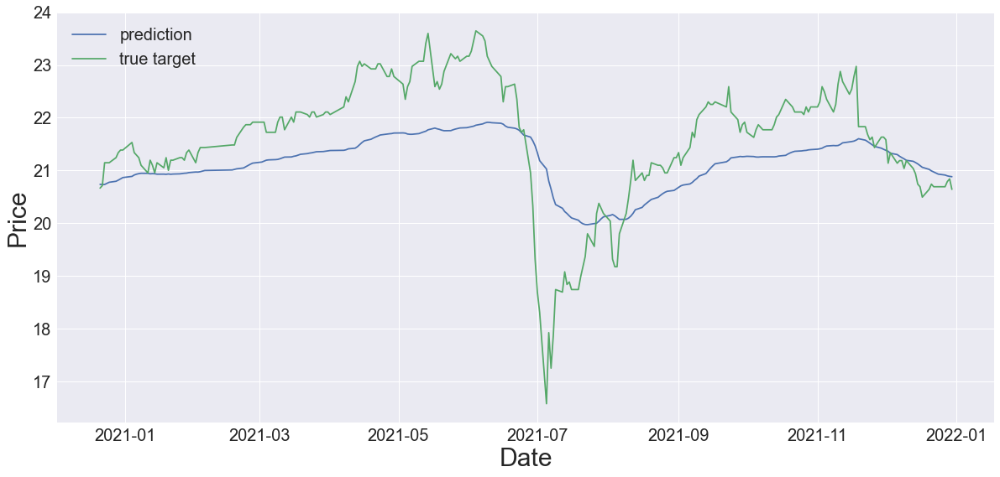

Model: "sequential_91"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_91 (LSTM)              (None, 10)                760       
                                                                 
 dense_182 (Dense)           (None, 5)                 55        
                                                                 
 dense_183 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 722ms/step - loss: 0.1911 - mse: 0.1288 - val_loss: 0.0582 - val_mse: 0.0030
Epoch 2/50
12/12 [==============================] - 7s 609ms/step - loss: 0.0706 - mse: 0.0201 - val_loss: 0.0477 - val_mse: 0.0035
Epoch 3/50
12/12 [==============================] - 7s

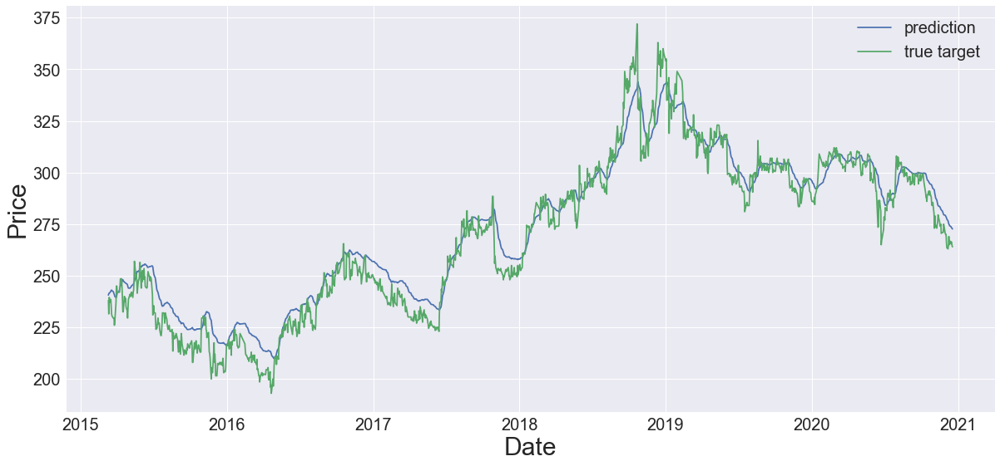

2912 Test Data


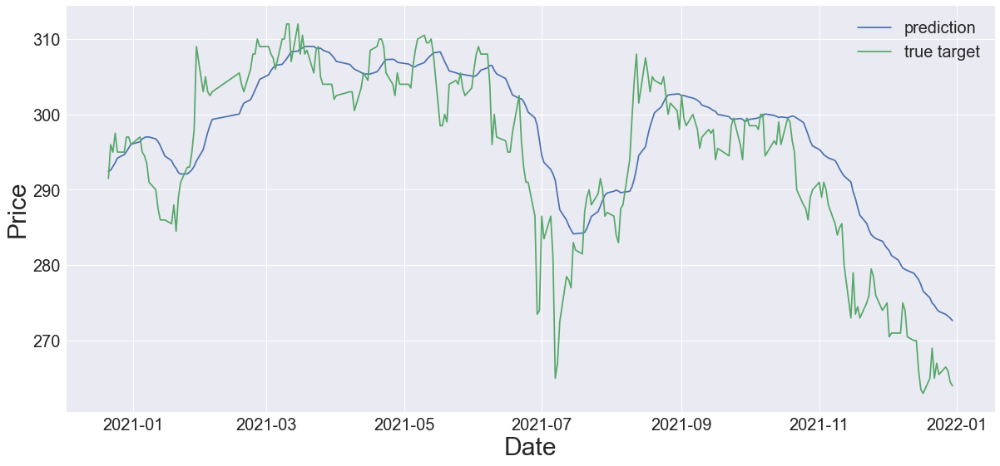

Model: "sequential_92"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_92 (LSTM)              (None, 10)                760       
                                                                 
 dense_184 (Dense)           (None, 5)                 55        
                                                                 
 dense_185 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 724ms/step - loss: 0.0745 - mse: 0.0120 - val_loss: 0.0616 - val_mse: 0.0068
Epoch 2/50
12/12 [==============================] - 8s 709ms/step - loss: 0.0593 - mse: 0.0096 - val_loss: 0.0500 - val_mse: 0.0069
Epoch 3/50
12/12 [==============================] - 7s

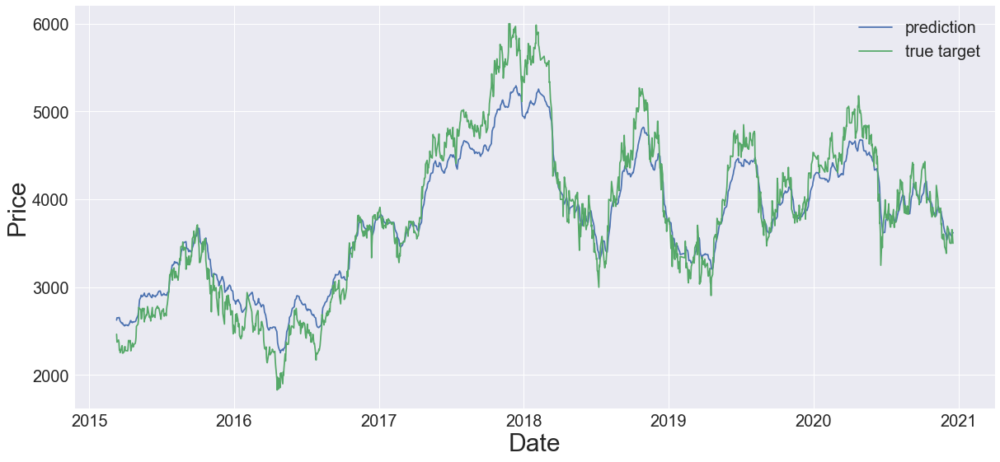

3008 Test Data


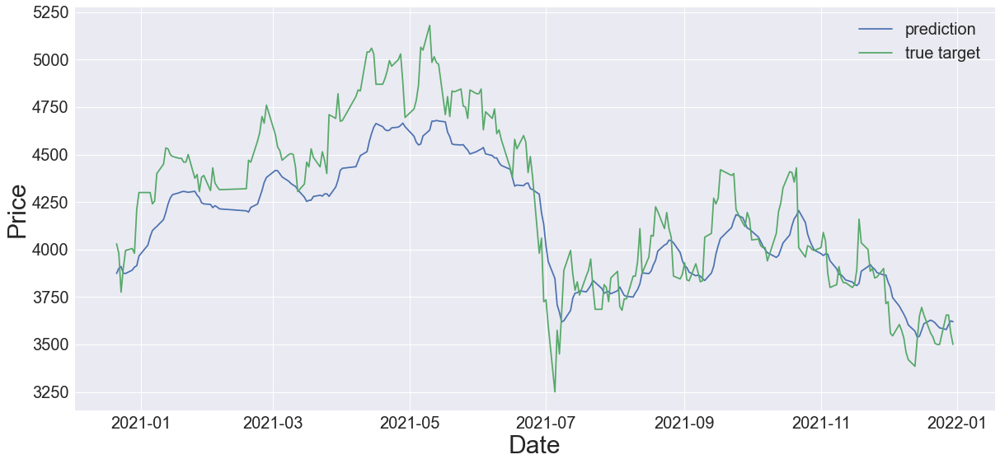

Model: "sequential_93"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_93 (LSTM)              (None, 10)                760       
                                                                 
 dense_186 (Dense)           (None, 5)                 55        
                                                                 
 dense_187 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 719ms/step - loss: 0.0787 - mse: 0.0159 - val_loss: 0.0607 - val_mse: 0.0058
Epoch 2/50
12/12 [==============================] - 7s 593ms/step - loss: 0.0558 - mse: 0.0060 - val_loss: 0.0583 - val_mse: 0.0154
Epoch 3/50
12/12 [==============================] - 7s

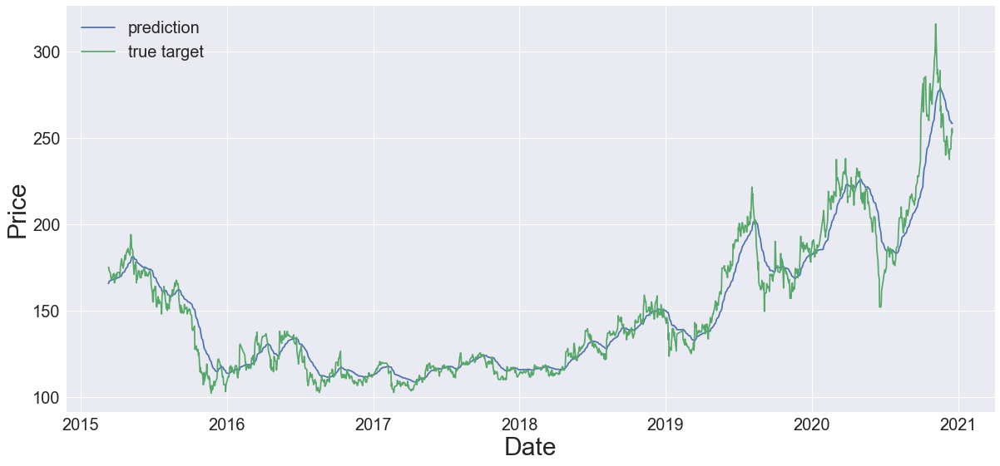

3034 Test Data


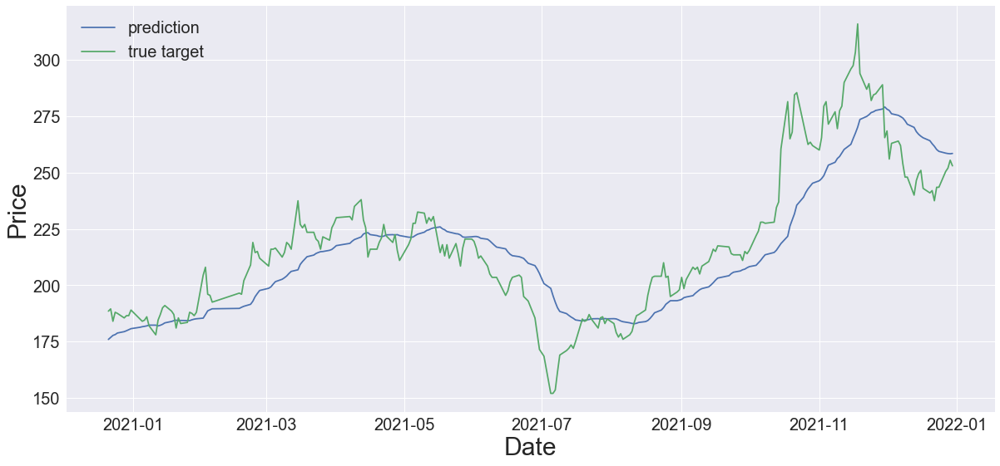

Model: "sequential_94"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_94 (LSTM)              (None, 10)                760       
                                                                 
 dense_188 (Dense)           (None, 5)                 55        
                                                                 
 dense_189 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 745ms/step - loss: 0.0709 - mse: 0.0056 - val_loss: 0.0669 - val_mse: 0.0099
Epoch 2/50
12/12 [==============================] - 7s 593ms/step - loss: 0.0547 - mse: 0.0032 - val_loss: 0.0546 - val_mse: 0.0103
Epoch 3/50
12/12 [==============================] - 7s

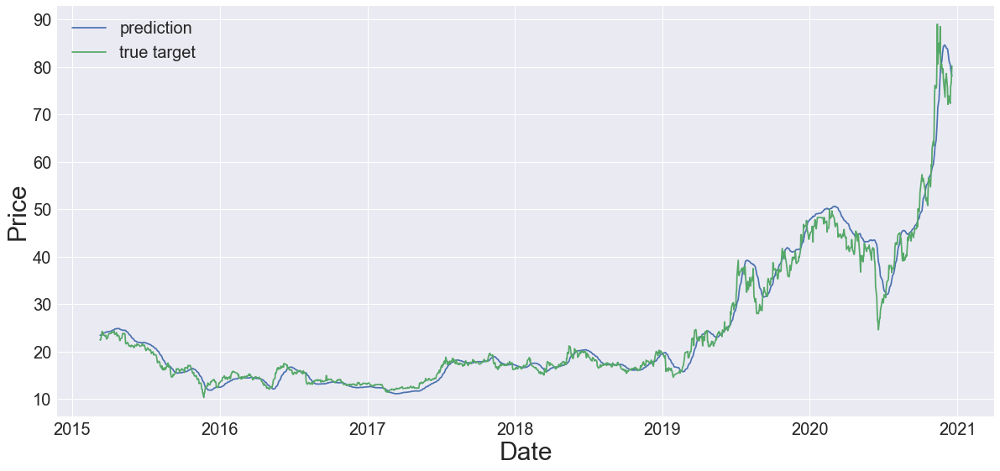

3037 Test Data


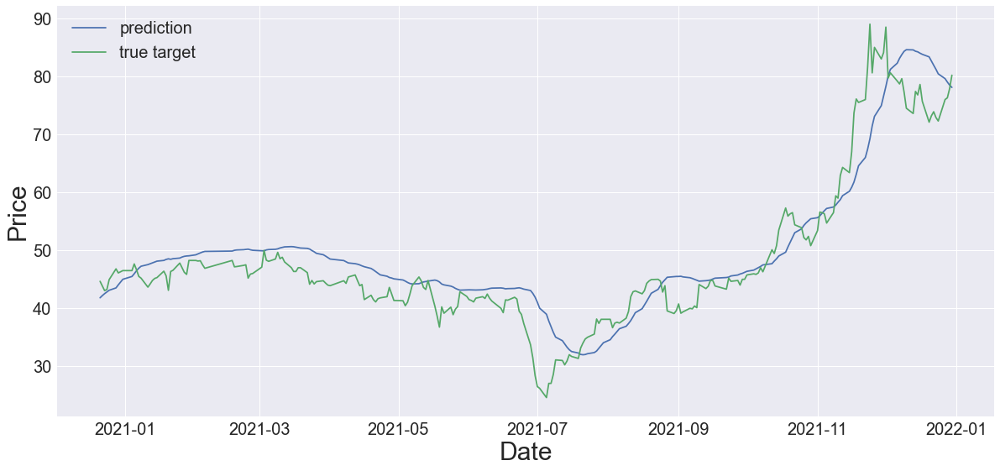

Model: "sequential_95"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_95 (LSTM)              (None, 10)                760       
                                                                 
 dense_190 (Dense)           (None, 5)                 55        
                                                                 
 dense_191 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 719ms/step - loss: 0.1492 - mse: 0.0807 - val_loss: 0.1101 - val_mse: 0.0490
Epoch 2/50
12/12 [==============================] - 7s 623ms/step - loss: 0.0735 - mse: 0.0172 - val_loss: 0.0601 - val_mse: 0.0101
Epoch 3/50
12/12 [==============================] - 7s

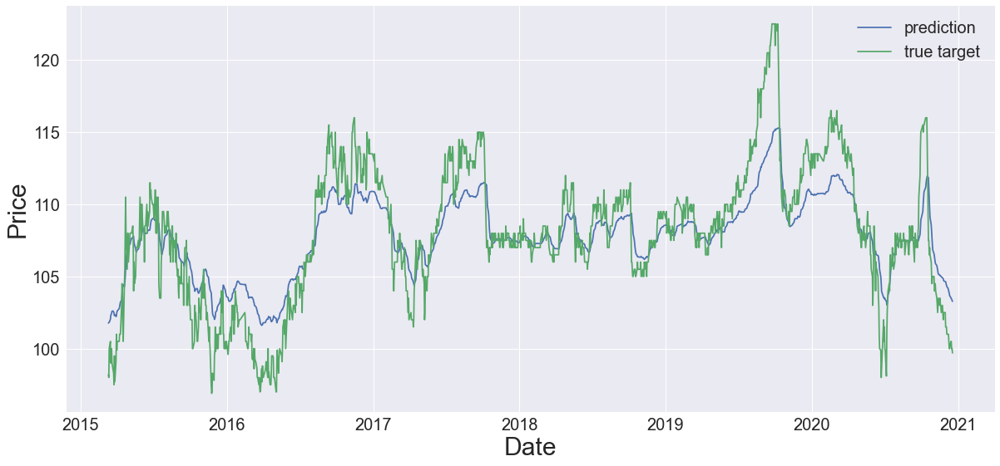

3045 Test Data


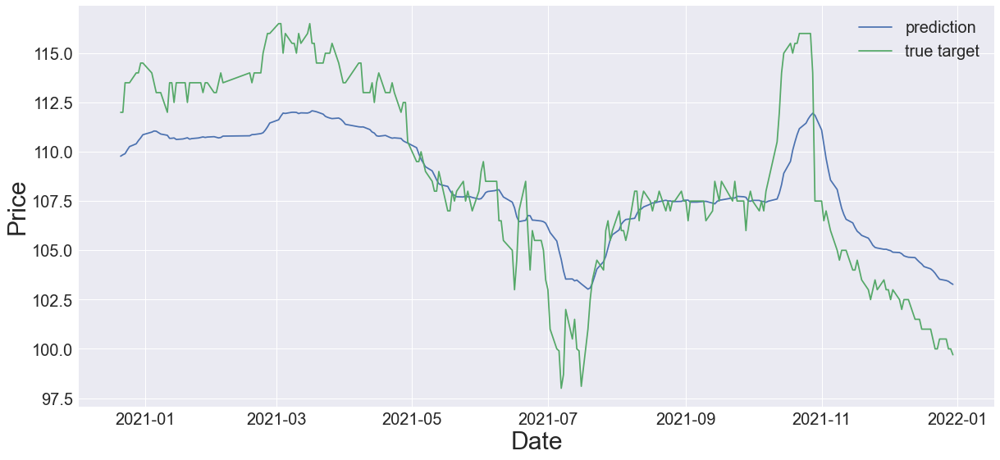

Model: "sequential_96"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_96 (LSTM)              (None, 10)                760       
                                                                 
 dense_192 (Dense)           (None, 5)                 55        
                                                                 
 dense_193 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
11/11 [==============================] - 13s 713ms/step - loss: 0.1053 - mse: 0.0402 - val_loss: 0.0720 - val_mse: 0.0136
Epoch 2/50
11/11 [==============================] - 7s 611ms/step - loss: 0.0644 - mse: 0.0111 - val_loss: 0.0552 - val_mse: 0.0077
Epoch 3/50
11/11 [==============================] - 7s

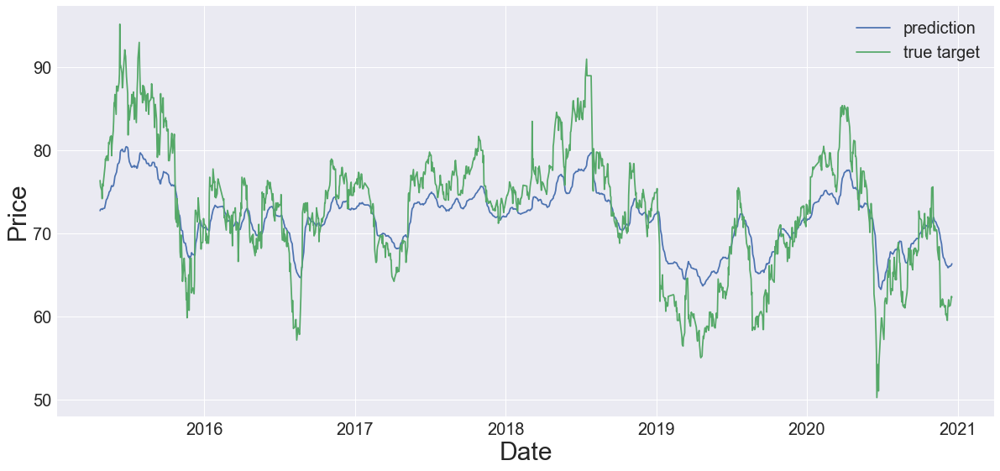

3711 Test Data


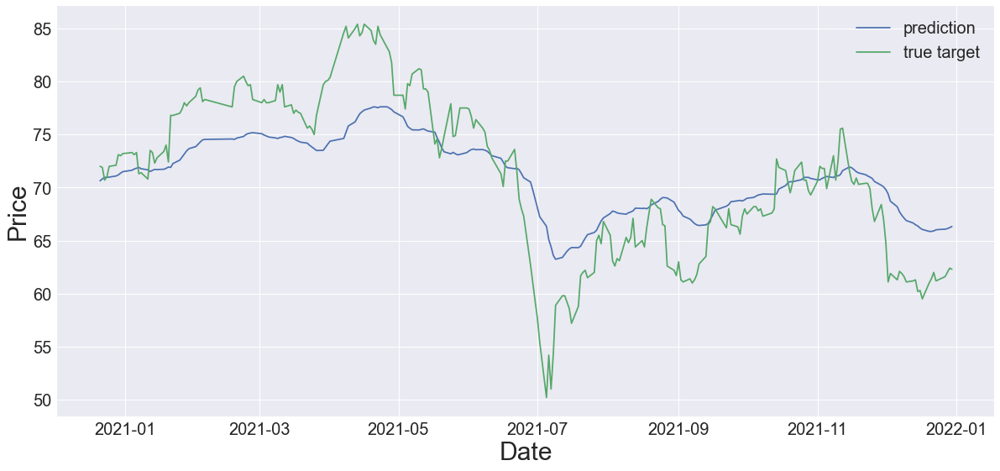

Model: "sequential_97"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_97 (LSTM)              (None, 10)                760       
                                                                 
 dense_194 (Dense)           (None, 5)                 55        
                                                                 
 dense_195 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 17s 924ms/step - loss: 0.1267 - mse: 0.0632 - val_loss: 0.1029 - val_mse: 0.0466
Epoch 2/50
12/12 [==============================] - 8s 704ms/step - loss: 0.0619 - mse: 0.0105 - val_loss: 0.0504 - val_mse: 0.0055
Epoch 3/50
12/12 [==============================] - 8s

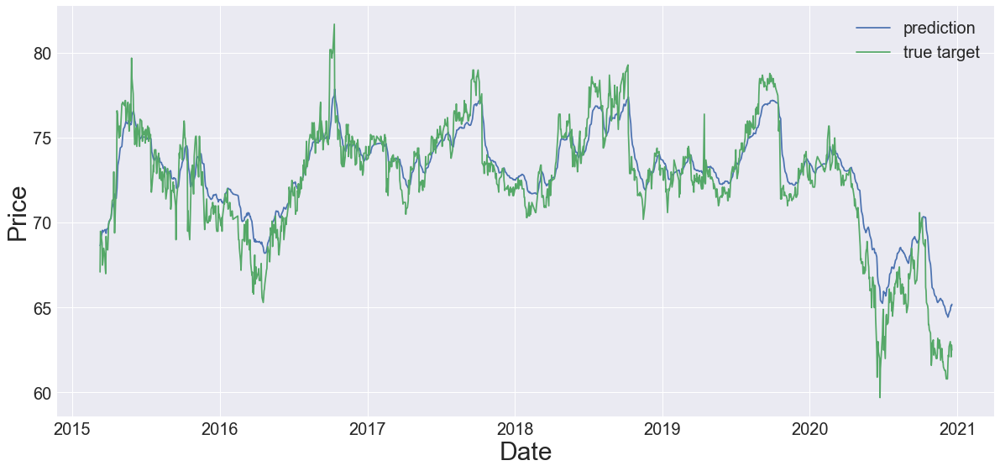

4904 Test Data


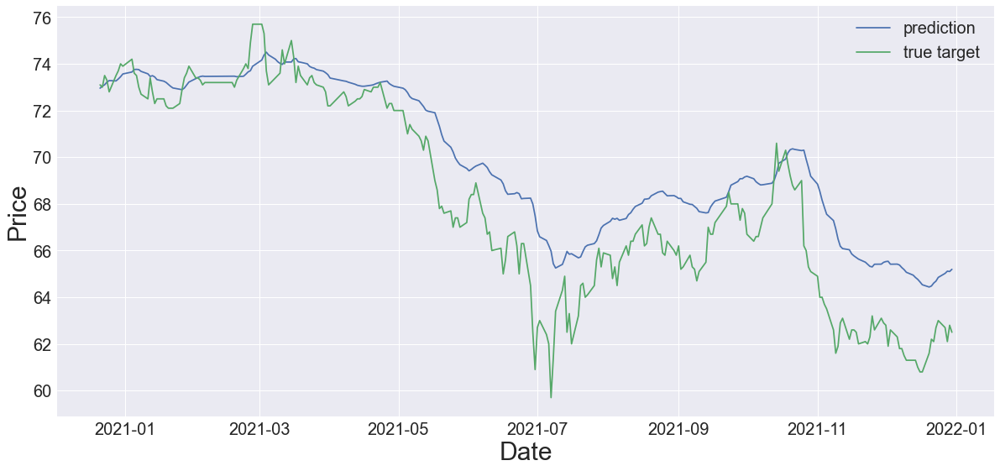

Model: "sequential_98"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_98 (LSTM)              (None, 10)                760       
                                                                 
 dense_196 (Dense)           (None, 5)                 55        
                                                                 
 dense_197 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 10s 691ms/step - loss: 0.0809 - mse: 0.0197 - val_loss: 0.0568 - val_mse: 0.0033
Epoch 2/50
12/12 [==============================] - 7s 610ms/step - loss: 0.0549 - mse: 0.0064 - val_loss: 0.0589 - val_mse: 0.0170
Epoch 3/50
12/12 [==============================] - 7s

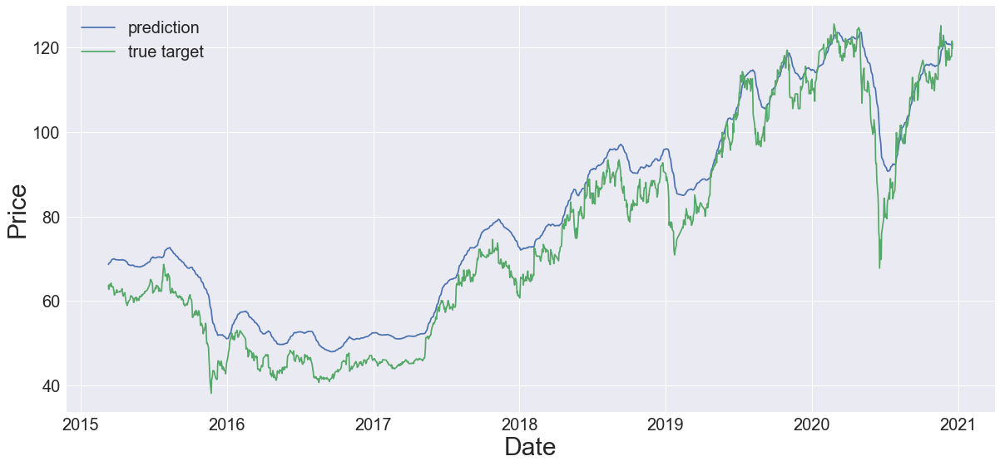

5871 Test Data


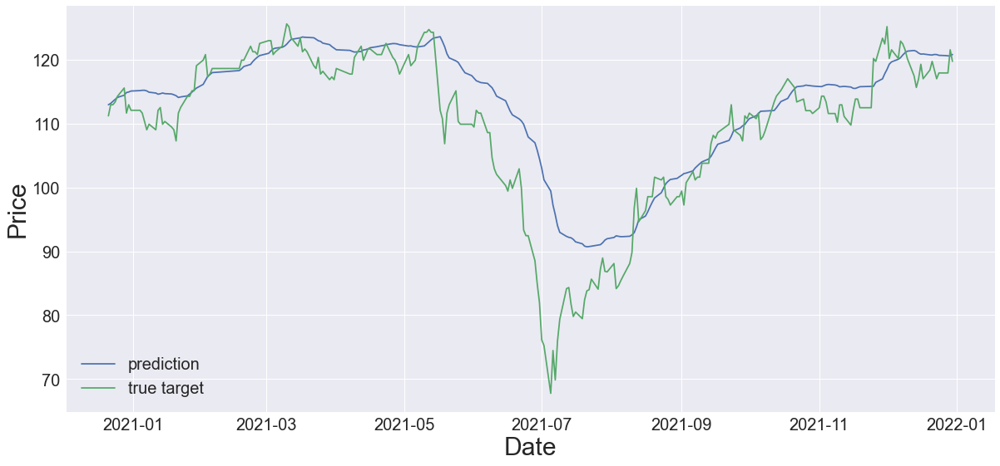

Model: "sequential_99"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_99 (LSTM)              (None, 10)                760       
                                                                 
 dense_198 (Dense)           (None, 5)                 55        
                                                                 
 dense_199 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 750ms/step - loss: 0.0815 - mse: 0.0210 - val_loss: 0.0712 - val_mse: 0.0184
Epoch 2/50
12/12 [==============================] - 7s 608ms/step - loss: 0.0576 - mse: 0.0098 - val_loss: 0.0594 - val_mse: 0.0181
Epoch 3/50
12/12 [==============================] - 7s

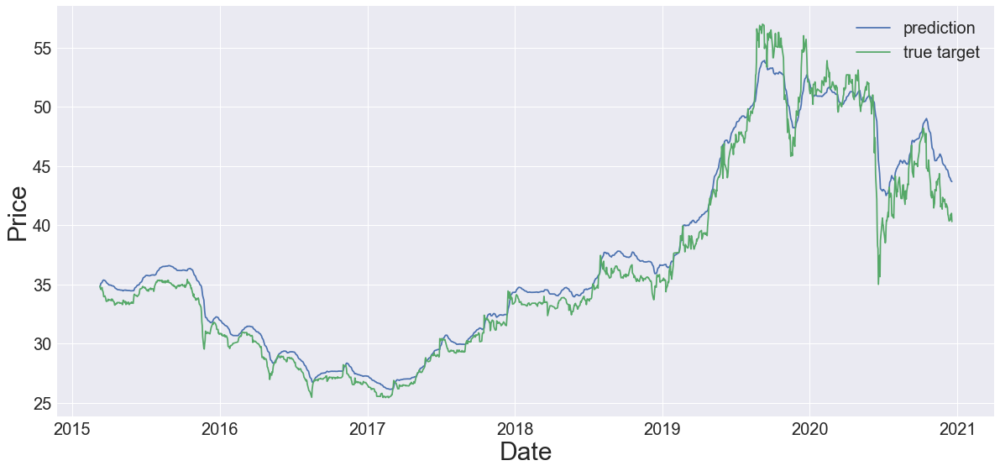

5876 Test Data


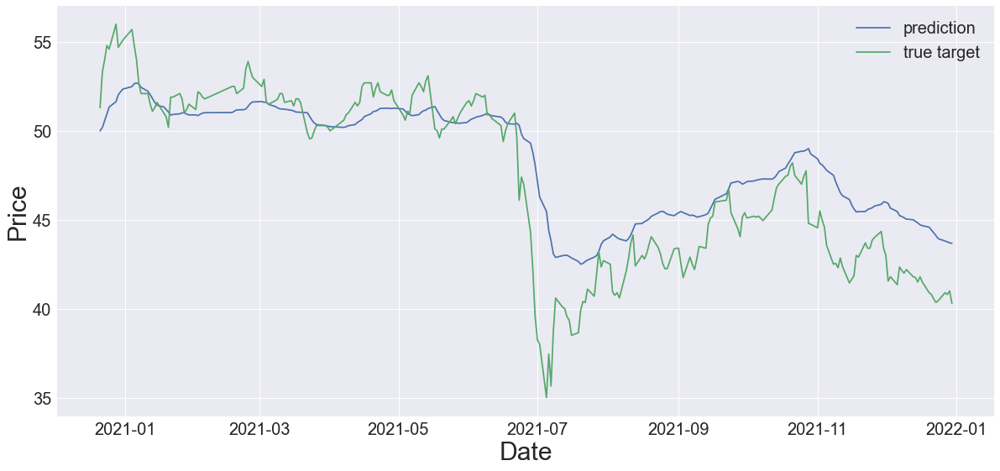

Model: "sequential_100"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_100 (LSTM)             (None, 10)                760       
                                                                 
 dense_200 (Dense)           (None, 5)                 55        
                                                                 
 dense_201 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 739ms/step - loss: 0.1481 - mse: 0.0836 - val_loss: 0.1164 - val_mse: 0.0596
Epoch 2/50
12/12 [==============================] - 7s 604ms/step - loss: 0.0755 - mse: 0.0238 - val_loss: 0.0537 - val_mse: 0.0089
Epoch 3/50
12/12 [==============================] - 7

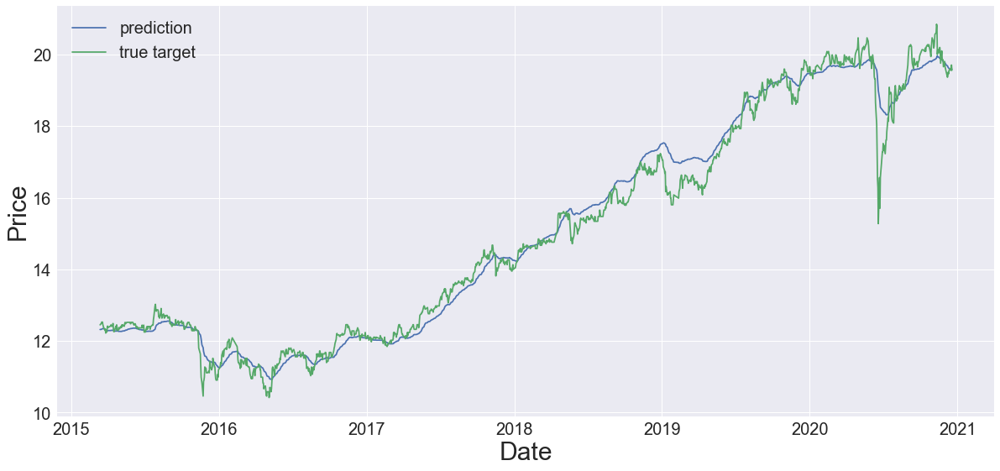

5880 Test Data


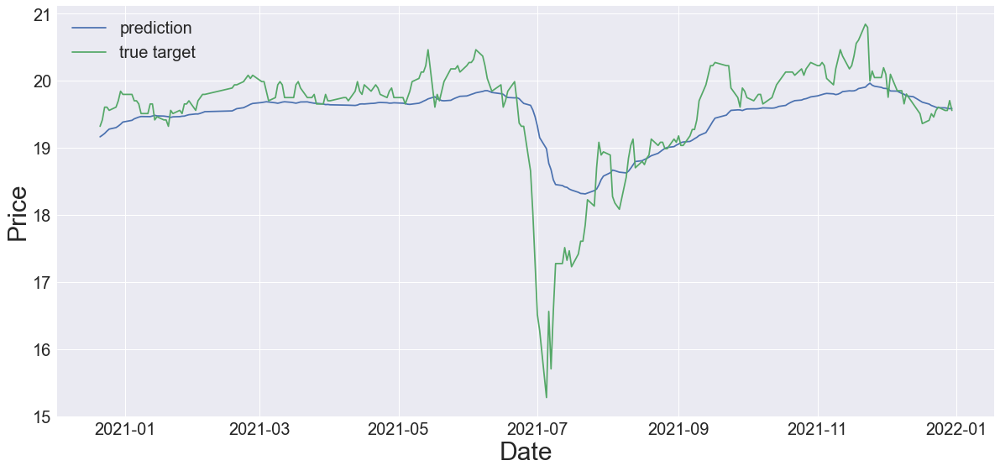

Model: "sequential_101"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_101 (LSTM)             (None, 10)                760       
                                                                 
 dense_202 (Dense)           (None, 5)                 55        
                                                                 
 dense_203 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 739ms/step - loss: 0.0644 - mse: 0.0025 - val_loss: 0.0588 - val_mse: 0.0048
Epoch 2/50
12/12 [==============================] - 7s 618ms/step - loss: 0.0498 - mse: 8.9596e-04 - val_loss: 0.0454 - val_mse: 0.0032
Epoch 3/50
12/12 [==============================]

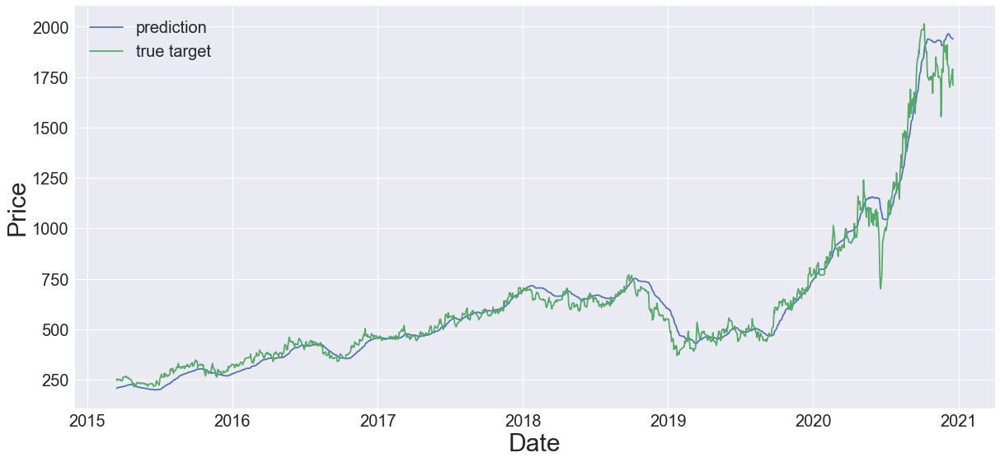

6415 Test Data


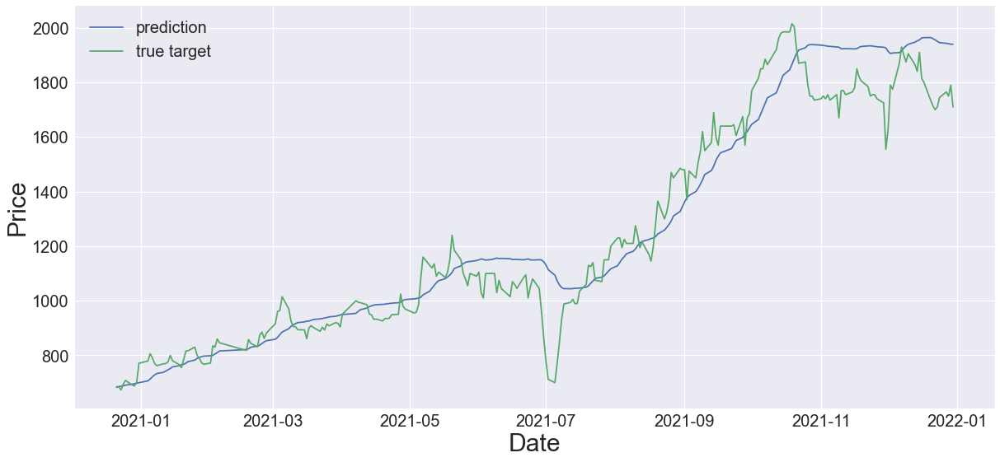

Model: "sequential_102"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_102 (LSTM)             (None, 10)                760       
                                                                 
 dense_204 (Dense)           (None, 5)                 55        
                                                                 
 dense_205 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 735ms/step - loss: 0.1276 - mse: 0.0606 - val_loss: 0.1247 - val_mse: 0.0653
Epoch 2/50
12/12 [==============================] - 7s 582ms/step - loss: 0.0749 - mse: 0.0207 - val_loss: 0.0551 - val_mse: 0.0076
Epoch 3/50
12/12 [==============================] - 7

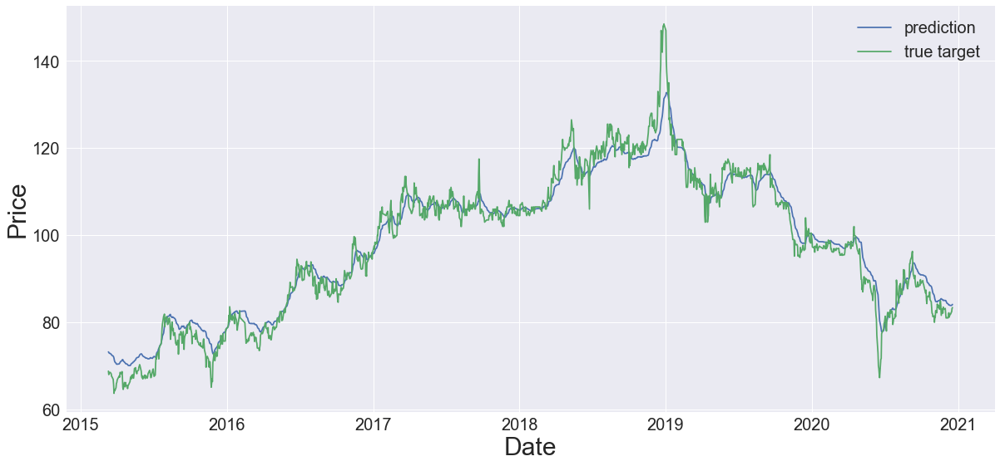

6505 Test Data


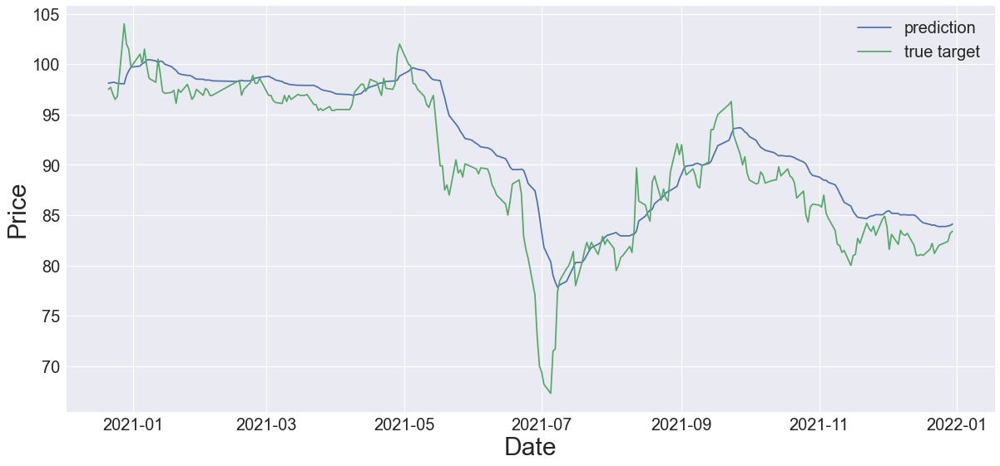

Model: "sequential_103"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_103 (LSTM)             (None, 10)                760       
                                                                 
 dense_206 (Dense)           (None, 5)                 55        
                                                                 
 dense_207 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 692ms/step - loss: 0.0665 - mse: 0.0014 - val_loss: 0.0607 - val_mse: 0.0039
Epoch 2/50
12/12 [==============================] - 7s 625ms/step - loss: 0.0521 - mse: 6.5487e-04 - val_loss: 0.0465 - val_mse: 0.0020
Epoch 3/50
12/12 [==============================]

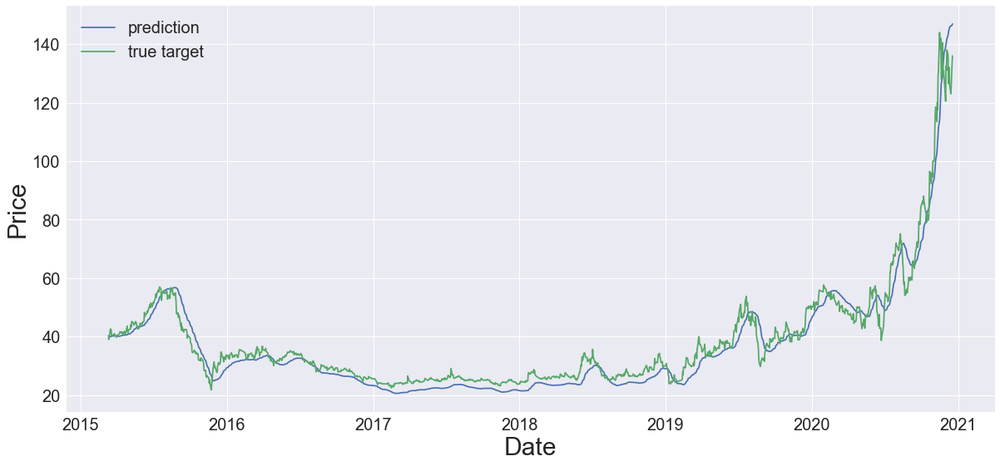

8046 Test Data


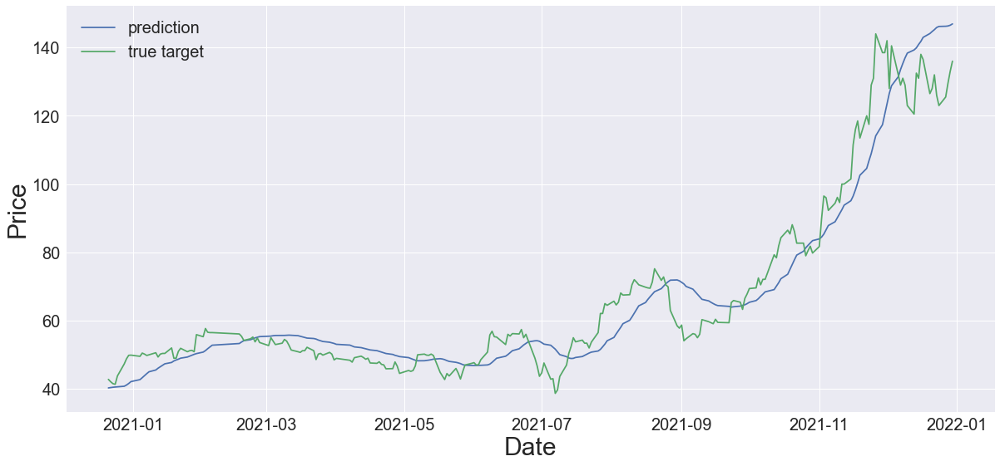

Model: "sequential_104"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_104 (LSTM)             (None, 10)                760       
                                                                 
 dense_208 (Dense)           (None, 5)                 55        
                                                                 
 dense_209 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 14s 774ms/step - loss: 0.0701 - mse: 0.0030 - val_loss: 0.0709 - val_mse: 0.0121
Epoch 2/50
12/12 [==============================] - 7s 602ms/step - loss: 0.0551 - mse: 0.0017 - val_loss: 0.0496 - val_mse: 0.0035
Epoch 3/50
12/12 [==============================] - 7

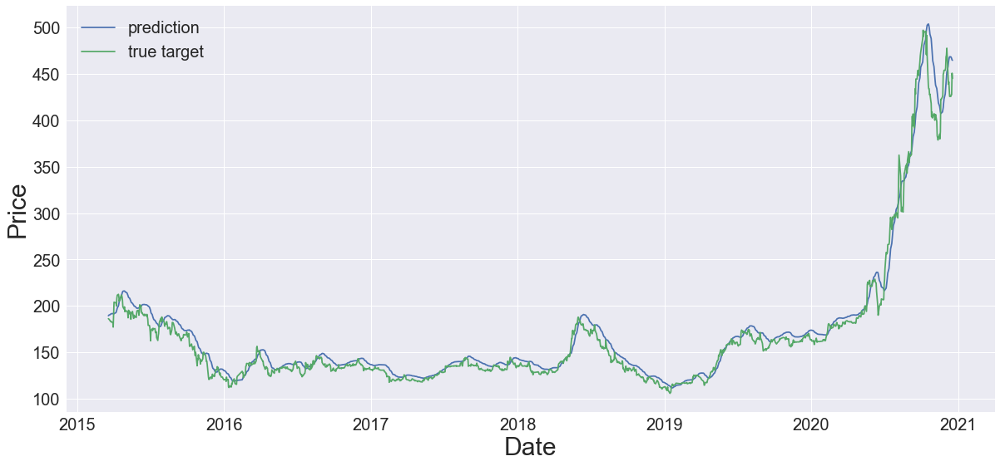

8454 Test Data


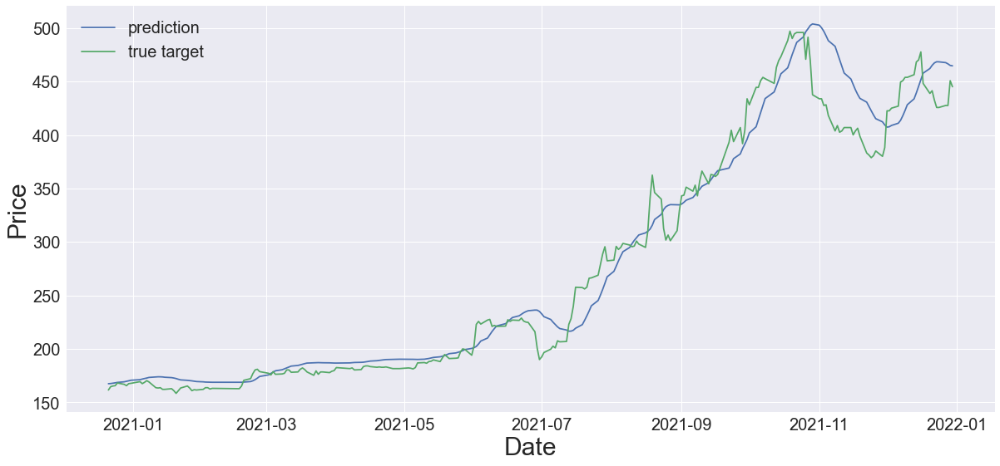

Model: "sequential_105"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_105 (LSTM)             (None, 10)                760       
                                                                 
 dense_210 (Dense)           (None, 5)                 55        
                                                                 
 dense_211 (Dense)           (None, 1)                 6         
                                                                 
Total params: 821
Trainable params: 821
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
12/12 [==============================] - 13s 704ms/step - loss: 0.1601 - mse: 0.0966 - val_loss: 0.0636 - val_mse: 0.0076
Epoch 2/50
12/12 [==============================] - 7s 586ms/step - loss: 0.0649 - mse: 0.0138 - val_loss: 0.0539 - val_mse: 0.0093
Epoch 3/50
12/12 [==============================] - 7

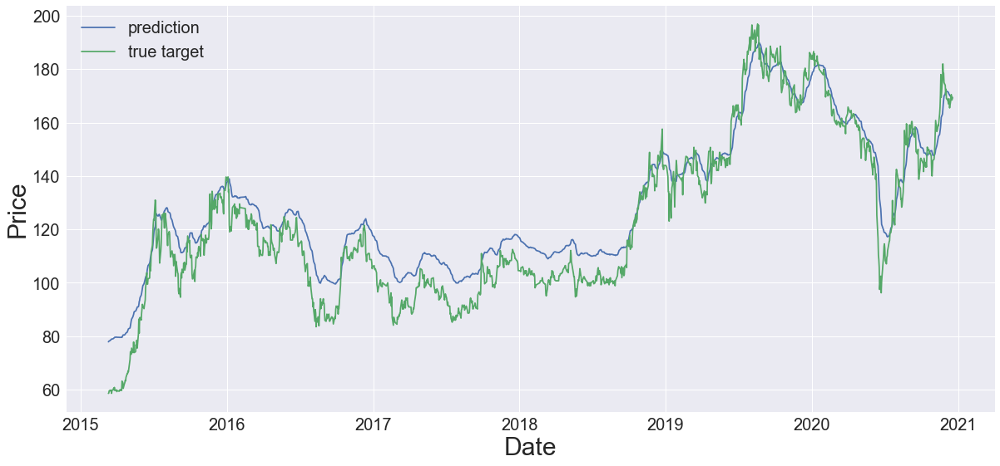

9910 Test Data


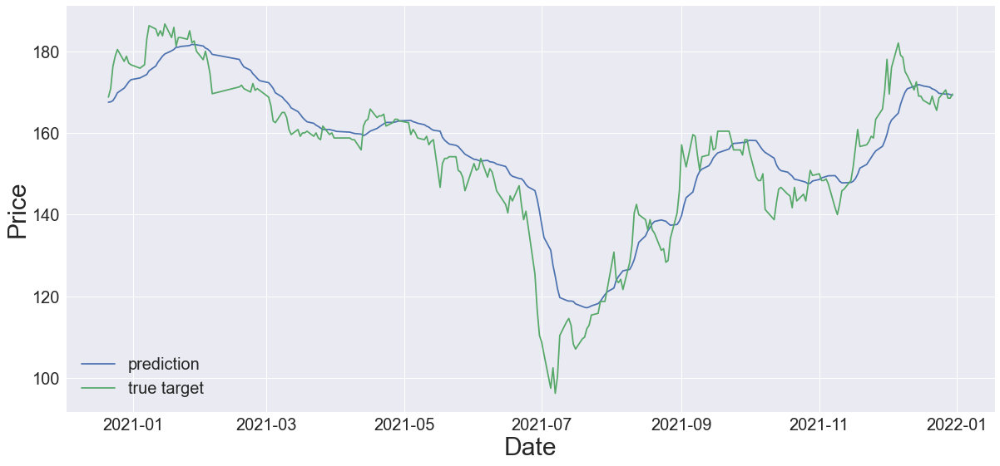

In [33]:
#
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaler_tmp = MinMaxScaler()

train_predict=pd.DataFrame()
test_predict=pd.DataFrame()

train_evaluation=pd.DataFrame()
test_evaluation=pd.DataFrame()

Test_PredictPrice =  pd.DataFrame()

# train Model
learning_rate = 0.003
reg = L1L2(l1=0.001, l2=0.001)

model_checkpoint_callback = ModelCheckpoint(
    filepath='./best_model.hdf5',
    save_weights_only=True,
    monitor='val_mse',
    mode='min',
    save_best_only=True)

#each stock
for stock_id in InvTrgt:
    
    train_norm = merge[stock_id ].copy()
    train_norm.iloc[:] = scaler.fit_transform(train_norm[:])
    
    X_train, Y_train = buildTrain(train_norm,1008,63) #pastDay = 過去三年, futureDay＝未來一年
    X_train,Y_train,X_test,Y_test = TestData(X_train,Y_train) 
    
    
    #
    model = buildManyToOneModel(X_train.shape, reg, lr = learning_rate)   
    model.fit(X_train, Y_train, epochs=50, batch_size=128, validation_data=(X_test, Y_test), callbacks=[model_checkpoint_callback])
    #
    scaler.fit_transform(merge[stock_id])
    scaler_tmp.scale_, scaler_tmp.min_, scaler_tmp.data_min_, scaler_tmp.data_max_ = scaler.scale_[0], scaler.min_[0], scaler.data_min_[0], scaler.data_max_[0]
    
   
    # Backtest
    train_predict = model.predict(X_train)
    Y_train =reshaper(Y_train)
    train_evaluation[stock_id] = evaluation(scaler_tmp.inverse_transform(train_predict), scaler_tmp.inverse_transform(Y_train))

   
    # forecasting
    test_predict = model.predict(X_test)
    Y_test =reshaper(Y_test)
    test_evaluation[stock_id] = evaluation(scaler_tmp.inverse_transform(test_predict), scaler_tmp.inverse_transform(Y_test))
    testPredict = test_predict.reshape(-1)
    Test_PredictPrice[stock_id]  = testPredict.tolist()
    
    #plot
    print(f'{stock_id} Train Data')
    plotPrice_train(train_predict,Y_train)
    
    print(f'{stock_id} Test Data')
    plotPrice_test(test_predict,Y_test)

In [34]:
# print Evaluation
print("Train Evaluation")
#display( pd.DataFrame({'stock_id':[stock_id for stock_id in InvTrgt ]  , 'MAE':MAE , 'MAPE':MAPE , 'R2':R2}))
display( pd.DataFrame( {'stock_id':[stock_id for stock_id in InvTrgt ], 'R2':[train_evaluation[stock_id][0] for stock_id in InvTrgt] ,'RMSE':[train_evaluation[stock_id][1] for stock_id in InvTrgt], 'MAE':[train_evaluation[stock_id][2] for stock_id in InvTrgt], 'MAPE':[train_evaluation[stock_id][3] for stock_id in InvTrgt]}))
display( pd.DataFrame( {'stock_id':[stock_id for stock_id in InvTrgt ], 'R2':[train_evaluation[stock_id][0] for stock_id in InvTrgt] ,'RMSE':[train_evaluation[stock_id][1] for stock_id in InvTrgt], 'MAE':[train_evaluation[stock_id][2] for stock_id in InvTrgt], 'MAPE':[train_evaluation[stock_id][3] for stock_id in InvTrgt]}).sum())
print("Test Evaluation")
display( pd.DataFrame( {'stock_id':[stock_id for stock_id in InvTrgt ], 'R2': [test_evaluation[stock_id][0] for stock_id in InvTrgt] ,'RMSE': [test_evaluation[stock_id][1] for stock_id in InvTrgt], 'MAE': [test_evaluation[stock_id][2] for stock_id in InvTrgt], 'MAPE': [test_evaluation[stock_id][3] for stock_id in InvTrgt]}))
display( pd.DataFrame( {'stock_id':[stock_id for stock_id in InvTrgt ], 'R2': [test_evaluation[stock_id][0] for stock_id in InvTrgt] ,'RMSE': [test_evaluation[stock_id][1] for stock_id in InvTrgt], 'MAE': [test_evaluation[stock_id][2] for stock_id in InvTrgt], 'MAPE': [test_evaluation[stock_id][3] for stock_id in InvTrgt]}).sum())


Train Evaluation


,stock_id,R2,RMSE,MAE,MAPE
0,1101,0.960976,1.166559,0.840412,0.026277
1,1216,0.931809,6.063973,2.048534,0.033862
2,1301,0.960713,6.426320,1.883812,0.021112
3,1303,0.925805,4.524706,1.600443,0.023802
4,1326,0.973394,6.635420,1.914985,0.022054
5,1590,0.975942,405.915840,14.187531,0.042490
6,2002,0.882796,0.583433,0.537714,0.025253
7,2207,0.939808,788.560380,23.413995,0.062924
8,2227,0.820303,204.611682,11.284433,0.045759
9,2303,0.771002,1.392747,0.910357,0.060482


stock_id    1101121613011303132615902002220722272303230823...
R2                                                  47.556309
RMSE                                             77004.681633
MAE                                                479.094833
MAPE                                                 2.418263
dtype: object

Test Evaluation


,stock_id,R2,RMSE,MAE,MAPE
0,1101,0.531397,1.947146,1.206739,0.030020
1,1216,0.483639,5.622623,1.753848,0.025322
2,1301,0.866485,9.280478,1.980751,0.023673
3,1303,0.777513,6.641634,1.631766,0.026855
4,1326,0.892464,7.744909,1.872615,0.025654
5,1590,0.895926,808.990297,21.144651,0.043463
6,2002,0.716585,0.840586,0.685903,0.033731
7,2207,0.831670,1368.492334,24.627344,0.043933
8,2227,0.630636,136.630787,8.498245,0.033555
9,2303,0.632011,3.629903,1.563166,0.091155


stock_id    1101121613011303132615902002220722272303230823...
R2                                                  34.039472
RMSE                                             68107.273645
MAE                                                560.351918
MAPE                                                 2.589613
dtype: object

實驗二

In [35]:
def PriceToReturn(price):
    LnReturn = np.log(price / price.shift(1))
    return LnReturn

QuarterData = dict()
def SpiltQuarterData(Data, n): #split data to n chunks
    h = int(len(Data)/n)
    for i in range(n):
        QuarterData[i+1] = Data.iloc[ h*i : h*(i+1) ]
    return QuarterData[1], QuarterData[2], QuarterData[3], QuarterData[4]

#LnReturn = PriceToReturn(test_predict['2330'])
#s=SpiltQuarterData(Data = LnReturn, n=4)
#s[0],s[1],s[2],s[3]

In [36]:

predQuarterData = pd.DataFrame()
actualQuarterData = pd.DataFrame()

for stock_id in InvTrgt:
    #chunking predit data to quarter
    temp_pred_return = PriceToReturn(Test_PredictPrice[stock_id])
    predQuarterData[stock_id] = SpiltQuarterData(Data = temp_pred_return, n=4)
    
    #chunking actual data to quarter
    actual = merge[stock_id].Returns.iloc[-252:]
    temp_actual_return = PriceToReturn(actual)
    actualQuarterData[stock_id] = SpiltQuarterData(Data = temp_actual_return, n=4)
    

In [37]:
## construct the Markowitz model
# 邊界條件向量
import numpy as np
from scipy.optimize import minimize

def Markowitz(cov_mat, avg_rets, target_rate):
    n = len(InvTrgt)
    bnds = [(0, 1) for i in range(n)]  # weights for boundaries between 0%..100%. No leverage, no shorting
    random_weight = [1/n]*n            # start optimization with equal weights

    def objectfun(random_weight):
        return (-1)*(np.dot(random_weight, avg_rets.T) - 1/2 * 1 * (np.dot(np.dot(random_weight,cov_mat),np.array(random_weight).T)))
    def constraint(random_weight):
        return (-1)*(sum(random_weight)-1) 
    Result = minimize(objectfun, random_weight, bounds=bnds, constraints={'type': 'ineq', 'fun': constraint})
    #return Result.jac, Result.x #returns,weight
    return Result.x , Result.jac


In [38]:
actualReturn = {}
preditReturn = {}
for i in range(4):
     actualReturn[i] = pd.concat([actualQuarterData['1101'][i],\
actualQuarterData['1216'][i],\
actualQuarterData['1301'][i],\
actualQuarterData['1303'][i],\
actualQuarterData['1326'][i],\
actualQuarterData['1590'][i],\
actualQuarterData['2002'][i],\
actualQuarterData['2207'][i],\
actualQuarterData['2227'][i],\
actualQuarterData['2303'][i],\
actualQuarterData['2308'][i],\
actualQuarterData['2317'][i],\
actualQuarterData['2327'][i],\
actualQuarterData['2330'][i],\
actualQuarterData['2352'][i],\
actualQuarterData['2357'][i],\
actualQuarterData['2379'][i],\
actualQuarterData['2382'][i],\
actualQuarterData['2395'][i],\
actualQuarterData['2408'][i],\
actualQuarterData['2409'][i],\
actualQuarterData['2412'][i],\
actualQuarterData['2454'][i],\
actualQuarterData['2603'][i],\
actualQuarterData['2609'][i],\
actualQuarterData['2610'][i],\
actualQuarterData['2615'][i],\
actualQuarterData['2801'][i],\
actualQuarterData['2880'][i],\
actualQuarterData['2881'][i],\
actualQuarterData['2882'][i],\
actualQuarterData['2883'][i],\
actualQuarterData['2884'][i],\
actualQuarterData['2885'][i],\
actualQuarterData['2886'][i],\
actualQuarterData['2887'][i],\
actualQuarterData['2891'][i],\
actualQuarterData['2892'][i],\
actualQuarterData['2912'][i],\
actualQuarterData['3008'][i],\
actualQuarterData['3034'][i],\
actualQuarterData['3037'][i],\
actualQuarterData['3045'][i],\
actualQuarterData['3711'][i],\
actualQuarterData['4904'][i],\
actualQuarterData['5871'][i],\
actualQuarterData['5876'][i],\
actualQuarterData['5880'][i],\
actualQuarterData['6415'][i],\
actualQuarterData['6505'][i],\
actualQuarterData['8046'][i],\
actualQuarterData['8454'][i],\
actualQuarterData['9910'][i]
], axis=1, ignore_index=True)
        
     preditReturn[i]= pd.concat([predQuarterData['1101'][i],\
predQuarterData['1216'][i],\
predQuarterData['1301'][i],\
predQuarterData['1303'][i],\
predQuarterData['1326'][i],\
predQuarterData['1590'][i],\
predQuarterData['2002'][i],\
predQuarterData['2207'][i],\
predQuarterData['2227'][i],\
predQuarterData['2303'][i],\
predQuarterData['2308'][i],\
predQuarterData['2317'][i],\
predQuarterData['2327'][i],\
predQuarterData['2330'][i],\
predQuarterData['2352'][i],\
predQuarterData['2357'][i],\
predQuarterData['2379'][i],\
predQuarterData['2382'][i],\
predQuarterData['2395'][i],\
predQuarterData['2408'][i],\
predQuarterData['2409'][i],\
predQuarterData['2412'][i],\
predQuarterData['2454'][i],\
predQuarterData['2603'][i],\
predQuarterData['2609'][i],\
predQuarterData['2610'][i],\
predQuarterData['2615'][i],\
predQuarterData['2801'][i],\
predQuarterData['2880'][i],\
predQuarterData['2881'][i],\
predQuarterData['2882'][i],\
predQuarterData['2883'][i],\
predQuarterData['2884'][i],\
predQuarterData['2885'][i],\
predQuarterData['2886'][i],\
predQuarterData['2887'][i],\
predQuarterData['2891'][i],\
predQuarterData['2892'][i],\
predQuarterData['2912'][i],\
predQuarterData['3008'][i],\
predQuarterData['3034'][i],\
predQuarterData['3037'][i],\
predQuarterData['3045'][i],\
predQuarterData['3711'][i],\
predQuarterData['4904'][i],\
predQuarterData['5871'][i],\
predQuarterData['5876'][i],\
predQuarterData['5880'][i],\
predQuarterData['6415'][i],\
predQuarterData['6505'][i],\
predQuarterData['8046'][i],\
predQuarterData['8454'][i],\
predQuarterData['9910'][i]], axis=1, ignore_index=True)

In [39]:
## construct the Markowitz model
# 邊界條件向量
import numpy as np
from scipy.optimize import minimize

def Markowitz(cov_mat, avg_rets, target_rate):
    n = len(avg_rets)
    bnds = [(0, 1) for i in range(n)]  # weights for boundaries between 0%..100%. No leverage, no shorting
    random_weight = [1/n]*n            # start optimization with equal weights

    def objectfun(random_weight):
        return (-1)*(np.dot(random_weight, avg_rets.T) - 1/2 * 1 * (np.dot(np.dot(random_weight,cov_mat),np.array(random_weight).T)))
    def constraint(random_weight):
        return (-1)*(sum(random_weight)-1) 
    Result = minimize(objectfun, random_weight, bounds=bnds, constraints={'type': 'ineq', 'fun': constraint})
    #return Result.jac, Result.x #returns,weight
    return Result.x , Result.jac

In [40]:
#Strategy:view from gru model 
def Blacklitterman(actualReturn, preditReturn, tau):
    
    # P = LinkMatrix  #weight from gru model
    # Q = ViewsMatrix #return from gru model
    P, Q  = Markowitz(preditReturn.cov(), preditReturn.mean(), target_rate)

    #from history data
    mu =actualReturn.mean()
    sigma = actualReturn.cov()
    
    ts = tau * sigma 
    
    # Calculate equilibrium excess returns with views incorporated
    # omega
    Omega = np.dot(np.dot(P,ts),P.T) * np.eye(Q.shape[0])
    middle = np.linalg.inv(np.dot(np.dot(P,ts),P.T) + Omega)
    
    C = sigma
    Pi = mu
    sub_a = np.linalg.inv(np.dot(tau, C))
    sub_b = np.dot(np.dot(np.transpose(P), np.linalg.inv(Omega)),P)
    sub_c = np.dot(np.linalg.inv(np.dot(tau, C)), Pi)
    sub_d = np.dot(np.dot(np.transpose(P), np.linalg.inv(Omega)),Q)
    posterior_mean = np.dot(np.linalg.inv(sub_a + sub_b), (sub_c + sub_d))
    posteriorSigma = sigma + ts -np.dot(ts.dot(P.T).dot(middle).dot(P),ts)
    return posterior_mean, posteriorSigma

In [48]:
# table with BL_AI
frames = []
hist_avg_rets = pd.DataFrame()
pred_avg_rets = pd.DataFrame()
Markowitz_wght = pd.DataFrame()
Markowitz_rets = pd.DataFrame()

posterior_rtns = pd.DataFrame()


BlackLitterman_wght = pd.DataFrame()
BlackLitterman_rets = pd.DataFrame()

for i in range(4):
    act_rtn = actualReturn[i]
    prd_rtn = preditReturn[i]
    
    
    # calculate quarterly mean returns
    avg_rets = act_rtn.mean()
    avg_rets = (1+avg_rets)**60-1
    prd_rets = prd_rtn.mean()
    prd_rets = (1+prd_rets)**60-1
    
    #hist_avg_rets[i] = avg_rets
    #pred_avg_rets[i] = prd_rets 
    
    # historical covariance matrix
    act_cov = act_rtn.cov()*60
    prd_cov = prd_rtn.cov()*60
    

    # set target return
    target_rate = 0.0074 # assuming seeking for a 3% yearly return, which required an 0.74% seasonally return 

    
    Markowitz_weights, Markowitz_return= Markowitz(cov_mat=act_cov, avg_rets=avg_rets, target_rate=target_rate)
    Markowitz_wght[i] = Markowitz_weights*100
    Markowitz_rets[i] = Markowitz_return
    
    
    # adjusted posterior mean returns with black-litterman
    tau = 0.01
    posterior_mean, posteriorSigma = Blacklitterman(act_rtn, prd_rtn, tau)
    posterior_rtns[i] = posterior_mean
    
    
    # calculate new weights
    BL_weights, BL_return= Markowitz(cov_mat=posteriorSigma, avg_rets=posterior_mean, target_rate=target_rate)
    BlackLitterman_wght[i] = BL_weights*100
    BlackLitterman_rets[i] = BL_return
    
    # markowitz_portfolio cumulative return in test_set
    markowitz_return = np.dot(act_rtn, np.matrix(Markowitz_weights).T)
    markowitz_return = pd.DataFrame(markowitz_return)
    markowitz_return.columns = ['Markowitz']
    # BL_portfolio cumulative return in test_set
    BL_return = np.dot(act_rtn,np.matrix(BL_weights).T)
    BL_return = pd.DataFrame( BL_return)
    BL_return.columns = ['Black-Litterman']
    # Equally weighted portfolio
    equally_weights = [0.1]*len(InvTrgt)
    equally_return = np.dot(act_rtn,np.matrix(equally_weights).T)
    equally_return = pd.DataFrame(equally_return)
    equally_return.columns = ['Equally Weighted']
    
    # Combine the portfolios
    result = pd.concat([markowitz_return,BL_return,equally_return], axis=1)
    frames.append(result)

#table
EquallyWeighted_cum_return = pd.DataFrame()
Markowitz_cum_return = pd.DataFrame()
BlackLitterman_cum_return = pd.DataFrame()


EquallyWeighted_std = []
Markowitz_std = []
BlackLitterman_std = []

EquallyWeighted_shp = []
Markowitz_shp = []
BlackLitterman_shp = []


for i in range(4):
    #投組季度累積報酬率
    Markowitz_cum_return[i]  = (1 +frames[i]['Markowitz']).cumprod()-1
    BlackLitterman_cum_return[i]  = (1 +frames[i]['Black-Litterman']).cumprod()-1
    EquallyWeighted_cum_return[i]  = (1 +frames[i]['Equally Weighted']).cumprod()-1
    
    #投組標準差
    EquallyWeighted_std.append(frames[i]['Equally Weighted'].std())
    Markowitz_std.append(frames[i]['Markowitz'].std())
    BlackLitterman_std.append(frames[i]['Black-Litterman'].std())
    


print('投組季度累積報酬率')
display(pd.concat([ BlackLitterman_cum_return.tail(1),Markowitz_cum_return.tail(1),EquallyWeighted_cum_return.tail(1)], axis=0).T)

print('投組日標準差')
display(pd.DataFrame(zip(BlackLitterman_std, Markowitz_std, EquallyWeighted_std), columns = ['BlackLitterman', 'Markowitz','EquallyWeighted'],index =['Q1','Q2','Q3','Q4']))


投組季度累積報酬率


,62,62,62
0,0.893742,0.923424,0.993886
1,4.189987,4.189987,0.887678
2,0.206158,0.218122,-0.369120
3,0.744324,0.744324,0.751026


投組日標準差


,BlackLitterman,Markowitz,EquallyWeighted
Q1,0.031957,0.036969,0.058726
Q2,0.062404,0.062404,0.073639
Q3,0.015168,0.020805,0.052404
Q4,0.034064,0.034064,0.036601


校內口試委員意見回復

In [42]:
# table with AI
frames = []
hist_avg_rets = pd.DataFrame()
pred_avg_rets = pd.DataFrame()
Markowitz_wght = pd.DataFrame()
Markowitz_rets = pd.DataFrame()

posterior_rtns = pd.DataFrame()


BlackLitterman_wght = pd.DataFrame()
BlackLitterman_rets = pd.DataFrame()

for i in range(4):
    act_rtn = actualReturn[i]
    prd_rtn = preditReturn[i]
    
    
    # calculate quarterly mean returns
    avg_rets = act_rtn.mean()
    avg_rets = (1+avg_rets)**60-1
    prd_rets = prd_rtn.mean()
    prd_rets = (1+prd_rets)**60-1
    
    #hist_avg_rets[i] = avg_rets
    #pred_avg_rets[i] = prd_rets 
    
    # historical covariance matrix
    act_cov = act_rtn.cov()*60
    prd_cov = prd_rtn.cov()*60
    

    # set target return
    target_rate = 0.0074 # assuming seeking for a 3% yearly return, which required an 0.74% seasonally return 

    
    Markowitz_weights, Markowitz_return= Markowitz(cov_mat=prd_cov, avg_rets=prd_rets, target_rate=target_rate)
    Markowitz_wght[i] = Markowitz_weights*100
    Markowitz_rets[i] = Markowitz_return
    
    # markowitz_portfolio cumulative return in test_set
    markowitz_return = np.dot(act_rtn, np.matrix(Markowitz_weights).T)
    markowitz_return = pd.DataFrame(markowitz_return)
    markowitz_return.columns = ['Markowitz']
  
    
    # Combine the portfolios
    result = pd.concat([markowitz_return], axis=1)
    frames.append(result)

#table

Markowitz_cum_return = pd.DataFrame()
Markowitz_std = []
Markowitz_shp = []



for i in range(4):
    #投組季度累積報酬率
    Markowitz_cum_return[i]  = (1 +frames[i]['Markowitz']).cumprod()-1
    #投組標準差
    Markowitz_std.append(frames[i]['Markowitz'].std())
    


print('投組季度累積報酬率')
display(pd.concat([ Markowitz_cum_return.tail(1)], axis=0).T)

print('投組日標準差')
display(pd.DataFrame(zip( Markowitz_std), columns = ['Markowitz'],index =['Q1','Q2','Q3','Q4']))



投組季度累積報酬率


,62
0,0.923424
1,0.986060
2,-0.015857
3,0.312300


投組日標準差


,Markowitz
Q1,0.036969
Q2,0.039918
Q3,0.041028
Q4,0.030945


In [70]:
# weight with BL_AI
frames = []
hist_avg_rets = pd.DataFrame()
pred_avg_rets = pd.DataFrame()
Markowitz_wght = pd.DataFrame()
Markowitz_rets = pd.DataFrame()

posterior_rtns = pd.DataFrame()


BlackLitterman_wght = pd.DataFrame()
BlackLitterman_rets = pd.DataFrame()

for i in range(4):
    act_rtn = actualReturn[i]
    prd_rtn = preditReturn[i]
    
    
    # calculate quarterly mean returns
    avg_rets = act_rtn.mean()
    avg_rets = (1+avg_rets)**60-1
    prd_rets = prd_rtn.mean()
    prd_rets = (1+prd_rets)**60-1
    
    #hist_avg_rets[i] = avg_rets
    #pred_avg_rets[i] = prd_rets 
    
    # historical covariance matrix
    act_cov = act_rtn.cov()*60
    prd_cov = prd_rtn.cov()*60
    

    # set target return
    target_rate = 0.0074 # assuming seeking for a 3% yearly return, which required an 0.74% seasonally return 

    
    Markowitz_weights, Markowitz_return= Markowitz(cov_mat=act_cov, avg_rets=avg_rets, target_rate=target_rate)
    Markowitz_wght[i] = Markowitz_weights*100
    Markowitz_rets[i] = Markowitz_return
    
    
    # adjusted posterior mean returns with black-litterman
    tau = 0.01
    posterior_mean, posteriorSigma = Blacklitterman(act_rtn, prd_rtn, tau)
    posterior_rtns[i] = posterior_mean
    
    
    # calculate new weights
    BL_weights, BL_return= Markowitz(cov_mat=posteriorSigma, avg_rets=posterior_mean, target_rate=target_rate)
    BlackLitterman_wght[i] = BL_weights*100
    # Combine 
    result = pd.concat([BlackLitterman_wght[i]], axis=0)
    frames.append(result)
pd.DataFrame(np.reshape(frames,(4,len(BlackLitterman_wght[i]))).T)

,0,1,2,3
0,4.172208e-15,3.450240e-15,2.893819e-16,0.000000e+00
1,7.847959e-15,0.000000e+00,6.135342e-15,9.922171e-16
2,1.266556e-15,0.000000e+00,0.000000e+00,0.000000e+00
3,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
4,2.472362e-15,0.000000e+00,2.493608e-15,3.826834e-16
5,2.179316e-15,0.000000e+00,7.595557e-15,6.375899e-15
6,0.000000e+00,0.000000e+00,3.120356e-15,0.000000e+00
7,0.000000e+00,0.000000e+00,4.161907e-15,0.000000e+00
8,0.000000e+00,3.812848e-15,0.000000e+00,1.059264e-15
9,0.000000e+00,0.000000e+00,3.149874e+01,0.000000e+00


In [66]:
# weight with AI
frames = []
hist_avg_rets = pd.DataFrame()
pred_avg_rets = pd.DataFrame()
Markowitz_wght = pd.DataFrame()
Markowitz_rets = pd.DataFrame()

posterior_rtns = pd.DataFrame()


BlackLitterman_wght = pd.DataFrame()
BlackLitterman_rets = pd.DataFrame()

for i in range(4):
    act_rtn = actualReturn[i]
    prd_rtn = preditReturn[i]
    
    
    # calculate quarterly mean returns
    avg_rets = act_rtn.mean()
    avg_rets = (1+avg_rets)**60-1
    prd_rets = prd_rtn.mean()
    prd_rets = (1+prd_rets)**60-1
    
    #hist_avg_rets[i] = avg_rets
    #pred_avg_rets[i] = prd_rets 
    
    # historical covariance matrix
    act_cov = act_rtn.cov()*60
    prd_cov = prd_rtn.cov()*60
    

    # set target return
    target_rate = 0.0074 # assuming seeking for a 3% yearly return, which required an 0.74% seasonally return 

    
    Markowitz_weights, Markowitz_return= Markowitz(cov_mat=prd_cov, avg_rets=prd_rets, target_rate=target_rate)
    Markowitz_wght[i] = Markowitz_weights*100
    Markowitz_rets[i] = Markowitz_return
    # Combine 
    result = pd.concat([ Markowitz_wght[i]], axis=0)
    frames.append(result)
pd.DataFrame(np.reshape(frames,(4,len(Markowitz_wght[i]))).T)

,0,1,2,3
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
1,1.545797e-13,0.000000e+00,1.352959e-13,0.000000e+00
2,1.996439e-13,0.000000e+00,0.000000e+00,0.000000e+00
3,2.522988e-14,0.000000e+00,0.000000e+00,0.000000e+00
4,1.669518e-13,0.000000e+00,0.000000e+00,3.040397e-14
5,0.000000e+00,0.000000e+00,7.332148e-14,0.000000e+00
6,0.000000e+00,2.897066e-14,0.000000e+00,0.000000e+00
7,0.000000e+00,3.282769e-14,6.291363e-14,0.000000e+00
8,7.611832e-14,0.000000e+00,0.000000e+00,0.000000e+00
9,0.000000e+00,0.000000e+00,1.369785e-13,1.565414e-12
